In [1]:
from functions import *

In [2]:
import sys, importlib
importlib.reload(sys.modules['functions'])
from functions import *

**Analysing SN2010ev, in galaxy NGC 3244, which has redshift z=0.009213 ± 7.00e-6 (He)**

# Importing data

In [3]:
#import data
file_name="../DATA/SN2010ev.fits"
data = fits.open(file_name)
cube = data[1].data   # this is the cube, a (3681 x 341 x 604) matrix with fluxes at different 3681 wavelengths and 308 x 318 spatial pixels ("spaxels")
header = data[1].header # this has information on the data cube
ecube = data[2].data # this is the cube uncertainty (3681 x 341 x 604)
print(np.shape(cube))


print(cube[0])
print(cube[0][200][300])

x_len=len(cube[0][0])
y_len=len(cube[0])

(3681, 341, 604)
[[     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 ...
 [     nan      nan      nan ... 69.65055      nan      nan]
 [     nan      nan      nan ... 68.30897      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]]
91.866684


In [ ]:
#  -- following is to the get the wavelength array
CRVAL = float(header["CRVAL3"])
NAXIS = int(header["NAXIS3"])
CDELT = float(header["CD3_3"])
CRPIX = float(header["CRPIX3"])
wave = np.array(CRVAL + CDELT * (np.arange(NAXIS) + 1 - CRPIX))

In [8]:
#testing function findWavelengths
result = findWavelengths(wave, 5000)
print("Closest elements:", result)

result = findWavelengths(wave, [5000,4000,6000])
print("Closest elements:", result)

Closest elements: (4999.6923828125, 201)
Closest elements: [(4999.6923828125, 201), (4748.4423828125, 0), (5999.6923828125, 1001)]


# Plotting cube images

## Plotting cube at Hα

In [9]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

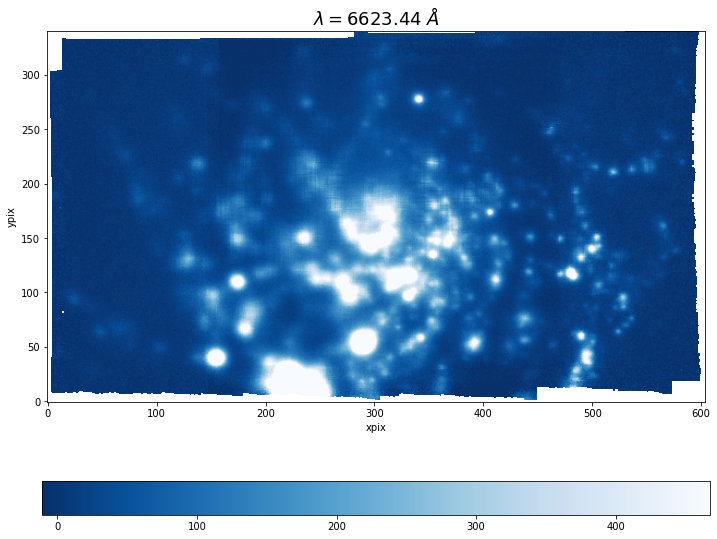

In [10]:
img_data=cube[index]

plot_image(img_data,wavelen, index, 'Blues_r')

In [11]:
print('Min:', np.nanmin(img_data))
print('Max:', np.nanmax(img_data))
print('Mean:', np.nanmean(img_data))
print('Stdev:', np.nanstd(img_data))

Min: -67.27145
Max: 6526.5054
Mean: 62.408295
Stdev: 175.11049


In [12]:
len(img_data.flatten())
y_len*x_len

205964

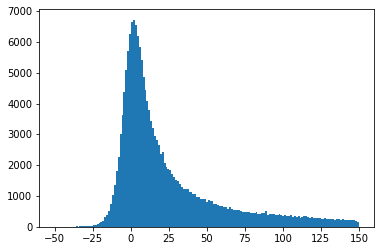

In [13]:
histogram = plt.hist(img_data.flatten(), bins='auto',range=[-50,150])

## Plotting cube at various wavelengths

In [14]:
W=5000
V=5510 #V (Visible/Green): ~551 nm
R=6580 #R (Red): ~658 nm

halpha=6563

xx=[W,V,R,halpha_obs]

selection=findWavelengths(wave, xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

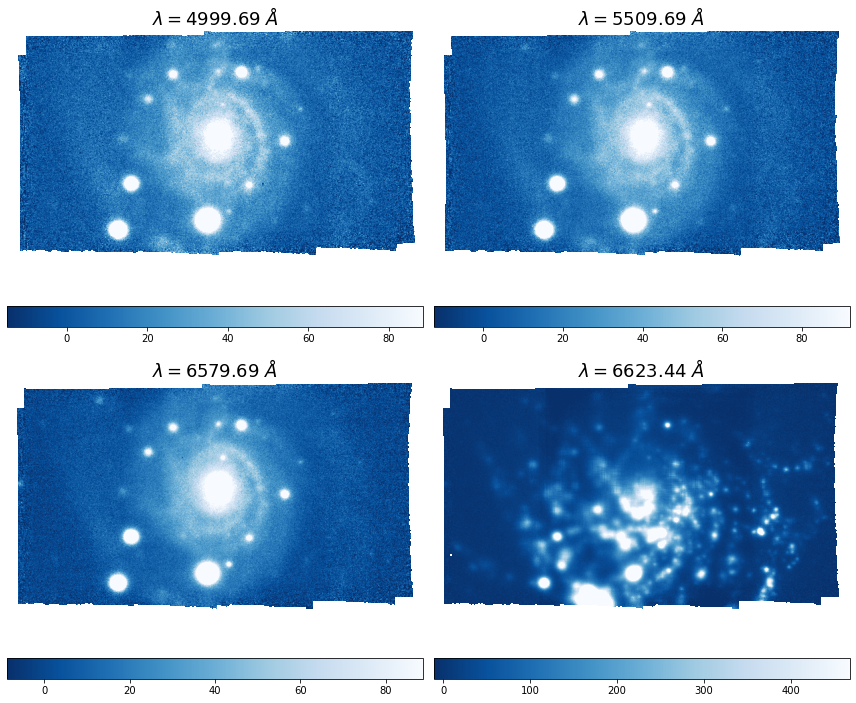

In [15]:
plot_image(cube[indices],wave[indices], indices, 'Blues_r')

## Making a gif around Halpha

In [16]:
xx=[halpha_obs-10,halpha_obs+10]

selection=findWavelengths(wave,xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

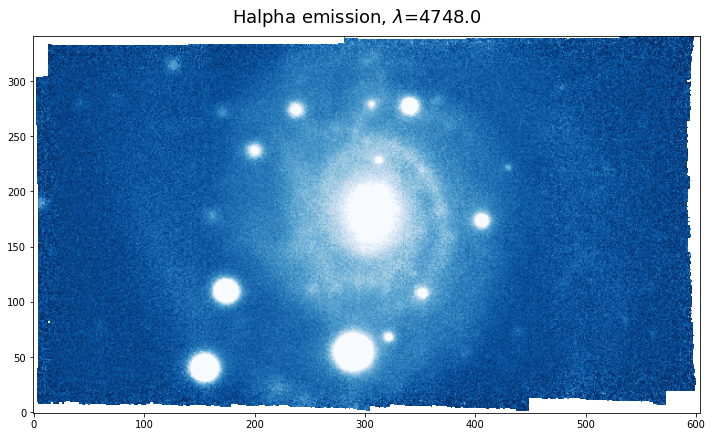

In [17]:


image_array = cube[indices[0]:indices[1]]



fig, ax = plt.subplots(figsize=(10, 8))


# Set the initial image
image=cube[indices[0]];
lo,up = np.nanpercentile(image,2),np.nanpercentile(image,98)

im = ax.imshow(image, animated=True,cmap="Blues_r",origin='lower',clim=(lo,up))
plt.tight_layout()
def update(i):
    im.set_array(image_array[i])
    fig.suptitle("Halpha emission, $\lambda$="+str(round(wave[i],0)),fontsize=18,y=0.85)
    
    return im,


# Create the animation object
animation_fig = animation.FuncAnimation(fig, update, frames=len(image_array), interval=400, blit=True,repeat_delay=15,)

# Show the animation
plt.tight_layout()
plt.show()

animation_fig.save("im.gif")

In [18]:
from PIL import Image

im = []
for n in range(20):
    arr = np.random.randint(low = 0, high = 255, size = (300, 300, 3))
    im.append(Image.fromarray(arr.astype('uint8')))

im[0].save('im.gif', save_all=True, append_images=im[1:], optimize=False, duration=200, loop=0)

## Plotting median within a certain waveband

0 1
[4748.44238281 4749.69238281]


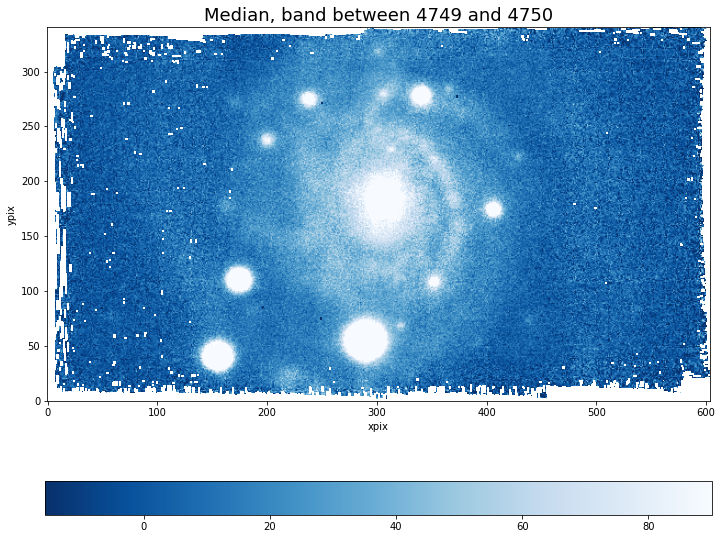

In [19]:
med=median(cube,wave,[4749,4750])


plot_image(med,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Median, band between 4749 and 4750')


#median(cube,wave,[np.max(wave),np.min(max)])


## Plotting average within a certain waveband

0 1
[4748.44238281 4749.69238281]


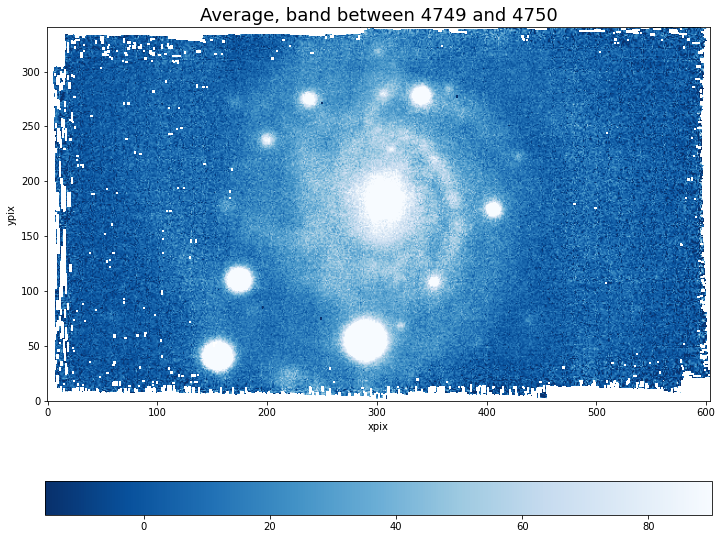

In [20]:
ave=average(cube,wave,[4749,4750])


plot_image(ave,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Average, band between 4749 and 4750')


#ave(cube,wave,[np.max(wave),np.min(max)])


# Binning

## Binning 2x2

In [21]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

img_data=cube[index]

print("dimensions before binning: ", len(img_data),len(img_data[0]))

binned_data=binning(img_data,4)

print("dimensions after binning: ", len(binned_data),len(binned_data[0]))


dimensions before binning:  341 604
dimensions after binning:  86 151


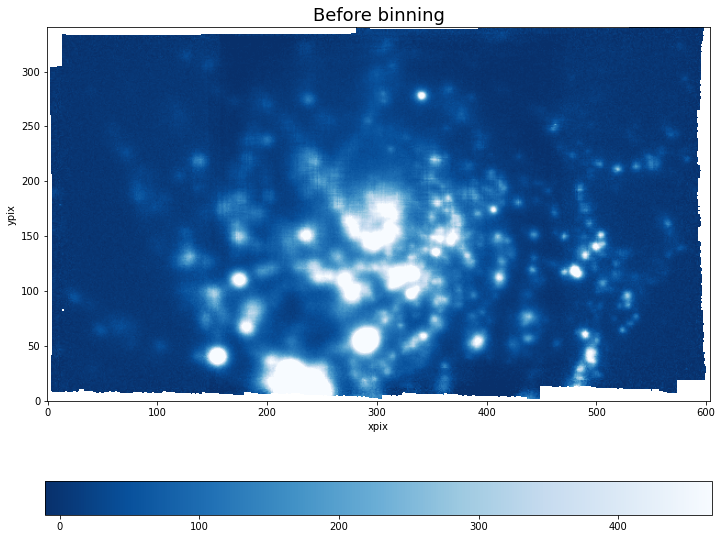

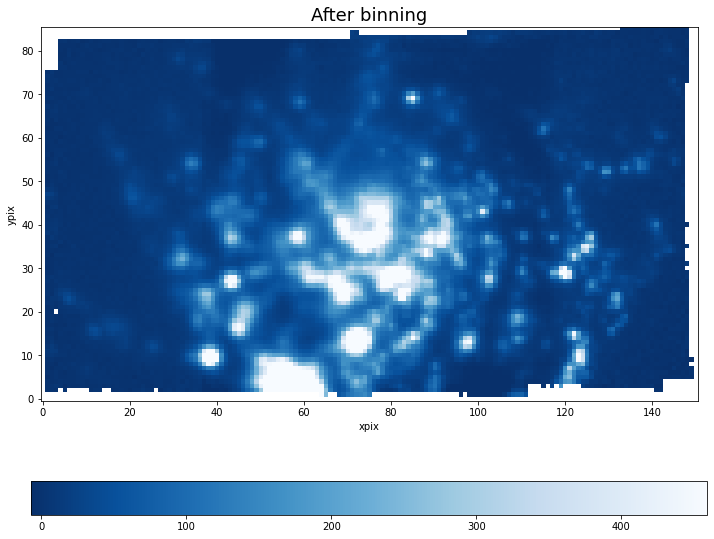

In [22]:
plot_image(img_data,wavelen, index, 'Blues_r', "Before binning")
plot_image(binned_data,wavelen, index, 'Blues_r',"After binning")

In [23]:
np.shape(cube)

(3681, 341, 604)

## Region w/ high SNR

Zoom in area of background signal

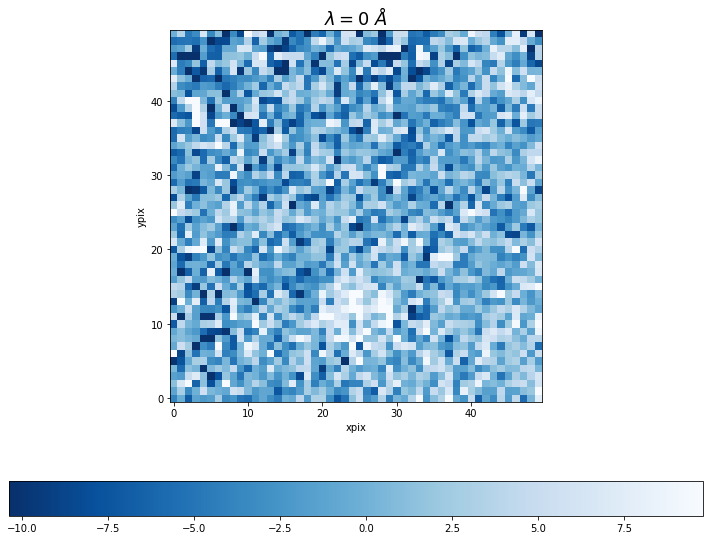

In [24]:
bg=img_data[270:320, 15:65]
plot_image(bg,0,0,'Blues_r')

In [25]:
# background noise
noise = np.nanstd(bg)

snr_map = img_data / noise
mean_snr = np.nanmean(snr_map)
threshold = 0.5 * mean_snr


square_size = 1000


#best square
best_square = None
best_snr = -np.inf  
best_coords = (0, 0)


h, w = image.shape
for y in range(0, h - square_size + 1, square_size):
    for x in range(0, w - square_size + 1, square_size):
        
        block = snr_map[y:y+square_size, x:x+square_size]

        block_mean_snr = np.mean(block)

        if block_mean_snr > best_snr:
            best_snr = block_mean_snr
            best_square = block
            best_coords = (y, x)

if best_square is not None:
    np.save("../best_snr_square.npy", best_square)
    print(f"Saved the best SNR square at {best_coords} with mean SNR {best_snr:.2f}")

best_square = np.load("../best_snr_square.npy")
print(best_square)

[[24.733227  23.659376  23.296698  ...  8.002031   6.8485003  6.3015223]
 [25.289423  24.369799  22.9598    ...  6.986258   6.1466255  7.6385193]
 [23.431923  22.804512  24.332674  ...  7.397483   7.678427   5.837128 ]
 ...
 [31.349007  31.20333   35.570824  ... 10.715965  10.636392  11.201308 ]
 [28.347382  27.447086  30.333021  ...  9.965655  11.025977  11.6718   ]
 [25.059385  26.852942  27.987513  ...  9.946177  11.049753  11.41961  ]]


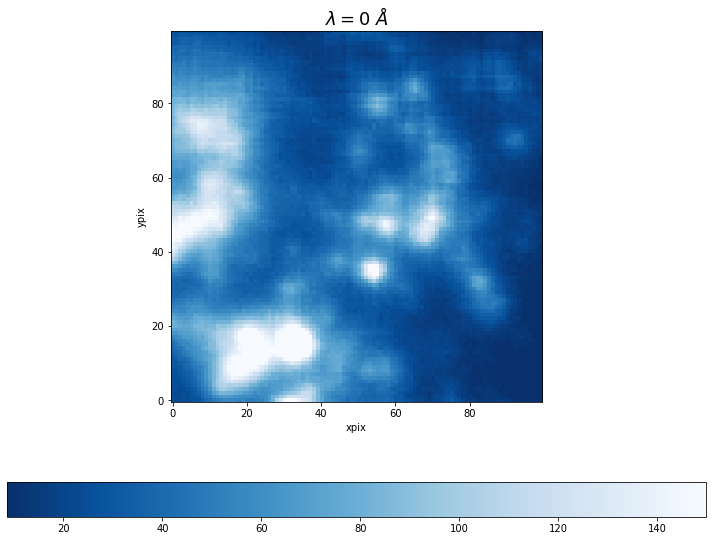

In [26]:
plot_image(best_square,0,0,'Blues_r')

## Binning of galaxy bulge

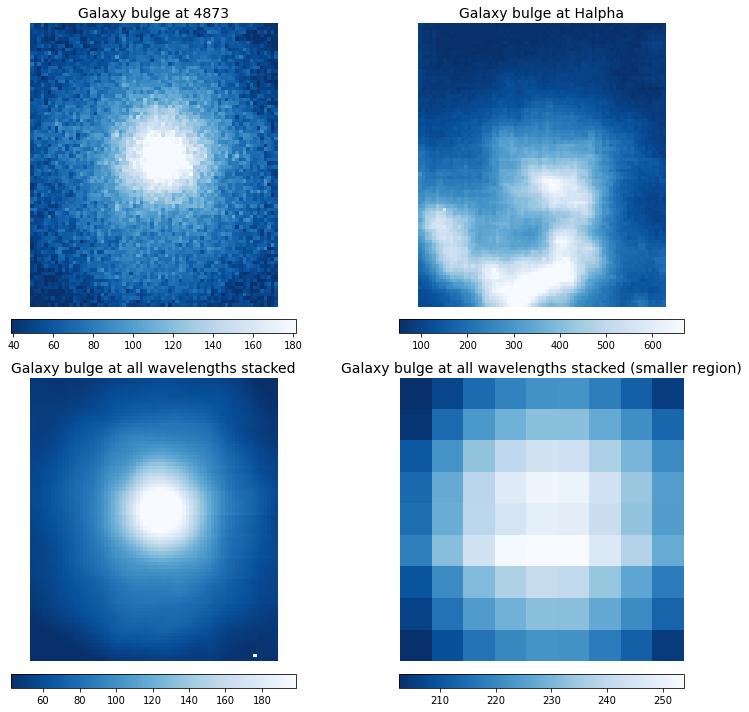

In [27]:
bulge=cube[:,140:220,270:340];
ebulge=ecube[:,140:220,270:340];

small_bulge=cube[:,178:187,302:311]
#small_bulge=cube[:,181:185,305:307]

images = [
    bulge[100],
    bulge[index], 
    stack_all(bulge),
    stack_all(small_bulge)
]

titles = [
    "Galaxy bulge at "+str(int(round(wave[100],0))),
    "Galaxy bulge at Halpha",
    "Galaxy bulge at all wavelengths stacked",
    "Galaxy bulge at all wavelengths stacked (smaller region)"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [28]:
stacked_bulge=stack(bulge,wave,number_images=10,central_wavelength=halpha_obs)
stacked_ebulge=stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs)

binned_bulge=binning(bulge[index],4)
ebinned_bulge=binning(ebulge[index],4)

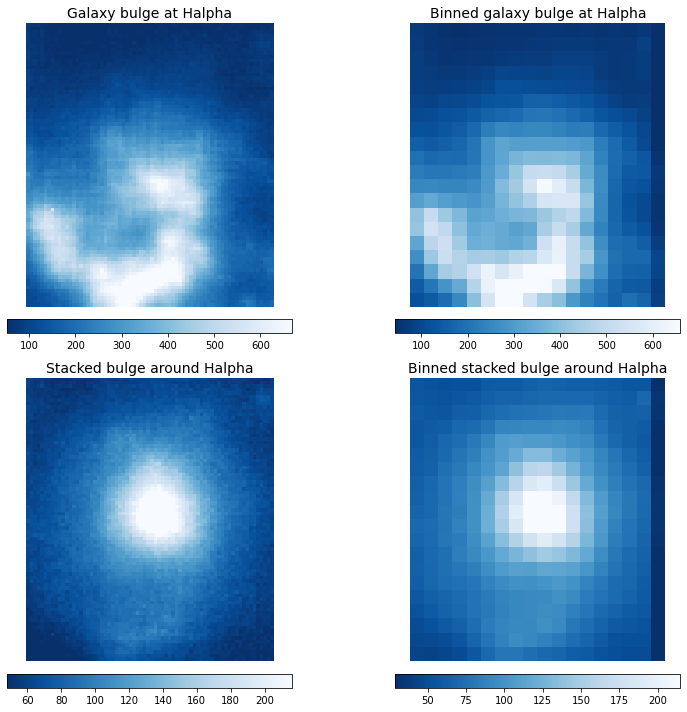

In [29]:
images = [
    bulge[index], 
    binned_bulge, 
    stacked_bulge, 
    binning(stacked_bulge, 4)
]

titles = [
    "Galaxy bulge at Halpha",
    "Binned galaxy bulge at Halpha",
    "Stacked bulge around Halpha",
    "Binned stacked bulge around Halpha"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [30]:
binned_stacked_bulge=binning(stack(bulge,wave,number_images=10,central_wavelength=halpha_obs),4)
binned_stacked_ebulge=binning(stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs),4)

print("Median SNR before binning = ",np.median(signaltonoise(stacked_bulge,stacked_ebulge)), "\nMedian SNR after stacking&binning = ",np.median(signaltonoise(binned_stacked_bulge,binned_stacked_ebulge)))
      

Median SNR before binning =  3.9969385 
Median SNR after stacking&binning =  3.963274895438916


so SNR is lower after binning?(*) could be because i am computing the same SNR for a bin for all the pixels that were collapsed

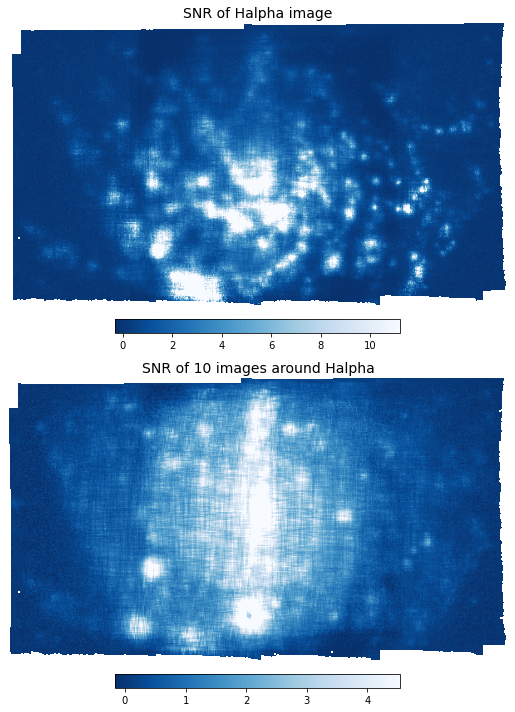

Average of SNR in the image is  1.5096688
Average of SNR in the image is  1.0932695
Median of SNR in the image is  0.4109841
Median of SNR in the image is  0.58107907

SNR gets worse on average, but not in median(**)


In [31]:
snr1=signaltonoise(cube[index],ecube[100])
#plot_image(snr,0,0,colormap='Blues_r',title="SNR of Halpha image")

stacked_galaxy=stack(cube,wave,number_images=10,central_wavelength=halpha_obs)
stacked_uncertainties=stack(ecube,wave,number_images=10,central_wavelength=halpha_obs)


snr2=signaltonoise(stacked_galaxy,stacked_uncertainties)

plot_images([snr1,snr2],wavelengths=[0, 0],colormap='Blues_r',titles=["SNR of Halpha image","SNR of 10 images around Halpha"])

print("Average of SNR in the image is ",np.nanmean(snr1))
print("Average of SNR in the image is ",np.nanmean(snr2))
print("Median of SNR in the image is ",np.nanmedian(snr1))
print("Median of SNR in the image is ",np.nanmedian(snr2))
print("\nSNR gets worse on average, but not in median(**)")

## Stacked galaxy bulge spetra

Text(0.5, 1.0, 'Median spectra of galaxy bulge')

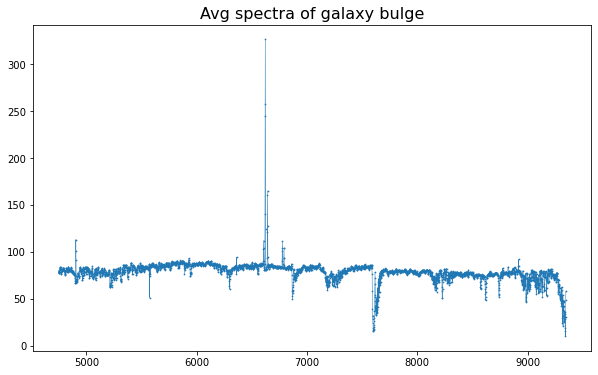

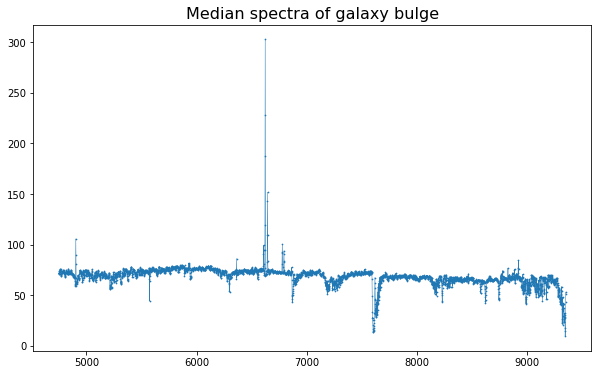

In [32]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(bulge),s=0.5)
plt.title("Avg spectra of galaxy bulge",fontsize=16)



plt.figure(figsize=(10,6))

median_bulge=median_spectra_of_region(bulge)
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)
plt.title("Median spectra of galaxy bulge",fontsize=16)




In [33]:
new_wave=wave/(1+z)
halpha_obs

6623.2630764

in x_obs we look for halpha_obs=6562.8*(1+z)

so in x_obs/(1+z) we look for 6562.8

Text(0.5, 1.0, 'Median spectra of smaller region of galaxy bulge')

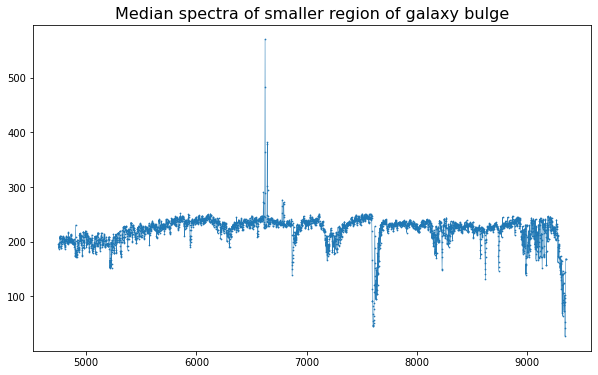

In [34]:
plt.figure(figsize=(10,6))



plt.plot(wave,median_spectra_of_region(small_bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_spectra_of_region(small_bulge),s=0.5)
plt.title("Median spectra of smaller region of galaxy bulge",fontsize=16)

#plt.xlim(halpha_obs-50,halpha_obs+50)

## Different galaxy regions

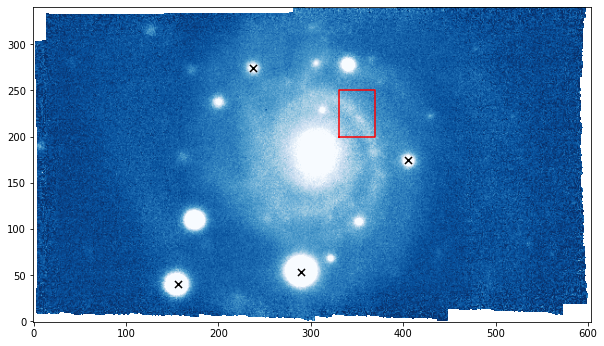

In [38]:
arm=cube[:,200:250,330:370]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [330, 330, 370, 370, 330]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline


star_x=[289,156,237,405]#175
star_y=[53,40,274,175]#110
plt.scatter(star_x,star_y,s=50,marker='x',c='black')


spectra at star (single pixel)

In [39]:
arr=np.transpose((star_x,star_y))
lbls = ["Star (single pixel spectra) at (x,y)= ({},{})".format(row[0], row[1]) for row in arr]

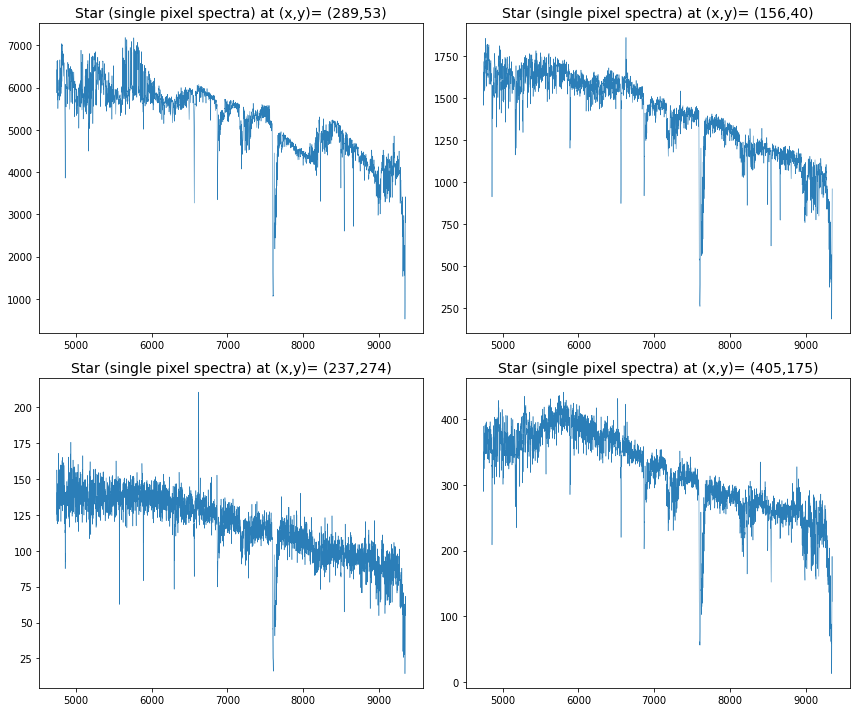

In [40]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = np.array(axes).reshape(-1)
    
for i in range(4):
    lo, up = np.nanpercentile(images[i], 2), np.nanpercentile(images[i], 98)
    im = axes[i].plot(wave,cube[:,star_y[i],star_x[i]],linewidth=0.5,alpha=0.95)
    axes[i].set_title(lbls[i], fontsize=14)
    
# Hide unused subplots if grid has extra slots
for j in range(4, len(axes)):
    axes[j].axis('off')
    
    

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Median spectra of galaxy arm')

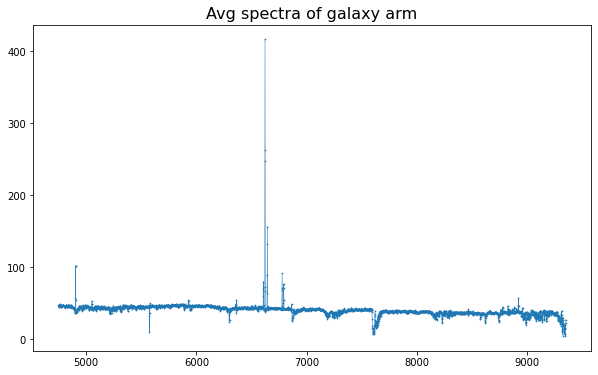

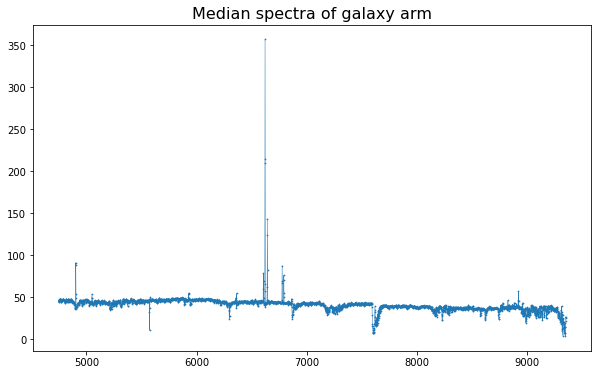

In [41]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(arm),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(arm),s=0.5)
plt.title("Avg spectra of galaxy arm",fontsize=16)



plt.figure(figsize=(10,6))

median_arm=median_spectra_of_region(arm)
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy arm",fontsize=16)

Text(0.5, 1.0, 'Median spectra of galaxy bg')

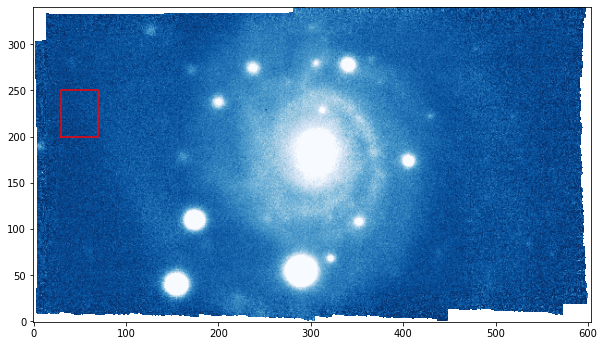

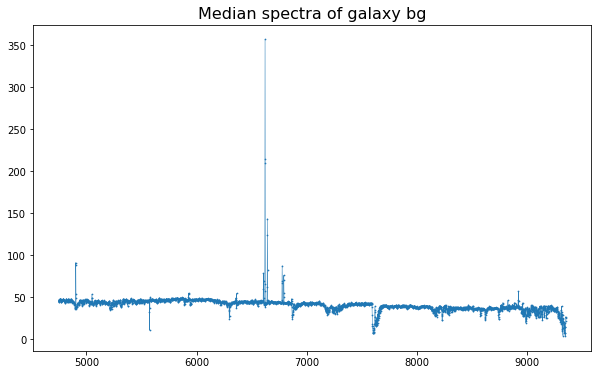

In [42]:
bg=cube[:,200:250,30:70]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [30, 30, 70, 70, 30]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline




plt.figure(figsize=(10,6))

plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy bg",fontsize=16)

## Plotting uncertainty of spectra

In [43]:
uncertainty=ecube[:,200:250,30:70]
y_err=np.sqrt(np.median(uncertainty, axis=(1, 2)));

np.median(uncertainty[2])

88.63081

In [44]:
median_bg=median_spectra_of_region(bg)

y_err2=mad(median_bg)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 0.21641612


In [45]:
np.sqrt(y_err[2])

3.0682886

In [46]:
median_bg=median_spectra_of_region(bg)

Text(0.5, 1.0, 'Background spectra')

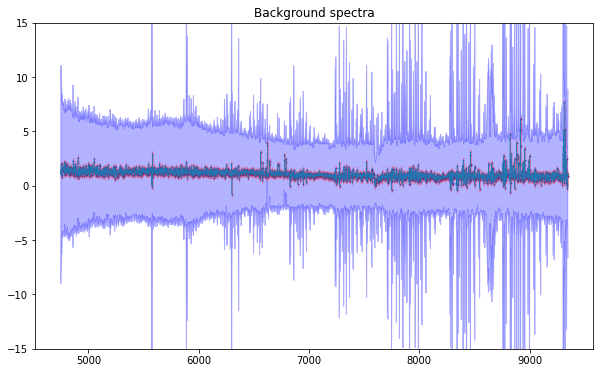

In [47]:
plt.figure(figsize=(10,6))

plt.plot(wave,median_bg,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bg,s=0.5)

plt.fill_between(wave,median_bg - y_err, median_bg + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bg - y_err2, median_bg + y_err2, color='red', alpha=0.3, label="Uncertainty")
plt.ylim(-15,15)

plt.title("Background spectra")

In [48]:
y_err2=mad(median_bulge)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 3.8055344


Text(0.5, 1.0, 'Bulge spectra')

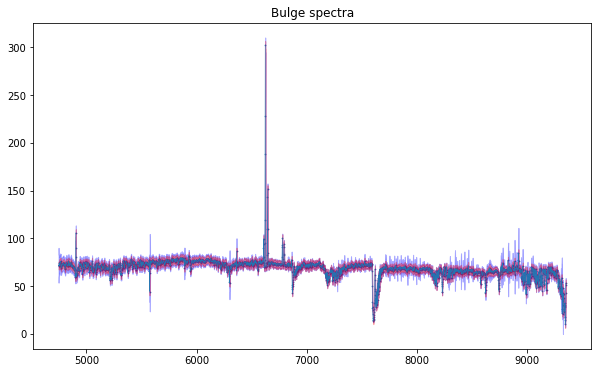

In [49]:
y_err=np.sqrt(np.median(ebulge, axis=(1, 2)));#median absolute deviaton=MAD

plt.figure(figsize=(10,6))

plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bulge - y_err2, median_bulge + y_err2, color='red', alpha=0.3, label="Uncertainty")
#plt.ylim(-15,15)
plt.title("Bulge spectra")

In [50]:
print("median snr of spectra is ",np.nanmedian(signaltonoise_spec(median_bulge,y_err)))

median snr of spectra is  13.528046


# EW

## EW - parametric

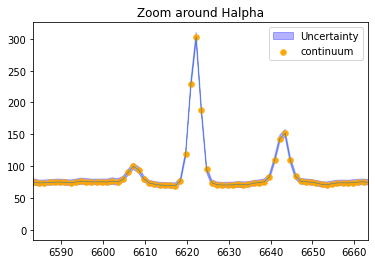

In [51]:
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")

x_min, x_max= plt.xlim(halpha_obs-40,halpha_obs+40)
plt.title("Zoom around Halpha")
x_chopped,y_chopped=chop_data(wave,median_bulge,x_min,x_max)

plt.scatter(x_chopped,y_chopped,linewidth=0.5,alpha=0.95,color="orange",label="continuum")

plt.legend()

In [53]:
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

continuum_fit, x_continuum, y_continuum, continuum_err =continuum(x_chopped,y_smooth)

y_continuum_fit = continuum_fit(x_chopped)


cont_err=continuum_err(x_chopped)

plt.figure(figsize=(10, 5))
plt.fill_between(x_chopped,y_continuum_fit - cont_err, y_continuum_fit + cont_err, color='red', alpha=0.4, label="continuum error")
plt.plot(x_chopped, y_chopped, label="Spectrum data", color="gray")
plt.plot(x_chopped, y_smooth, label=" Smoothed spectrum using cosine kernel", color="blue", alpha=0.5,linestyle="dotted")
plt.plot(x_chopped, y_continuum_fit, label="Fit to continuum", color="red", linewidth=2)
plt.scatter(x_continuum, y_continuum, color="green", s=10, label="Selected continuum points")
plt.xlabel("Wavelength")
plt.ylabel("Flux")
plt.legend()
#plt.xlim(6400,6500)
plt.show()

TypeError: continuum() missing 2 required positional arguments: 'y_cont' and 'central_wavelength'

In [54]:
plt.plot(x_chopped, y_continuum_fit, color="red", linewidth=2)


NameError: name 'y_continuum_fit' is not defined

In [ ]:
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)

plt.fill_between(wave,median_arm - y_err, median_arm + y_err, color='blue', alpha=0.3, label="Uncertainty")
#plt.ylim(-5,100)
plt.xlim(halpha_obs-15,halpha_obs+15)
plt.plot(x_chopped,y_continuum_fit)
plt.title("Zoom around Halpha")

In [ ]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6627)[1])

x = wave[bound1:bound2]
y = median_bulge[bound1:bound2]

y_err=np.nanmedian(ebulge[bound1:bound2], axis=(1, 2));
y_err2=np.full(len(y), mad(y))


initial_guess = initial_guess = [np.max(y), np.mean(x), np.std(x)]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess, sigma=y_err, absolute_sigma=True)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(np.min(x), np.max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])



# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")


##

xx = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

#integral
integral = trapz(y_fit, xx)

print(f"Integral using Trapezoidal's rule: {integral:.4f}")

plt.fill_between(x,y - y_err, y + y_err, color='blue', alpha=0.1, label="Error from MUSE")

plt.fill_between(x,y - y_err2, y + y_err2, color='red', alpha=0.1, label="MAD")

plt.scatter(x, y, label="Data", color="red")
plt.plot(xx, y_fit, label="Flux")
plt.scatter(xx, y_fit, label="Data", color="red",s=2.4)
#plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(xx, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


integrating smoothed spectra

In [ ]:
bound1=halpha_obs-40
bound2=halpha_obs+40

median_bulge_err=median_spectra_of_region(ebulge)

x,y,MUSEerr=chop_data(wave,median_bulge,bound1,bound2,median_bulge_err)

res=EW_parametric(x,y,MUSEerr,continuum_fit,continuum_err,method=0,plots=True)
print("EW calculated through a parametric approach is == ", res[0], " +/- ", res[1])

## fitting cont+peak together - parametric

In [ ]:
halpha_obs

In [ ]:
bound1=halpha_obs-40
bound2=halpha_obs+40

x,y=chop_data(wave,median_bulge,bound1,bound2)

    
print("EW calculated through a parametric approach is == ", EW_parametric(x,y,MUSEerr,continuum_fit,continuum_err,central_wavelength=halpha_obs,method=1,plots=True))

## picking region

In [35]:
x1=300
x2=420
y1=120
y2=200

In [36]:
halpha

6563

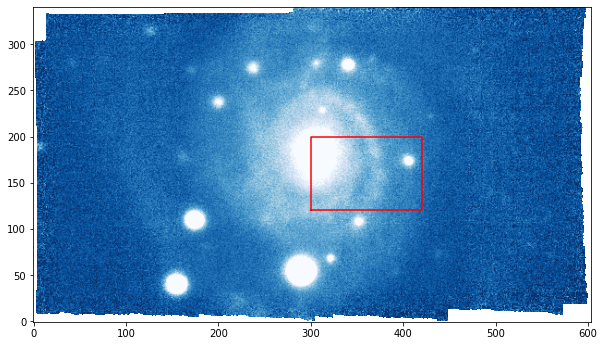

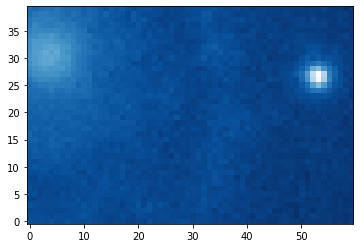

(8, 12)


In [37]:
region=cube[:,y1:y2,x1:x2]
region_err=ecube[:,y1:y2,x1:x2]
           
i=findWavelengths(wave, halpha)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [x1, x1, x2, x2, x1]
y_coords = [y1, y2, y2, y1, y1] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline

plt.show()

plt.imshow(binning(region[10], 2),"Blues_r",origin='lower');

plt.show()

print(np.shape(binning(region[10], 10)))

In [38]:
binned_region=[]
binned_region_err=[]

for w in range(0,len(wave)):
    binned_region.append(binning(region[w], 5))
    binned_region_err.append(binning(region_err[w], 5))

In [39]:
binned_region=np.array(binned_region)
binned_region_err=np.array(binned_region_err)

MUSE_err=np.sqrt(np.median(binned_region_err, axis=(1, 2)))

## EW map - parametric

In [ ]:
map=EW_map_parametric(binned_region,wave,MUSE_err,halpha_obs,plots=True)

In [ ]:
wavelen,index=findWavelengths(wave, halpha_obs)

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

data = np.transpose(map[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("EW (parametric approach)")

#####

data = np.transpose(abs(map[1] / map[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im2 = ax[1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title(r"$\sigma_{\mathrm{EW}}/\mathrm{EW}$ (parametric approach)")

#####

data = binned_region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im3 = ax[2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im3, ax=ax[2], orientation="horizontal")
ax[2].set_title("Fluxes")

plt.tight_layout()
plt.show()

In [ ]:
map2=EW_map_parametric(binned_region,wave,MUSE_err,halpha_obs,method=1,plots=False)

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

data = np.transpose(map2[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("EW (parametric approach, 3 peaks)")

#####

data = np.transpose(abs(map2[1] / map2[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im2 = ax[1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title(r"$\sigma_{\mathrm{EW}}/\mathrm{EW}$ (parametric approach, 3 peaks)")

#####

#data = binned_region[index]
data = np.transpose(abs(map2[0] - map[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im3 = ax[2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im3, ax=ax[2], orientation="horizontal")
ax[2].set_title("Difference of EW fitting 3 peaks, or just 1")

plt.tight_layout()
plt.show()

## EW - non parametric approach

In [ ]:
x_chopped,y_chopped=chop_data(wave,binned_region[:,10,10],halpha_obs-50,halpha_obs+50)

# smooth data
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

In [ ]:
plt.plot(x_chopped,y_smooth)
x,y=filterout_peaks(x_chopped,y_smooth)
plt.scatter(x,y)

kernel = cosine_kernel(3)
cont = convolve(y, kernel, mode='same')

plt.plot(x,cont)

In [ ]:
max=np.argmax(y_smooth)
bound1=x_chopped[max]-10
bound2=x_chopped[max]+10
x,y=chop_data(x_chopped,y_smooth,bound1,bound2)


# continuum
x_cont,y_cont=filterout_peaks(x_chopped,y_smooth)

kernel = cosine_kernel(4)
cont = convolve(y_cont, kernel, mode='same')
interp=interp1d(x_cont, cont, kind='cubic')



cont = interp(x)



# Compute the excess intensity above the continuum
excess_intensity = (cont-y)/cont

# Integrate the excess intensity (area over the continuum)
area_over_continuum = trapz(excess_intensity, x)
#continuum_summed = simps(continuum_fit(x), x)


plt.plot(x, cont-y, label="cont-spec", color="blue")
plt.plot(x, cont, label="Continuum", linestyle="dashed", color="red")
plt.fill_between(x, cont-y, 0, alpha=0.3, color="green", label="EW area")
plt.xlabel("Wavelength")
plt.ylabel("Intensity")
plt.legend()
plt.show()

print(f"Integral of area over continuum divided by continuum: {area_over_continuum:.2f}")


## EW map - non parametric approach

In [ ]:
map_NP=EW_map_non_parametric(binned_region,wave,halpha_obs,kernel_size=3,plots=False)

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

data = np.transpose(map_NP[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("EW (parametric approach)")

#####

data= np.transpose(abs(map_NP[1]/map_NP[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im2 = ax[1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title(r"$\sigma_{\mathrm{EW}}/\mathrm{EW}$ (parametric approach)")

#####

data = binned_region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im3 = ax[2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im3, ax=ax[2], orientation="horizontal")
ax[2].set_title("Fluxes")

plt.tight_layout()
plt.show()

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

map_diff=abs((map_NP[0]-map[0])/map_NP[0])

data= np.transpose(map_diff)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()

im1=ax[0].imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("Relative value of Differences between approaches $|\; (\mathrm{EW_{P}}-\mathrm{EW_{NP}}) \; / \; \mathrm{EW_{NP}}\; |$")


###
map_diff=abs((map_NP[0]-map[0]))

data= np.transpose(map_diff)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()


im2=ax[1].imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title("Absolute value of Differences between approaches $|\; (\mathrm{EW_{P}}-\mathrm{EW_{NP}}) \;|$")

plt.tight_layout()
plt.show()

In [ ]:
map_nonbinned_NP=EW_map_non_parametric(region,wave,halpha_obs,mode="peaks",kernel_size=3,plots=False)

In [ ]:

data= np.transpose(map_nonbinned_NP[0])
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (Non-parametric approach)")
plt.show()


###


data=region[index]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

# Velocity maps

## Non parametric

In [40]:
rest_wave=wave/(1+z)
z

0.009213

In [41]:
spec=region[:,10,10]

# chop data
x_chopped,y_chopped=chop_data(rest_wave,spec,halpha-40,halpha+40)
            
# smooth data
y_smooth=smooth_spectra(y_chopped,3)
            
# fit to continuum
cont=continuum_old(x_chopped,y_smooth,mode="peaks")[0]

In [42]:
velocity(x_chopped,y_chopped,cont,halpha)

-2.889981956273482

In [43]:
halpha

6563

In [44]:
map_vel_binned=velocity_map(binned_region,rest_wave,halpha,kernel_size=3,mode="both")

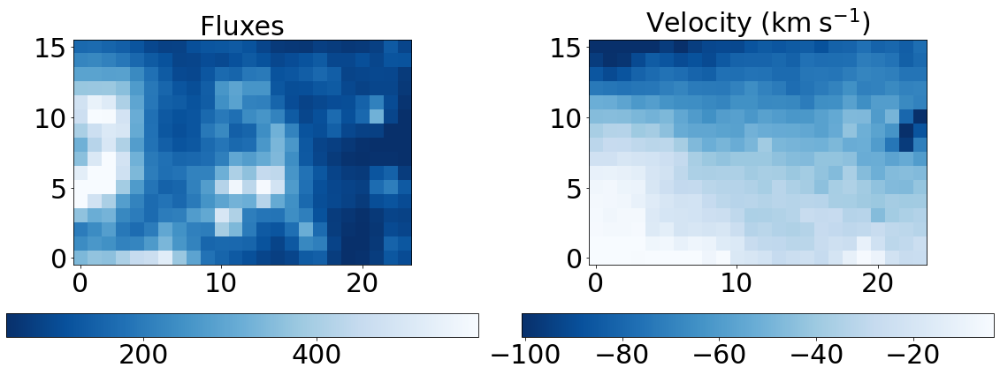

In [48]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

data = np.transpose(map_vel_binned)
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')

im1 = ax[1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))  
cbar=fig.colorbar(im1, ax=ax[1], orientation="horizontal")
cbar.ax.tick_params(labelsize=30)   #
ax[1].set_title("Velocity ($\mathrm{km} \; \mathrm{s}^{-1}$)",fontsize=30)
ax[1].tick_params(axis='both', which='major', labelsize=30)

######

data = binned_region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)

im2 = ax[0].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
cbar=fig.colorbar(im2, ax=ax[0], orientation="horizontal")
cbar.ax.tick_params(labelsize=30)   #
ax[0].set_title("Fluxes",fontsize=30)
ax[0].tick_params(axis='both', which='major', labelsize=30)


plt.tight_layout()
plt.show()

fig.savefig("velocitymap.pdf")

In [69]:
map_vel=velocity_map(region,rest_wave,halpha,kernel_size=3)

/home/rita13santos/PhD/extinction-ifs/functions.py:1175: RuntimeWarning: divide by zero encountered in scalar divide
  v = c/lambda_rest * (num/denom - lambda_rest)


NameError: name 'map_nonbinned_NP' is not defined

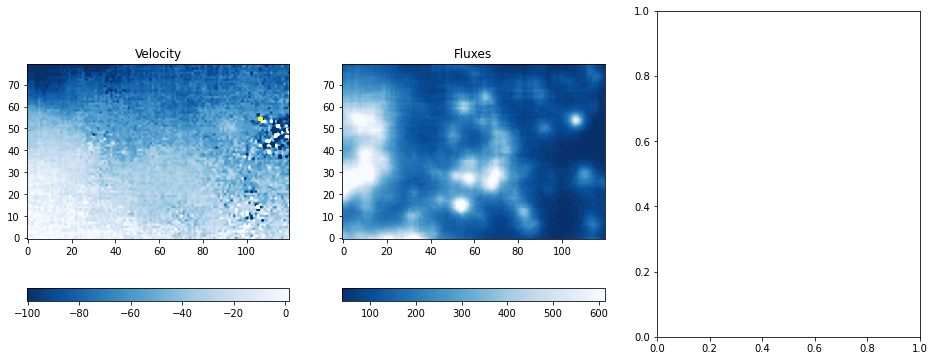

In [70]:
fig, ax = plt.subplots(1, 3, figsize=(16, 6))

data = np.transpose(map_vel)
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')

im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))  
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("Velocity")

######

data = region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)

im2 = ax[1].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title("Fluxes")


######

data = np.transpose(map_nonbinned_NP[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)

im3 = ax[2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im3, ax=ax[2], orientation="horizontal")
ax[2].set_title("EW")

plt.tight_layout()
plt.show()

## Parametric

In [302]:
map=velocity_map_parametric(binned_region,rest_wave,MUSE_err,halpha)

velocity = -0.019  +/- 0.333  at (i,j)= 0 , 0
velocity = 0.020  +/- 0.426  at (i,j)= 0 , 1
velocity = -3.866  +/- 0.443  at (i,j)= 0 , 2
velocity = -5.694  +/- inf  at (i,j)= 0 , 3
velocity = -6.355  +/- inf  at (i,j)= 0 , 4
velocity = -7.912  +/- 0.234  at (i,j)= 0 , 5
velocity = -12.770  +/- 0.339  at (i,j)= 0 , 6
velocity = -19.591  +/- inf  at (i,j)= 0 , 7
velocity = -31.484  +/- 0.530  at (i,j)= 0 , 8
velocity = -38.146  +/- 0.585  at (i,j)= 0 , 9
velocity = -44.480  +/- 0.420  at (i,j)= 0 , 10
velocity = -51.412  +/- 0.753  at (i,j)= 0 , 11
velocity = -68.027  +/- 0.918  at (i,j)= 0 , 12
velocity = -86.172  +/- 0.699  at (i,j)= 0 , 13
velocity = -99.676  +/- 0.561  at (i,j)= 0 , 14
velocity = -106.239  +/- 0.500  at (i,j)= 0 , 15
velocity = 0.712  +/- 0.208  at (i,j)= 1 , 0
velocity = -2.008  +/- 0.349  at (i,j)= 1 , 1
velocity = -3.108  +/- 0.393  at (i,j)= 1 , 2
velocity = -6.208  +/- 0.420  at (i,j)= 1 , 3
velocity = -6.236  +/- 0.278  at (i,j)= 1 , 4
velocity = -7.155  +/- 0.

velocity = -31.682  +/- 0.240  at (i,j)= 11 , 4
velocity = -35.236  +/- 0.108  at (i,j)= 11 , 5
velocity = -36.786  +/- inf  at (i,j)= 11 , 6
velocity = -38.542  +/- 0.246  at (i,j)= 11 , 7
velocity = -47.122  +/- 0.513  at (i,j)= 11 , 8
velocity = -55.695  +/- 0.576  at (i,j)= 11 , 9
velocity = -58.612  +/- 0.299  at (i,j)= 11 , 10
velocity = -63.299  +/- 0.181  at (i,j)= 11 , 11
velocity = -66.992  +/- 0.171  at (i,j)= 11 , 12
velocity = -73.201  +/- 0.258  at (i,j)= 11 , 13
velocity = -83.203  +/- 0.260  at (i,j)= 11 , 14
velocity = -88.005  +/- 0.258  at (i,j)= 11 , 15
velocity = -18.807  +/- 0.999  at (i,j)= 12 , 0
velocity = -25.988  +/- 0.558  at (i,j)= 12 , 1
velocity = -31.816  +/- 0.321  at (i,j)= 12 , 2
velocity = -32.683  +/- 0.328  at (i,j)= 12 , 3
velocity = -32.441  +/- 0.286  at (i,j)= 12 , 4
velocity = -34.435  +/- 0.159  at (i,j)= 12 , 5
velocity = -37.453  +/- 0.185  at (i,j)= 12 , 6
velocity = -39.554  +/- 0.262  at (i,j)= 12 , 7
velocity = -43.974  +/- 0.448  at (i

velocity = -44.736  +/- 0.318  at (i,j)= 23 , 5
velocity = -48.526  +/- 0.597  at (i,j)= 23 , 6
velocity = -56.964  +/- 1.344  at (i,j)= 23 , 7
velocity = -68.293  +/- 1.959  at (i,j)= 23 , 8
velocity = -83.873  +/- 19.204  at (i,j)= 23 , 9
velocity = -82.719  +/- 12.626  at (i,j)= 23 , 10
velocity = -70.031  +/- 0.656  at (i,j)= 23 , 11
velocity = -68.289  +/- 0.507  at (i,j)= 23 , 12
velocity = -76.060  +/- 0.523  at (i,j)= 23 , 13
velocity = -78.852  +/- 0.202  at (i,j)= 23 , 14
velocity = -82.829  +/- 0.229  at (i,j)= 23 , 15


In [306]:
NBmap=velocity_map_parametric(region,rest_wave,MUSE_err,halpha)#aqui

velocity = -1.833  +/- 0.455  at (i,j)= 0 , 0
velocity = -3.065  +/- 0.579  at (i,j)= 0 , 1
velocity = 0.508  +/- 0.842  at (i,j)= 0 , 2
velocity = 2.868  +/- 0.629  at (i,j)= 0 , 3
velocity = 4.223  +/- 0.688  at (i,j)= 0 , 4
velocity = 2.401  +/- 0.811  at (i,j)= 0 , 5
velocity = 0.789  +/- 0.924  at (i,j)= 0 , 6
velocity = 0.750  +/- 1.149  at (i,j)= 0 , 7
velocity = -3.037  +/- 0.855  at (i,j)= 0 , 8
velocity = -2.748  +/- 1.007  at (i,j)= 0 , 9
velocity = 1.425  +/- 1.418  at (i,j)= 0 , 10
velocity = 2.101  +/- 1.256  at (i,j)= 0 , 11
velocity = -2.018  +/- 1.319  at (i,j)= 0 , 12
velocity = -4.607  +/- 1.221  at (i,j)= 0 , 13
velocity = -6.853  +/- 0.830  at (i,j)= 0 , 14
velocity = -4.303  +/- inf  at (i,j)= 0 , 15
velocity = -7.496  +/- 0.662  at (i,j)= 0 , 16
velocity = -5.848  +/- inf  at (i,j)= 0 , 17
velocity = -4.334  +/- 0.553  at (i,j)= 0 , 18
velocity = -6.933  +/- 0.432  at (i,j)= 0 , 19
velocity = -4.397  +/- 0.326  at (i,j)= 0 , 20
velocity = -4.690  +/- 0.351  at (i

velocity = -5.742  +/- 0.852  at (i,j)= 2 , 17
velocity = -4.701  +/- 0.495  at (i,j)= 2 , 18
velocity = -7.647  +/- 0.461  at (i,j)= 2 , 19
velocity = -3.185  +/- 0.519  at (i,j)= 2 , 20
velocity = -3.868  +/- inf  at (i,j)= 2 , 21
velocity = -7.163  +/- 0.439  at (i,j)= 2 , 22
velocity = -8.570  +/- 0.360  at (i,j)= 2 , 23
velocity = -7.025  +/- 0.326  at (i,j)= 2 , 24
velocity = -7.260  +/- inf  at (i,j)= 2 , 25
velocity = -7.315  +/- 0.446  at (i,j)= 2 , 26
velocity = -5.217  +/- 0.380  at (i,j)= 2 , 27
velocity = -4.233  +/- 0.538  at (i,j)= 2 , 28
velocity = -9.815  +/- 0.367  at (i,j)= 2 , 29
velocity = -12.482  +/- 0.644  at (i,j)= 2 , 30
velocity = -9.794  +/- 0.514  at (i,j)= 2 , 31
velocity = -11.461  +/- 0.655  at (i,j)= 2 , 32
velocity = -10.056  +/- 0.683  at (i,j)= 2 , 33
velocity = -15.398  +/- 0.589  at (i,j)= 2 , 34
velocity = -12.936  +/- 0.538  at (i,j)= 2 , 35
velocity = -18.000  +/- 0.921  at (i,j)= 2 , 36
velocity = -24.044  +/- 0.988  at (i,j)= 2 , 37
velocity =

velocity = -13.187  +/- 0.575  at (i,j)= 4 , 33
velocity = -14.537  +/- 0.643  at (i,j)= 4 , 34
velocity = -15.491  +/- 0.693  at (i,j)= 4 , 35
velocity = -17.451  +/- 0.807  at (i,j)= 4 , 36
velocity = -20.998  +/- 0.777  at (i,j)= 4 , 37
velocity = -20.472  +/- 0.914  at (i,j)= 4 , 38
velocity = -21.943  +/- 0.877  at (i,j)= 4 , 39
velocity = -23.931  +/- 1.013  at (i,j)= 4 , 40
velocity = -28.608  +/- 0.869  at (i,j)= 4 , 41
velocity = -31.915  +/- 1.076  at (i,j)= 4 , 42
velocity = -29.925  +/- 1.015  at (i,j)= 4 , 43
velocity = -35.419  +/- 0.909  at (i,j)= 4 , 44
velocity = -35.085  +/- 1.027  at (i,j)= 4 , 45
velocity = -38.499  +/- 1.026  at (i,j)= 4 , 46
velocity = -37.002  +/- 1.048  at (i,j)= 4 , 47
velocity = -36.129  +/- 0.606  at (i,j)= 4 , 48
velocity = -41.949  +/- 0.654  at (i,j)= 4 , 49
velocity = -43.844  +/- 0.576  at (i,j)= 4 , 50
velocity = -44.047  +/- 0.758  at (i,j)= 4 , 51
velocity = -43.932  +/- 0.788  at (i,j)= 4 , 52
velocity = -45.144  +/- 0.731  at (i,j)=

velocity = -90.939  +/- 1.547  at (i,j)= 6 , 67
velocity = -93.682  +/- 0.782  at (i,j)= 6 , 68
velocity = -94.145  +/- 1.152  at (i,j)= 6 , 69
velocity = -99.242  +/- 0.946  at (i,j)= 6 , 70
velocity = -97.407  +/- 0.854  at (i,j)= 6 , 71
velocity = -101.913  +/- 0.617  at (i,j)= 6 , 72
velocity = -100.800  +/- 0.538  at (i,j)= 6 , 73
velocity = -101.642  +/- 0.557  at (i,j)= 6 , 74
velocity = -106.225  +/- 0.472  at (i,j)= 6 , 75
velocity = -102.689  +/- 0.706  at (i,j)= 6 , 76
velocity = -104.137  +/- 0.526  at (i,j)= 6 , 77
velocity = -104.034  +/- 0.742  at (i,j)= 6 , 78
velocity = -106.807  +/- 0.767  at (i,j)= 6 , 79
velocity = 5.891  +/- 0.557  at (i,j)= 7 , 0
velocity = 2.410  +/- 0.571  at (i,j)= 7 , 1
velocity = 1.911  +/- 0.594  at (i,j)= 7 , 2
velocity = 2.105  +/- 0.699  at (i,j)= 7 , 3
velocity = 1.942  +/- 0.896  at (i,j)= 7 , 4
velocity = 1.771  +/- inf  at (i,j)= 7 , 5
velocity = -2.496  +/- inf  at (i,j)= 7 , 6
velocity = -3.583  +/- 0.792  at (i,j)= 7 , 7
velocity =

velocity = -6.334  +/- 0.877  at (i,j)= 9 , 4
velocity = -3.756  +/- 0.834  at (i,j)= 9 , 5
velocity = -6.308  +/- 0.865  at (i,j)= 9 , 6
velocity = -8.988  +/- 0.878  at (i,j)= 9 , 7
velocity = -6.521  +/- 1.327  at (i,j)= 9 , 8
velocity = -4.936  +/- 0.806  at (i,j)= 9 , 9
velocity = -3.430  +/- 0.969  at (i,j)= 9 , 10
velocity = -6.656  +/- 1.089  at (i,j)= 9 , 11
velocity = -3.113  +/- 0.978  at (i,j)= 9 , 12
velocity = -4.864  +/- 0.882  at (i,j)= 9 , 13
velocity = -5.630  +/- 0.775  at (i,j)= 9 , 14
velocity = -5.521  +/- 0.889  at (i,j)= 9 , 15
velocity = -7.674  +/- 0.738  at (i,j)= 9 , 16
velocity = -7.445  +/- 0.666  at (i,j)= 9 , 17
velocity = -9.774  +/- 0.806  at (i,j)= 9 , 18
velocity = -7.884  +/- inf  at (i,j)= 9 , 19
velocity = -6.486  +/- 0.477  at (i,j)= 9 , 20
velocity = -9.158  +/- 0.566  at (i,j)= 9 , 21
velocity = -7.156  +/- 0.630  at (i,j)= 9 , 22
velocity = -9.705  +/- 0.621  at (i,j)= 9 , 23
velocity = -9.472  +/- 0.439  at (i,j)= 9 , 24
velocity = -7.397  +/

velocity = -27.475  +/- 0.747  at (i,j)= 11 , 44
velocity = -31.871  +/- 0.812  at (i,j)= 11 , 45
velocity = -37.178  +/- 0.707  at (i,j)= 11 , 46
velocity = -35.545  +/- 0.816  at (i,j)= 11 , 47
velocity = -35.159  +/- 0.694  at (i,j)= 11 , 48
velocity = -37.216  +/- 0.742  at (i,j)= 11 , 49
velocity = -41.089  +/- 0.771  at (i,j)= 11 , 50
velocity = -40.895  +/- 0.613  at (i,j)= 11 , 51
velocity = -45.546  +/- 0.853  at (i,j)= 11 , 52
velocity = -46.313  +/- 0.767  at (i,j)= 11 , 53
velocity = -47.719  +/- 0.541  at (i,j)= 11 , 54
velocity = -50.105  +/- 0.756  at (i,j)= 11 , 55
velocity = -54.494  +/- 0.748  at (i,j)= 11 , 56
velocity = -57.062  +/- 0.696  at (i,j)= 11 , 57
velocity = -56.558  +/- 0.897  at (i,j)= 11 , 58
velocity = -59.389  +/- 1.042  at (i,j)= 11 , 59
velocity = -64.346  +/- 1.364  at (i,j)= 11 , 60
velocity = -67.859  +/- 1.409  at (i,j)= 11 , 61
velocity = -72.117  +/- 1.188  at (i,j)= 11 , 62
velocity = -75.366  +/- 1.700  at (i,j)= 11 , 63
velocity = -80.989  

velocity = -90.565  +/- 0.891  at (i,j)= 13 , 68
velocity = -90.559  +/- 0.806  at (i,j)= 13 , 69
velocity = -95.703  +/- 0.655  at (i,j)= 13 , 70
velocity = -98.807  +/- 0.849  at (i,j)= 13 , 71
velocity = -100.262  +/- 0.828  at (i,j)= 13 , 72
velocity = -97.056  +/- 0.531  at (i,j)= 13 , 73
velocity = -104.209  +/- 0.703  at (i,j)= 13 , 74
velocity = -104.108  +/- 0.791  at (i,j)= 13 , 75
velocity = -101.609  +/- 0.886  at (i,j)= 13 , 76
velocity = -100.786  +/- 0.673  at (i,j)= 13 , 77
velocity = -103.102  +/- 0.737  at (i,j)= 13 , 78
velocity = -103.555  +/- 0.925  at (i,j)= 13 , 79
velocity = -0.559  +/- 0.461  at (i,j)= 14 , 0
velocity = 2.199  +/- 0.681  at (i,j)= 14 , 1
velocity = 1.023  +/- 0.851  at (i,j)= 14 , 2
velocity = -4.117  +/- 0.735  at (i,j)= 14 , 3
velocity = -1.221  +/- 0.850  at (i,j)= 14 , 4
velocity = 1.236  +/- 1.295  at (i,j)= 14 , 5
velocity = -3.780  +/- 1.142  at (i,j)= 14 , 6
velocity = -5.622  +/- 0.959  at (i,j)= 14 , 7
velocity = -3.191  +/- 1.287  at

velocity = -2.888  +/- 1.198  at (i,j)= 16 , 7
velocity = -4.346  +/- 1.446  at (i,j)= 16 , 8
velocity = -1.577  +/- 1.590  at (i,j)= 16 , 9
velocity = -8.449  +/- 1.306  at (i,j)= 16 , 10
velocity = 1.816  +/- 1.489  at (i,j)= 16 , 11
velocity = -5.226  +/- 1.333  at (i,j)= 16 , 12
velocity = -6.095  +/- 1.234  at (i,j)= 16 , 13
velocity = -2.601  +/- inf  at (i,j)= 16 , 14
velocity = -4.372  +/- 1.203  at (i,j)= 16 , 15
velocity = -11.337  +/- 1.268  at (i,j)= 16 , 16
velocity = -7.650  +/- 0.907  at (i,j)= 16 , 17
velocity = -6.855  +/- inf  at (i,j)= 16 , 18
velocity = -4.898  +/- 0.692  at (i,j)= 16 , 19
velocity = -7.056  +/- 1.123  at (i,j)= 16 , 20
velocity = -6.099  +/- inf  at (i,j)= 16 , 21
velocity = -10.976  +/- 0.938  at (i,j)= 16 , 22
velocity = -8.667  +/- 0.759  at (i,j)= 16 , 23
velocity = -9.390  +/- 0.889  at (i,j)= 16 , 24
velocity = -4.397  +/- 0.599  at (i,j)= 16 , 25
velocity = -4.930  +/- 0.555  at (i,j)= 16 , 26
velocity = -8.500  +/- 0.508  at (i,j)= 16 , 27


velocity = -7.593  +/- 1.074  at (i,j)= 18 , 18
velocity = -7.923  +/- 1.130  at (i,j)= 18 , 19
velocity = -12.204  +/- 0.993  at (i,j)= 18 , 20
velocity = -9.201  +/- 1.401  at (i,j)= 18 , 21
velocity = -12.320  +/- 0.998  at (i,j)= 18 , 22
velocity = -7.079  +/- 0.810  at (i,j)= 18 , 23
velocity = -9.776  +/- 0.936  at (i,j)= 18 , 24
velocity = -7.065  +/- 0.692  at (i,j)= 18 , 25
velocity = -6.986  +/- 0.953  at (i,j)= 18 , 26
velocity = -14.885  +/- 0.658  at (i,j)= 18 , 27
velocity = -12.489  +/- 0.941  at (i,j)= 18 , 28
velocity = -11.264  +/- 0.734  at (i,j)= 18 , 29
velocity = -12.881  +/- 0.773  at (i,j)= 18 , 30
velocity = -16.357  +/- 0.735  at (i,j)= 18 , 31
velocity = -14.265  +/- 0.681  at (i,j)= 18 , 32
velocity = -13.415  +/- 0.624  at (i,j)= 18 , 33
velocity = -17.130  +/- 0.641  at (i,j)= 18 , 34
velocity = -17.309  +/- 0.600  at (i,j)= 18 , 35
velocity = -15.174  +/- 0.557  at (i,j)= 18 , 36
velocity = -19.735  +/- 0.620  at (i,j)= 18 , 37
velocity = -20.810  +/- 0.6

velocity = -45.481  +/- 0.747  at (i,j)= 20 , 51
velocity = -45.738  +/- 0.750  at (i,j)= 20 , 52
velocity = -51.708  +/- 0.878  at (i,j)= 20 , 53
velocity = -52.928  +/- 0.874  at (i,j)= 20 , 54
velocity = -54.513  +/- 0.999  at (i,j)= 20 , 55
velocity = -60.366  +/- 1.017  at (i,j)= 20 , 56
velocity = -59.912  +/- 0.860  at (i,j)= 20 , 57
velocity = -64.838  +/- 0.863  at (i,j)= 20 , 58
velocity = -63.492  +/- 0.928  at (i,j)= 20 , 59
velocity = -67.616  +/- 0.864  at (i,j)= 20 , 60
velocity = -69.793  +/- 0.671  at (i,j)= 20 , 61
velocity = -70.811  +/- 0.614  at (i,j)= 20 , 62
velocity = -77.561  +/- 0.550  at (i,j)= 20 , 63
velocity = -79.901  +/- 0.879  at (i,j)= 20 , 64
velocity = -81.442  +/- 0.563  at (i,j)= 20 , 65
velocity = -79.749  +/- 0.470  at (i,j)= 20 , 66
velocity = -80.691  +/- 0.559  at (i,j)= 20 , 67
velocity = -81.677  +/- 0.555  at (i,j)= 20 , 68
velocity = -83.436  +/- 0.644  at (i,j)= 20 , 69
velocity = -88.225  +/- 1.026  at (i,j)= 20 , 70
velocity = -88.580  

velocity = -91.320  +/- 1.363  at (i,j)= 22 , 73
velocity = -90.832  +/- 1.651  at (i,j)= 22 , 74
velocity = -95.996  +/- 1.600  at (i,j)= 22 , 75
velocity = -97.821  +/- 1.080  at (i,j)= 22 , 76
velocity = -96.375  +/- 1.290  at (i,j)= 22 , 77
velocity = -104.983  +/- 1.173  at (i,j)= 22 , 78
velocity = -105.880  +/- 1.158  at (i,j)= 22 , 79
velocity = -3.947  +/- 0.410  at (i,j)= 23 , 0
velocity = -4.273  +/- 0.502  at (i,j)= 23 , 1
velocity = -1.430  +/- 0.618  at (i,j)= 23 , 2
velocity = -0.502  +/- 0.804  at (i,j)= 23 , 3
velocity = -2.364  +/- inf  at (i,j)= 23 , 4
velocity = -4.414  +/- 1.159  at (i,j)= 23 , 5
velocity = -2.979  +/- 1.261  at (i,j)= 23 , 6
velocity = -3.442  +/- 1.016  at (i,j)= 23 , 7
velocity = -9.061  +/- 1.798  at (i,j)= 23 , 8
velocity = -6.789  +/- 2.313  at (i,j)= 23 , 9
velocity = -3.100  +/- 1.848  at (i,j)= 23 , 10
velocity = -6.638  +/- 1.747  at (i,j)= 23 , 11
velocity = -5.360  +/- 1.457  at (i,j)= 23 , 12
velocity = -19.226  +/- 2.773  at (i,j)= 23

velocity = -5.116  +/- 1.292  at (i,j)= 25 , 12
velocity = -10.505  +/- 2.295  at (i,j)= 25 , 13
velocity = -8.233  +/- 1.521  at (i,j)= 25 , 14
velocity = -19.771  +/- 2.398  at (i,j)= 25 , 15
velocity = -10.123  +/- 2.576  at (i,j)= 25 , 16
velocity = -7.862  +/- 1.585  at (i,j)= 25 , 17
velocity = -15.558  +/- 1.457  at (i,j)= 25 , 18
velocity = -14.390  +/- 1.721  at (i,j)= 25 , 19
velocity = -13.365  +/- inf  at (i,j)= 25 , 20
velocity = -15.867  +/- 1.537  at (i,j)= 25 , 21
velocity = -16.253  +/- 1.824  at (i,j)= 25 , 22
velocity = -16.875  +/- 1.429  at (i,j)= 25 , 23
velocity = -13.893  +/- 1.818  at (i,j)= 25 , 24
velocity = -15.806  +/- 1.899  at (i,j)= 25 , 25
velocity = -14.208  +/- inf  at (i,j)= 25 , 26
velocity = -19.179  +/- 1.208  at (i,j)= 25 , 27
velocity = -13.037  +/- inf  at (i,j)= 25 , 28
velocity = -17.128  +/- 1.824  at (i,j)= 25 , 29
velocity = -23.021  +/- 1.175  at (i,j)= 25 , 30
velocity = -18.567  +/- 1.551  at (i,j)= 25 , 31
velocity = -18.626  +/- 1.593

velocity = -22.995  +/- 1.715  at (i,j)= 27 , 37
velocity = -28.858  +/- 2.494  at (i,j)= 27 , 38
velocity = -26.734  +/- 3.145  at (i,j)= 27 , 39
velocity = -32.197  +/- 2.652  at (i,j)= 27 , 40
velocity = -32.257  +/- 2.591  at (i,j)= 27 , 41
velocity = -32.156  +/- 2.232  at (i,j)= 27 , 42
velocity = -31.161  +/- 2.329  at (i,j)= 27 , 43
velocity = -40.072  +/- 2.058  at (i,j)= 27 , 44
velocity = -42.723  +/- 1.914  at (i,j)= 27 , 45
velocity = -41.217  +/- 1.774  at (i,j)= 27 , 46
velocity = -41.481  +/- 1.719  at (i,j)= 27 , 47
velocity = -43.463  +/- 1.625  at (i,j)= 27 , 48
velocity = -46.008  +/- 1.807  at (i,j)= 27 , 49
velocity = -45.149  +/- 1.747  at (i,j)= 27 , 50
velocity = -49.691  +/- 1.851  at (i,j)= 27 , 51
velocity = -51.828  +/- 1.508  at (i,j)= 27 , 52
velocity = -54.516  +/- 2.107  at (i,j)= 27 , 53
velocity = -63.012  +/- 1.731  at (i,j)= 27 , 54
velocity = -58.649  +/- 1.285  at (i,j)= 27 , 55
velocity = -52.966  +/- 1.280  at (i,j)= 27 , 56
velocity = -60.253  

velocity = -56.351  +/- 2.335  at (i,j)= 29 , 53
velocity = -58.655  +/- 2.296  at (i,j)= 29 , 54
velocity = -63.617  +/- 1.611  at (i,j)= 29 , 55
velocity = -58.254  +/- 1.258  at (i,j)= 29 , 56
velocity = -59.673  +/- 1.445  at (i,j)= 29 , 57
velocity = -68.033  +/- 1.749  at (i,j)= 29 , 58
velocity = -63.658  +/- 1.761  at (i,j)= 29 , 59
velocity = -67.479  +/- inf  at (i,j)= 29 , 60
velocity = -59.496  +/- 1.034  at (i,j)= 29 , 61
velocity = -71.298  +/- 1.424  at (i,j)= 29 , 62
velocity = -67.188  +/- 1.144  at (i,j)= 29 , 63
velocity = -68.956  +/- 1.259  at (i,j)= 29 , 64
velocity = -71.884  +/- 1.243  at (i,j)= 29 , 65
velocity = -73.181  +/- 1.075  at (i,j)= 29 , 66
velocity = -76.207  +/- 1.423  at (i,j)= 29 , 67
velocity = -74.815  +/- 1.443  at (i,j)= 29 , 68
velocity = -81.458  +/- 1.451  at (i,j)= 29 , 69
velocity = -83.840  +/- 1.127  at (i,j)= 29 , 70
velocity = -81.784  +/- 1.297  at (i,j)= 29 , 71
velocity = -78.696  +/- 1.221  at (i,j)= 29 , 72
velocity = -88.283  +/

velocity = -85.005  +/- 1.533  at (i,j)= 31 , 72
velocity = -86.160  +/- 1.622  at (i,j)= 31 , 73
velocity = -91.089  +/- 1.289  at (i,j)= 31 , 74
velocity = -92.227  +/- 2.129  at (i,j)= 31 , 75
velocity = -92.324  +/- 2.026  at (i,j)= 31 , 76
velocity = -94.246  +/- 1.668  at (i,j)= 31 , 77
velocity = -98.096  +/- 2.101  at (i,j)= 31 , 78
velocity = -101.830  +/- 1.363  at (i,j)= 31 , 79
velocity = -2.754  +/- 0.344  at (i,j)= 32 , 0
velocity = -1.490  +/- 0.466  at (i,j)= 32 , 1
velocity = -3.503  +/- 0.374  at (i,j)= 32 , 2
velocity = -0.484  +/- 0.656  at (i,j)= 32 , 3
velocity = -6.261  +/- 0.677  at (i,j)= 32 , 4
velocity = -7.496  +/- 0.722  at (i,j)= 32 , 5
velocity = -8.578  +/- 0.871  at (i,j)= 32 , 6
velocity = -9.799  +/- 0.948  at (i,j)= 32 , 7
velocity = -13.450  +/- 0.929  at (i,j)= 32 , 8
velocity = -8.290  +/- 0.489  at (i,j)= 32 , 9
velocity = -10.486  +/- 0.765  at (i,j)= 32 , 10
velocity = -15.796  +/- 0.557  at (i,j)= 32 , 11
velocity = -15.645  +/- 0.956  at (i,j

velocity = -24.159  +/- 1.953  at (i,j)= 34 , 19
velocity = -18.336  +/- 1.414  at (i,j)= 34 , 20
velocity = -18.898  +/- 1.487  at (i,j)= 34 , 21
velocity = -18.156  +/- 1.664  at (i,j)= 34 , 22
velocity = -17.883  +/- 1.979  at (i,j)= 34 , 23
velocity = -28.934  +/- 2.140  at (i,j)= 34 , 24
velocity = -29.126  +/- 2.913  at (i,j)= 34 , 25
velocity = -28.998  +/- 1.843  at (i,j)= 34 , 26
velocity = -27.807  +/- inf  at (i,j)= 34 , 27
velocity = -28.237  +/- 2.133  at (i,j)= 34 , 28
velocity = -32.249  +/- 2.199  at (i,j)= 34 , 29
velocity = -31.794  +/- 1.831  at (i,j)= 34 , 30
velocity = -28.519  +/- 2.638  at (i,j)= 34 , 31
velocity = -34.348  +/- 1.793  at (i,j)= 34 , 32
velocity = -33.722  +/- 2.031  at (i,j)= 34 , 33
velocity = -29.786  +/- 2.309  at (i,j)= 34 , 34
velocity = -29.918  +/- 1.510  at (i,j)= 34 , 35
velocity = -35.586  +/- 2.174  at (i,j)= 34 , 36
velocity = -32.854  +/- 1.988  at (i,j)= 34 , 37
velocity = -35.123  +/- 2.631  at (i,j)= 34 , 38
velocity = -33.265  +/

velocity = -39.436  +/- 2.279  at (i,j)= 36 , 41
velocity = -35.717  +/- 2.309  at (i,j)= 36 , 42
velocity = -42.617  +/- 3.512  at (i,j)= 36 , 43
velocity = -44.150  +/- 2.999  at (i,j)= 36 , 44
velocity = -47.707  +/- 2.598  at (i,j)= 36 , 45
velocity = -52.622  +/- 2.857  at (i,j)= 36 , 46
velocity = -46.313  +/- 3.392  at (i,j)= 36 , 47
velocity = -44.470  +/- 3.382  at (i,j)= 36 , 48
velocity = -51.832  +/- 2.612  at (i,j)= 36 , 49
velocity = -60.230  +/- 2.830  at (i,j)= 36 , 50
velocity = -51.596  +/- 3.688  at (i,j)= 36 , 51
Iteration 36: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 36 , 52
velocity = -65.248  +/- 1.597  at (i,j)= 36 , 53
velocity = -61.200  +/- 1.900  at (i,j)= 36 , 54
velocity = -61.578  +/- 1.565  at (i,j)= 36 , 55
velocity = -63.241  +/- 1.677  at (i,j)= 36 , 56
velocity = -66.667  +/- 1.429  at (i,j)= 36 , 57
velocity = -65.304  +/- 1.591  at (i,j)= 36 , 58
velocity = -66.673  +/- inf  at (i,j)= 36 , 59
velocity = -66.538  +/- 1.011  at (i,j)

velocity = -60.507  +/- 1.870  at (i,j)= 38 , 56
velocity = -67.967  +/- 1.384  at (i,j)= 38 , 57
velocity = -67.202  +/- 1.698  at (i,j)= 38 , 58
velocity = -66.220  +/- 2.009  at (i,j)= 38 , 59
velocity = -67.509  +/- 1.352  at (i,j)= 38 , 60
velocity = -69.868  +/- 1.507  at (i,j)= 38 , 61
velocity = -75.786  +/- 2.396  at (i,j)= 38 , 62
velocity = -79.526  +/- 2.164  at (i,j)= 38 , 63
velocity = -79.510  +/- 1.691  at (i,j)= 38 , 64
velocity = -80.066  +/- 1.412  at (i,j)= 38 , 65
velocity = -82.299  +/- 2.007  at (i,j)= 38 , 66
velocity = -82.003  +/- 2.421  at (i,j)= 38 , 67
velocity = -84.738  +/- 1.714  at (i,j)= 38 , 68
velocity = -84.983  +/- 2.267  at (i,j)= 38 , 69
velocity = -85.004  +/- 1.882  at (i,j)= 38 , 70
velocity = -91.955  +/- 2.245  at (i,j)= 38 , 71
velocity = -87.817  +/- 1.757  at (i,j)= 38 , 72
velocity = -89.944  +/- 1.684  at (i,j)= 38 , 73
velocity = -94.883  +/- 1.079  at (i,j)= 38 , 74
velocity = -99.268  +/- 1.302  at (i,j)= 38 , 75
velocity = -93.923  

Iteration 40: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 40 , 72
velocity = -87.849  +/- 1.705  at (i,j)= 40 , 73
velocity = -96.575  +/- 1.055  at (i,j)= 40 , 74
velocity = -94.761  +/- 0.840  at (i,j)= 40 , 75
velocity = -94.227  +/- 0.942  at (i,j)= 40 , 76
velocity = -93.193  +/- 0.792  at (i,j)= 40 , 77
velocity = -93.051  +/- 0.532  at (i,j)= 40 , 78
velocity = -93.333  +/- 0.794  at (i,j)= 40 , 79
velocity = -9.811  +/- 0.661  at (i,j)= 41 , 0
velocity = -8.019  +/- 0.848  at (i,j)= 41 , 1
velocity = -8.890  +/- 0.671  at (i,j)= 41 , 2
velocity = -7.985  +/- 0.787  at (i,j)= 41 , 3
velocity = -13.474  +/- 0.848  at (i,j)= 41 , 4
velocity = -9.418  +/- 0.868  at (i,j)= 41 , 5
velocity = -8.175  +/- 1.091  at (i,j)= 41 , 6
velocity = -12.164  +/- 1.108  at (i,j)= 41 , 7
velocity = -7.028  +/- 1.572  at (i,j)= 41 , 8
velocity = -7.629  +/- 1.610  at (i,j)= 41 , 9
velocity = -12.764  +/- 1.680  at (i,j)= 41 , 10
velocity = -18.827  +/- 1.948  at (i,j)= 41 , 11
veloci

velocity = -8.482  +/- 1.324  at (i,j)= 43 , 6
velocity = -10.461  +/- 0.942  at (i,j)= 43 , 7
velocity = -9.243  +/- 2.192  at (i,j)= 43 , 8
velocity = -10.474  +/- inf  at (i,j)= 43 , 9
velocity = -15.338  +/- 1.814  at (i,j)= 43 , 10
velocity = -16.116  +/- 1.715  at (i,j)= 43 , 11
velocity = -14.676  +/- 1.498  at (i,j)= 43 , 12
velocity = -17.679  +/- 0.941  at (i,j)= 43 , 13
velocity = -15.876  +/- 1.010  at (i,j)= 43 , 14
velocity = -17.951  +/- 0.668  at (i,j)= 43 , 15
velocity = -22.042  +/- 0.801  at (i,j)= 43 , 16
velocity = -21.294  +/- 0.928  at (i,j)= 43 , 17
velocity = -24.017  +/- 0.745  at (i,j)= 43 , 18
velocity = -27.125  +/- 0.896  at (i,j)= 43 , 19
velocity = -30.441  +/- 1.055  at (i,j)= 43 , 20
velocity = -22.133  +/- 1.202  at (i,j)= 43 , 21
velocity = -30.465  +/- 1.403  at (i,j)= 43 , 22
velocity = -30.647  +/- 1.555  at (i,j)= 43 , 23
velocity = -30.377  +/- 1.168  at (i,j)= 43 , 24
velocity = -33.285  +/- 0.981  at (i,j)= 43 , 25
velocity = -30.831  +/- 0.94

velocity = -24.618  +/- 0.837  at (i,j)= 45 , 19
velocity = -24.882  +/- 1.116  at (i,j)= 45 , 20
velocity = -21.904  +/- 0.818  at (i,j)= 45 , 21
velocity = -24.512  +/- inf  at (i,j)= 45 , 22
velocity = -26.819  +/- 1.143  at (i,j)= 45 , 23
velocity = -29.670  +/- 1.177  at (i,j)= 45 , 24
velocity = -29.871  +/- 0.983  at (i,j)= 45 , 25
velocity = -28.502  +/- 1.211  at (i,j)= 45 , 26
velocity = -25.091  +/- 1.141  at (i,j)= 45 , 27
velocity = -32.924  +/- 0.680  at (i,j)= 45 , 28
velocity = -27.256  +/- 0.934  at (i,j)= 45 , 29
velocity = -26.872  +/- 0.882  at (i,j)= 45 , 30
velocity = -33.234  +/- 1.085  at (i,j)= 45 , 31
velocity = -34.430  +/- 1.779  at (i,j)= 45 , 32
velocity = -37.768  +/- 1.131  at (i,j)= 45 , 33
velocity = -31.507  +/- 1.793  at (i,j)= 45 , 34
velocity = -36.110  +/- 1.456  at (i,j)= 45 , 35
velocity = -34.830  +/- 1.494  at (i,j)= 45 , 36
velocity = -40.864  +/- 1.315  at (i,j)= 45 , 37
velocity = -43.490  +/- 1.307  at (i,j)= 45 , 38
velocity = -41.883  +/

velocity = -43.525  +/- 1.764  at (i,j)= 47 , 38
velocity = -44.051  +/- 1.177  at (i,j)= 47 , 39
velocity = -45.374  +/- 2.084  at (i,j)= 47 , 40
velocity = -45.998  +/- 1.135  at (i,j)= 47 , 41
velocity = -54.082  +/- 1.255  at (i,j)= 47 , 42
velocity = -50.353  +/- 0.903  at (i,j)= 47 , 43
velocity = -56.679  +/- 1.252  at (i,j)= 47 , 44
velocity = -57.753  +/- 0.763  at (i,j)= 47 , 45
velocity = -49.995  +/- inf  at (i,j)= 47 , 46
velocity = -51.083  +/- 0.969  at (i,j)= 47 , 47
velocity = -55.703  +/- 0.926  at (i,j)= 47 , 48
velocity = -56.612  +/- 1.040  at (i,j)= 47 , 49
velocity = -55.778  +/- 1.111  at (i,j)= 47 , 50
velocity = -55.878  +/- 1.305  at (i,j)= 47 , 51
velocity = -51.504  +/- 1.056  at (i,j)= 47 , 52
velocity = -59.976  +/- 1.450  at (i,j)= 47 , 53
velocity = -58.260  +/- 1.363  at (i,j)= 47 , 54
velocity = -61.361  +/- 1.412  at (i,j)= 47 , 55
velocity = -62.714  +/- 1.336  at (i,j)= 47 , 56
velocity = -63.607  +/- 1.215  at (i,j)= 47 , 57
velocity = -69.451  +/

velocity = -73.731  +/- 0.794  at (i,j)= 49 , 65
velocity = -75.482  +/- 0.841  at (i,j)= 49 , 66
velocity = -76.820  +/- 0.820  at (i,j)= 49 , 67
velocity = -75.421  +/- 0.751  at (i,j)= 49 , 68
velocity = -79.757  +/- 0.991  at (i,j)= 49 , 69
velocity = -79.715  +/- 0.875  at (i,j)= 49 , 70
velocity = -84.349  +/- 0.772  at (i,j)= 49 , 71
velocity = -88.081  +/- inf  at (i,j)= 49 , 72
velocity = -87.555  +/- 0.809  at (i,j)= 49 , 73
velocity = -90.781  +/- 0.878  at (i,j)= 49 , 74
velocity = -88.488  +/- 0.837  at (i,j)= 49 , 75
velocity = -91.306  +/- 0.778  at (i,j)= 49 , 76
velocity = -88.063  +/- 0.714  at (i,j)= 49 , 77
velocity = -92.007  +/- 0.540  at (i,j)= 49 , 78
velocity = -87.781  +/- 0.363  at (i,j)= 49 , 79
velocity = -15.084  +/- 1.543  at (i,j)= 50 , 0
velocity = -14.283  +/- 1.947  at (i,j)= 50 , 1
velocity = -13.238  +/- 1.319  at (i,j)= 50 , 2
velocity = -13.474  +/- 1.841  at (i,j)= 50 , 3
velocity = -18.942  +/- 1.494  at (i,j)= 50 , 4
velocity = -19.625  +/- 2.2

velocity = -85.322  +/- 0.874  at (i,j)= 51 , 73
velocity = -86.918  +/- 0.948  at (i,j)= 51 , 74
velocity = -91.781  +/- 0.686  at (i,j)= 51 , 75
velocity = -91.508  +/- 0.876  at (i,j)= 51 , 76
velocity = -86.873  +/- 0.680  at (i,j)= 51 , 77
velocity = -88.608  +/- 0.698  at (i,j)= 51 , 78
velocity = -87.768  +/- 0.519  at (i,j)= 51 , 79
velocity = -15.210  +/- inf  at (i,j)= 52 , 0
velocity = -7.367  +/- 2.349  at (i,j)= 52 , 1
velocity = -8.903  +/- 1.730  at (i,j)= 52 , 2
velocity = -5.743  +/- 1.601  at (i,j)= 52 , 3
velocity = -14.782  +/- 1.768  at (i,j)= 52 , 4
velocity = -15.818  +/- 1.752  at (i,j)= 52 , 5
velocity = -13.499  +/- 2.311  at (i,j)= 52 , 6
velocity = -17.992  +/- 1.933  at (i,j)= 52 , 7
velocity = -21.185  +/- 1.638  at (i,j)= 52 , 8
velocity = -19.687  +/- 1.208  at (i,j)= 52 , 9
velocity = -27.659  +/- 1.214  at (i,j)= 52 , 10
velocity = -27.860  +/- 0.831  at (i,j)= 52 , 11
velocity = -24.735  +/- 0.834  at (i,j)= 52 , 12
velocity = -25.184  +/- 0.539  at (

velocity = -8.575  +/- 2.577  at (i,j)= 54 , 3
velocity = -18.129  +/- inf  at (i,j)= 54 , 4
velocity = -20.555  +/- 1.794  at (i,j)= 54 , 5
velocity = -15.954  +/- 1.529  at (i,j)= 54 , 6
velocity = -20.161  +/- 2.138  at (i,j)= 54 , 7
velocity = -17.422  +/- 1.332  at (i,j)= 54 , 8
velocity = -19.010  +/- 1.419  at (i,j)= 54 , 9
velocity = -26.497  +/- inf  at (i,j)= 54 , 10
velocity = -26.145  +/- 0.506  at (i,j)= 54 , 11
velocity = -23.073  +/- 0.430  at (i,j)= 54 , 12
velocity = -25.650  +/- inf  at (i,j)= 54 , 13
velocity = -28.383  +/- 0.275  at (i,j)= 54 , 14
velocity = -33.308  +/- 0.303  at (i,j)= 54 , 15
velocity = -29.345  +/- 0.322  at (i,j)= 54 , 16
velocity = -30.721  +/- 0.409  at (i,j)= 54 , 17
velocity = -28.253  +/- 0.472  at (i,j)= 54 , 18
velocity = -31.026  +/- 0.873  at (i,j)= 54 , 19
velocity = -24.832  +/- 0.757  at (i,j)= 54 , 20
velocity = -28.968  +/- 0.676  at (i,j)= 54 , 21
velocity = -27.937  +/- 0.869  at (i,j)= 54 , 22
velocity = -30.766  +/- 0.736  at 

velocity = -34.101  +/- 0.468  at (i,j)= 56 , 19
velocity = -30.628  +/- inf  at (i,j)= 56 , 20
velocity = -33.914  +/- 0.736  at (i,j)= 56 , 21
velocity = -31.938  +/- 0.743  at (i,j)= 56 , 22
velocity = -33.772  +/- 0.555  at (i,j)= 56 , 23
velocity = -34.410  +/- 0.458  at (i,j)= 56 , 24
velocity = -37.836  +/- 0.515  at (i,j)= 56 , 25
velocity = -37.377  +/- 0.376  at (i,j)= 56 , 26
velocity = -36.724  +/- 0.312  at (i,j)= 56 , 27
velocity = -36.550  +/- 0.333  at (i,j)= 56 , 28
velocity = -33.667  +/- 0.320  at (i,j)= 56 , 29
velocity = -36.610  +/- 0.421  at (i,j)= 56 , 30
velocity = -36.566  +/- 0.468  at (i,j)= 56 , 31
velocity = -38.199  +/- inf  at (i,j)= 56 , 32
velocity = -40.373  +/- 0.506  at (i,j)= 56 , 33
velocity = -39.326  +/- 0.483  at (i,j)= 56 , 34
velocity = -36.141  +/- 0.547  at (i,j)= 56 , 35
velocity = -41.106  +/- 0.617  at (i,j)= 56 , 36
velocity = -40.239  +/- 0.719  at (i,j)= 56 , 37
velocity = -40.161  +/- 1.003  at (i,j)= 56 , 38
velocity = -40.692  +/- 

velocity = -37.326  +/- 0.269  at (i,j)= 58 , 27
velocity = -33.692  +/- 0.360  at (i,j)= 58 , 28
velocity = -34.000  +/- inf  at (i,j)= 58 , 29
velocity = -36.585  +/- 0.500  at (i,j)= 58 , 30
velocity = -36.955  +/- 0.584  at (i,j)= 58 , 31
velocity = -36.057  +/- 0.599  at (i,j)= 58 , 32
velocity = -39.425  +/- 0.442  at (i,j)= 58 , 33
velocity = -38.755  +/- 0.605  at (i,j)= 58 , 34
velocity = -34.110  +/- 0.562  at (i,j)= 58 , 35
velocity = -40.931  +/- 0.651  at (i,j)= 58 , 36
velocity = -38.159  +/- 0.709  at (i,j)= 58 , 37
velocity = -39.505  +/- 0.921  at (i,j)= 58 , 38
velocity = -43.069  +/- 0.980  at (i,j)= 58 , 39
velocity = -39.818  +/- 1.079  at (i,j)= 58 , 40
velocity = -44.427  +/- 1.292  at (i,j)= 58 , 41
velocity = -49.964  +/- 1.451  at (i,j)= 58 , 42
velocity = -52.813  +/- 1.449  at (i,j)= 58 , 43
velocity = -48.687  +/- 1.164  at (i,j)= 58 , 44
velocity = -54.567  +/- 1.381  at (i,j)= 58 , 45
velocity = -57.233  +/- 1.088  at (i,j)= 58 , 46
velocity = -56.920  +/

velocity = -38.297  +/- 0.538  at (i,j)= 60 , 37
velocity = -41.091  +/- 0.774  at (i,j)= 60 , 38
velocity = -41.141  +/- inf  at (i,j)= 60 , 39
velocity = -37.805  +/- 1.133  at (i,j)= 60 , 40
velocity = -43.681  +/- 1.290  at (i,j)= 60 , 41
velocity = -46.276  +/- 1.453  at (i,j)= 60 , 42
velocity = -50.774  +/- 1.679  at (i,j)= 60 , 43
velocity = -50.892  +/- 1.481  at (i,j)= 60 , 44
velocity = -49.727  +/- 1.446  at (i,j)= 60 , 45
velocity = -51.970  +/- 1.181  at (i,j)= 60 , 46
velocity = -49.941  +/- 1.201  at (i,j)= 60 , 47
velocity = -53.364  +/- 1.122  at (i,j)= 60 , 48
velocity = -55.309  +/- 0.963  at (i,j)= 60 , 49
velocity = -52.463  +/- 1.163  at (i,j)= 60 , 50
velocity = -55.860  +/- 0.940  at (i,j)= 60 , 51
velocity = -53.323  +/- 0.867  at (i,j)= 60 , 52
velocity = -55.162  +/- 0.869  at (i,j)= 60 , 53
velocity = -57.531  +/- 0.703  at (i,j)= 60 , 54
velocity = -61.787  +/- 0.568  at (i,j)= 60 , 55
velocity = -61.905  +/- 0.663  at (i,j)= 60 , 56
velocity = -62.025  +/

velocity = -52.700  +/- 0.926  at (i,j)= 62 , 46
velocity = -56.744  +/- 0.863  at (i,j)= 62 , 47
velocity = -54.138  +/- 1.091  at (i,j)= 62 , 48
velocity = -57.225  +/- 1.035  at (i,j)= 62 , 49
velocity = -56.057  +/- 0.938  at (i,j)= 62 , 50
velocity = -63.308  +/- 0.674  at (i,j)= 62 , 51
velocity = -54.964  +/- 0.643  at (i,j)= 62 , 52
velocity = -58.709  +/- 0.492  at (i,j)= 62 , 53
velocity = -62.763  +/- 0.517  at (i,j)= 62 , 54
velocity = -67.924  +/- 0.638  at (i,j)= 62 , 55
velocity = -66.634  +/- 0.573  at (i,j)= 62 , 56
velocity = -72.576  +/- inf  at (i,j)= 62 , 57
velocity = -66.628  +/- 0.704  at (i,j)= 62 , 58
velocity = -69.739  +/- 0.654  at (i,j)= 62 , 59
velocity = -71.759  +/- 0.369  at (i,j)= 62 , 60
velocity = -69.381  +/- inf  at (i,j)= 62 , 61
velocity = -70.418  +/- 0.672  at (i,j)= 62 , 62
velocity = -75.468  +/- 0.385  at (i,j)= 62 , 63
velocity = -75.263  +/- 0.546  at (i,j)= 62 , 64
velocity = -70.685  +/- 0.569  at (i,j)= 62 , 65
velocity = -72.312  +/- 

velocity = -73.838  +/- 0.664  at (i,j)= 64 , 68
velocity = -79.138  +/- 0.741  at (i,j)= 64 , 69
velocity = -78.159  +/- 0.708  at (i,j)= 64 , 70
velocity = -78.621  +/- 0.780  at (i,j)= 64 , 71
velocity = -83.267  +/- 1.039  at (i,j)= 64 , 72
velocity = -88.498  +/- 0.646  at (i,j)= 64 , 73
velocity = -83.511  +/- inf  at (i,j)= 64 , 74
velocity = -83.740  +/- 0.945  at (i,j)= 64 , 75
velocity = -85.787  +/- 1.015  at (i,j)= 64 , 76
velocity = -87.263  +/- 0.962  at (i,j)= 64 , 77
velocity = -92.337  +/- 0.995  at (i,j)= 64 , 78
velocity = -91.345  +/- 1.315  at (i,j)= 64 , 79
velocity = -13.976  +/- 2.926  at (i,j)= 65 , 0
velocity = -12.961  +/- 3.650  at (i,j)= 65 , 1
velocity = -19.930  +/- 3.654  at (i,j)= 65 , 2
velocity = -25.336  +/- inf  at (i,j)= 65 , 3
velocity = -19.345  +/- 2.174  at (i,j)= 65 , 4
velocity = -19.095  +/- 1.968  at (i,j)= 65 , 5
velocity = -26.090  +/- 1.800  at (i,j)= 65 , 6
velocity = -31.511  +/- inf  at (i,j)= 65 , 7
velocity = -25.786  +/- 1.895  at 

velocity = -29.931  +/- 2.011  at (i,j)= 67 , 11
velocity = -26.174  +/- 2.013  at (i,j)= 67 , 12
velocity = -27.692  +/- 1.817  at (i,j)= 67 , 13
velocity = -34.700  +/- 2.021  at (i,j)= 67 , 14
velocity = -27.904  +/- 2.214  at (i,j)= 67 , 15
velocity = -31.765  +/- 1.671  at (i,j)= 67 , 16
velocity = -33.889  +/- 1.252  at (i,j)= 67 , 17
velocity = -32.184  +/- 1.463  at (i,j)= 67 , 18
velocity = -35.795  +/- 0.918  at (i,j)= 67 , 19
velocity = -31.053  +/- 0.777  at (i,j)= 67 , 20
velocity = -30.043  +/- 0.766  at (i,j)= 67 , 21
velocity = -29.134  +/- 0.586  at (i,j)= 67 , 22
velocity = -30.797  +/- 0.366  at (i,j)= 67 , 23
velocity = -32.959  +/- 0.404  at (i,j)= 67 , 24
velocity = -31.326  +/- 0.327  at (i,j)= 67 , 25
velocity = -29.965  +/- inf  at (i,j)= 67 , 26
velocity = -31.708  +/- 0.336  at (i,j)= 67 , 27
velocity = -36.571  +/- inf  at (i,j)= 67 , 28
velocity = -32.637  +/- 0.619  at (i,j)= 67 , 29
velocity = -34.078  +/- 0.460  at (i,j)= 67 , 30
velocity = -34.522  +/- 

velocity = -40.233  +/- 0.427  at (i,j)= 69 , 33
velocity = -37.372  +/- 0.445  at (i,j)= 69 , 34
velocity = -35.157  +/- 0.407  at (i,j)= 69 , 35
velocity = -39.937  +/- 0.457  at (i,j)= 69 , 36
velocity = -40.225  +/- 0.726  at (i,j)= 69 , 37
velocity = -42.154  +/- 0.758  at (i,j)= 69 , 38
velocity = -38.093  +/- 0.543  at (i,j)= 69 , 39
velocity = -43.429  +/- 0.568  at (i,j)= 69 , 40
velocity = -44.202  +/- 0.619  at (i,j)= 69 , 41
velocity = -44.857  +/- 0.488  at (i,j)= 69 , 42
velocity = -46.317  +/- 0.612  at (i,j)= 69 , 43
velocity = -44.759  +/- 0.566  at (i,j)= 69 , 44
velocity = -48.919  +/- 0.513  at (i,j)= 69 , 45
velocity = -48.765  +/- 0.563  at (i,j)= 69 , 46
velocity = -45.197  +/- 0.611  at (i,j)= 69 , 47
velocity = -47.430  +/- 0.616  at (i,j)= 69 , 48
velocity = -51.142  +/- 0.381  at (i,j)= 69 , 49
velocity = -53.666  +/- 0.492  at (i,j)= 69 , 50
velocity = -54.851  +/- 0.469  at (i,j)= 69 , 51
velocity = -55.176  +/- 0.531  at (i,j)= 69 , 52
velocity = -61.304  

velocity = -66.065  +/- 0.706  at (i,j)= 71 , 53
velocity = -67.546  +/- 0.664  at (i,j)= 71 , 54
velocity = -68.234  +/- 0.754  at (i,j)= 71 , 55
velocity = -64.234  +/- 0.864  at (i,j)= 71 , 56
velocity = -71.429  +/- 0.835  at (i,j)= 71 , 57
velocity = -72.960  +/- 1.399  at (i,j)= 71 , 58
velocity = -72.948  +/- 0.992  at (i,j)= 71 , 59
velocity = -75.021  +/- 1.194  at (i,j)= 71 , 60
velocity = -78.382  +/- 1.037  at (i,j)= 71 , 61
velocity = -79.219  +/- 1.011  at (i,j)= 71 , 62
velocity = -75.728  +/- 1.202  at (i,j)= 71 , 63
velocity = -77.540  +/- 0.933  at (i,j)= 71 , 64
velocity = -76.836  +/- 1.030  at (i,j)= 71 , 65
velocity = -81.748  +/- 0.885  at (i,j)= 71 , 66
velocity = -80.490  +/- 1.138  at (i,j)= 71 , 67
velocity = -79.806  +/- 1.052  at (i,j)= 71 , 68
velocity = -78.537  +/- 1.211  at (i,j)= 71 , 69
velocity = -77.944  +/- 0.851  at (i,j)= 71 , 70
velocity = -81.112  +/- 1.108  at (i,j)= 71 , 71
velocity = -83.252  +/- 1.089  at (i,j)= 71 , 72
velocity = -85.854  

velocity = -77.628  +/- 1.011  at (i,j)= 73 , 67
velocity = -74.829  +/- 1.091  at (i,j)= 73 , 68
velocity = -77.234  +/- 0.980  at (i,j)= 73 , 69
velocity = -77.223  +/- 1.147  at (i,j)= 73 , 70
velocity = -78.296  +/- 1.006  at (i,j)= 73 , 71
velocity = -81.936  +/- 0.915  at (i,j)= 73 , 72
velocity = -87.399  +/- 1.195  at (i,j)= 73 , 73
velocity = -84.581  +/- 1.698  at (i,j)= 73 , 74
velocity = -79.033  +/- 1.405  at (i,j)= 73 , 75
velocity = -86.534  +/- inf  at (i,j)= 73 , 76
velocity = -88.787  +/- 2.146  at (i,j)= 73 , 77
velocity = -85.290  +/- 1.912  at (i,j)= 73 , 78
velocity = -91.512  +/- 2.776  at (i,j)= 73 , 79
velocity = -27.724  +/- 4.219  at (i,j)= 74 , 0
Iteration 74: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 74 , 1
velocity = -28.086  +/- 3.201  at (i,j)= 74 , 2
velocity = -25.714  +/- 3.583  at (i,j)= 74 , 3
velocity = -23.443  +/- 2.407  at (i,j)= 74 , 4
velocity = -29.910  +/- 2.333  at (i,j)= 74 , 5
velocity = -29.402  +/- 2.417  at (i,j)= 74 ,

velocity = -82.241  +/- 1.980  at (i,j)= 75 , 76
velocity = -84.998  +/- 2.050  at (i,j)= 75 , 77
velocity = -83.662  +/- 1.944  at (i,j)= 75 , 78
velocity = -83.656  +/- 3.030  at (i,j)= 75 , 79
velocity = -22.935  +/- 4.544  at (i,j)= 76 , 0
velocity = -24.640  +/- 3.242  at (i,j)= 76 , 1
velocity = -24.108  +/- 3.255  at (i,j)= 76 , 2
velocity = -28.428  +/- 4.314  at (i,j)= 76 , 3
velocity = -29.435  +/- 3.371  at (i,j)= 76 , 4
velocity = -25.492  +/- 1.908  at (i,j)= 76 , 5
velocity = -33.454  +/- inf  at (i,j)= 76 , 6
velocity = -29.201  +/- 2.357  at (i,j)= 76 , 7
velocity = -30.208  +/- 3.041  at (i,j)= 76 , 8
velocity = -29.847  +/- 2.804  at (i,j)= 76 , 9
velocity = -29.658  +/- 1.595  at (i,j)= 76 , 10
velocity = -29.986  +/- 1.821  at (i,j)= 76 , 11
velocity = -32.280  +/- 1.963  at (i,j)= 76 , 12
velocity = -31.669  +/- 1.462  at (i,j)= 76 , 13
velocity = -28.321  +/- 1.307  at (i,j)= 76 , 14
velocity = -27.551  +/- 1.012  at (i,j)= 76 , 15
velocity = -26.505  +/- 1.259  a

velocity = -21.271  +/- 2.211  at (i,j)= 78 , 5
velocity = -29.355  +/- 1.595  at (i,j)= 78 , 6
velocity = -29.807  +/- 1.787  at (i,j)= 78 , 7
velocity = -27.055  +/- 1.651  at (i,j)= 78 , 8
velocity = -32.116  +/- 1.538  at (i,j)= 78 , 9
velocity = -28.078  +/- 1.543  at (i,j)= 78 , 10
velocity = -31.734  +/- 1.224  at (i,j)= 78 , 11
velocity = -30.915  +/- 1.349  at (i,j)= 78 , 12
velocity = -29.252  +/- 0.863  at (i,j)= 78 , 13
velocity = -31.561  +/- 1.041  at (i,j)= 78 , 14
velocity = -23.748  +/- 0.923  at (i,j)= 78 , 15
velocity = -30.775  +/- 1.184  at (i,j)= 78 , 16
velocity = -28.272  +/- 0.922  at (i,j)= 78 , 17
velocity = -24.230  +/- 0.821  at (i,j)= 78 , 18
velocity = -25.292  +/- 0.837  at (i,j)= 78 , 19
velocity = -26.195  +/- 0.534  at (i,j)= 78 , 20
velocity = -25.366  +/- 1.044  at (i,j)= 78 , 21
velocity = -29.409  +/- 0.753  at (i,j)= 78 , 22
velocity = -30.934  +/- 0.830  at (i,j)= 78 , 23
velocity = -36.095  +/- 0.857  at (i,j)= 78 , 24
velocity = -33.694  +/- 0

velocity = -45.008  +/- 1.387  at (i,j)= 80 , 35
velocity = -43.259  +/- 1.244  at (i,j)= 80 , 36
velocity = -48.300  +/- 1.309  at (i,j)= 80 , 37
velocity = -53.128  +/- 1.231  at (i,j)= 80 , 38
velocity = -43.802  +/- 1.107  at (i,j)= 80 , 39
velocity = -49.189  +/- 1.379  at (i,j)= 80 , 40
velocity = -45.408  +/- 1.145  at (i,j)= 80 , 41
velocity = -47.604  +/- 1.273  at (i,j)= 80 , 42
velocity = -50.756  +/- 1.384  at (i,j)= 80 , 43
velocity = -52.130  +/- 1.312  at (i,j)= 80 , 44
velocity = -54.188  +/- 1.056  at (i,j)= 80 , 45
velocity = -57.445  +/- 1.368  at (i,j)= 80 , 46
velocity = -54.577  +/- 1.386  at (i,j)= 80 , 47
velocity = -49.764  +/- 1.130  at (i,j)= 80 , 48
velocity = -51.388  +/- 0.916  at (i,j)= 80 , 49
velocity = -58.591  +/- 1.521  at (i,j)= 80 , 50
velocity = -60.044  +/- 1.644  at (i,j)= 80 , 51
velocity = -61.946  +/- 1.505  at (i,j)= 80 , 52
velocity = -60.389  +/- 1.176  at (i,j)= 80 , 53
velocity = -61.041  +/- 2.024  at (i,j)= 80 , 54
velocity = -64.693  

velocity = -59.012  +/- 1.762  at (i,j)= 82 , 49
velocity = -57.489  +/- 1.439  at (i,j)= 82 , 50
velocity = -59.484  +/- 1.855  at (i,j)= 82 , 51
velocity = -60.357  +/- 1.692  at (i,j)= 82 , 52
velocity = -64.039  +/- 1.928  at (i,j)= 82 , 53
velocity = -61.631  +/- 1.909  at (i,j)= 82 , 54
velocity = -65.478  +/- 1.420  at (i,j)= 82 , 55
velocity = -63.079  +/- 1.813  at (i,j)= 82 , 56
velocity = -64.186  +/- 1.724  at (i,j)= 82 , 57
velocity = -62.129  +/- 1.925  at (i,j)= 82 , 58
velocity = -68.295  +/- 1.395  at (i,j)= 82 , 59
velocity = -66.943  +/- 1.514  at (i,j)= 82 , 60
velocity = -65.610  +/- 1.538  at (i,j)= 82 , 61
velocity = -69.224  +/- 1.314  at (i,j)= 82 , 62
velocity = -67.000  +/- 1.049  at (i,j)= 82 , 63
velocity = -65.453  +/- 0.945  at (i,j)= 82 , 64
velocity = -70.125  +/- 0.741  at (i,j)= 82 , 65
velocity = -74.161  +/- 0.665  at (i,j)= 82 , 66
velocity = -69.260  +/- 0.664  at (i,j)= 82 , 67
velocity = -75.542  +/- 0.541  at (i,j)= 82 , 68
velocity = -74.704  

velocity = -64.164  +/- 1.672  at (i,j)= 84 , 57
velocity = -62.226  +/- 1.560  at (i,j)= 84 , 58
velocity = -63.994  +/- 1.286  at (i,j)= 84 , 59
velocity = -67.866  +/- 2.008  at (i,j)= 84 , 60
velocity = -71.696  +/- 1.475  at (i,j)= 84 , 61
velocity = -74.799  +/- 1.184  at (i,j)= 84 , 62
velocity = -71.441  +/- 1.337  at (i,j)= 84 , 63
velocity = -64.098  +/- 1.157  at (i,j)= 84 , 64
velocity = -74.149  +/- 0.621  at (i,j)= 84 , 65
velocity = -75.345  +/- 0.766  at (i,j)= 84 , 66
velocity = -69.606  +/- 0.706  at (i,j)= 84 , 67
velocity = -77.137  +/- 0.523  at (i,j)= 84 , 68
velocity = -76.589  +/- 0.613  at (i,j)= 84 , 69
velocity = -80.713  +/- 0.746  at (i,j)= 84 , 70
velocity = -77.215  +/- 0.669  at (i,j)= 84 , 71
velocity = -81.865  +/- 0.875  at (i,j)= 84 , 72
velocity = -78.986  +/- 0.862  at (i,j)= 84 , 73
velocity = -83.167  +/- 1.020  at (i,j)= 84 , 74
velocity = -89.921  +/- 0.801  at (i,j)= 84 , 75
velocity = -88.868  +/- 0.925  at (i,j)= 84 , 76
velocity = -87.107  

velocity = -82.239  +/- 0.532  at (i,j)= 86 , 69
velocity = -78.505  +/- 0.646  at (i,j)= 86 , 70
velocity = -77.723  +/- 0.676  at (i,j)= 86 , 71
velocity = -78.782  +/- 0.582  at (i,j)= 86 , 72
velocity = -78.446  +/- 0.876  at (i,j)= 86 , 73
velocity = -84.152  +/- 0.800  at (i,j)= 86 , 74
velocity = -86.781  +/- 0.719  at (i,j)= 86 , 75
velocity = -86.549  +/- 0.949  at (i,j)= 86 , 76
velocity = -88.914  +/- 1.104  at (i,j)= 86 , 77
velocity = -91.378  +/- 1.071  at (i,j)= 86 , 78
velocity = -86.831  +/- 1.167  at (i,j)= 86 , 79
velocity = -16.816  +/- 2.112  at (i,j)= 87 , 0
velocity = -18.744  +/- 1.796  at (i,j)= 87 , 1
velocity = -13.134  +/- 1.507  at (i,j)= 87 , 2
velocity = -20.085  +/- 1.210  at (i,j)= 87 , 3
velocity = -22.715  +/- 1.105  at (i,j)= 87 , 4
velocity = -22.800  +/- 1.344  at (i,j)= 87 , 5
velocity = -25.897  +/- 0.928  at (i,j)= 87 , 6
velocity = -24.295  +/- 0.980  at (i,j)= 87 , 7
velocity = -23.469  +/- 1.199  at (i,j)= 87 , 8
velocity = -31.042  +/- 1.353

velocity = -19.864  +/- 1.930  at (i,j)= 89 , 9
velocity = -23.122  +/- 1.637  at (i,j)= 89 , 10
velocity = -28.311  +/- 2.140  at (i,j)= 89 , 11
velocity = -29.127  +/- inf  at (i,j)= 89 , 12
velocity = -26.909  +/- 2.512  at (i,j)= 89 , 13
velocity = -32.049  +/- 2.643  at (i,j)= 89 , 14
velocity = -34.351  +/- 3.334  at (i,j)= 89 , 15
velocity = -26.161  +/- 2.616  at (i,j)= 89 , 16
velocity = -38.827  +/- 3.344  at (i,j)= 89 , 17
velocity = -29.110  +/- 2.828  at (i,j)= 89 , 18
velocity = -31.989  +/- 2.737  at (i,j)= 89 , 19
velocity = -38.402  +/- 2.009  at (i,j)= 89 , 20
velocity = -40.906  +/- 3.073  at (i,j)= 89 , 21
velocity = -38.365  +/- 1.998  at (i,j)= 89 , 22
Iteration 89: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 89 , 23
velocity = -43.343  +/- 1.673  at (i,j)= 89 , 24
velocity = -43.659  +/- 1.755  at (i,j)= 89 , 25
velocity = -46.311  +/- 2.178  at (i,j)= 89 , 26
velocity = -44.698  +/- 2.285  at (i,j)= 89 , 27
velocity = -37.263  +/- 2.459  at (i,j)=

velocity = -33.695  +/- 3.306  at (i,j)= 91 , 17
Iteration 91: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 91 , 18
velocity = -33.977  +/- 2.697  at (i,j)= 91 , 19
velocity = -40.836  +/- 2.090  at (i,j)= 91 , 20
velocity = -37.498  +/- 2.120  at (i,j)= 91 , 21
velocity = -37.757  +/- 1.810  at (i,j)= 91 , 22
velocity = -38.635  +/- 1.806  at (i,j)= 91 , 23
velocity = -35.898  +/- 1.705  at (i,j)= 91 , 24
velocity = -40.614  +/- 2.482  at (i,j)= 91 , 25
velocity = -45.623  +/- 2.601  at (i,j)= 91 , 26
velocity = -46.451  +/- 1.704  at (i,j)= 91 , 27
velocity = -35.355  +/- 2.061  at (i,j)= 91 , 28
velocity = -39.120  +/- 2.170  at (i,j)= 91 , 29
velocity = -42.276  +/- 1.543  at (i,j)= 91 , 30
velocity = -39.258  +/- inf  at (i,j)= 91 , 31
velocity = -38.312  +/- 1.664  at (i,j)= 91 , 32
velocity = -39.059  +/- 2.247  at (i,j)= 91 , 33
velocity = -43.093  +/- 2.674  at (i,j)= 91 , 34
velocity = -45.805  +/- 2.884  at (i,j)= 91 , 35
velocity = -43.866  +/- 2.738  at (i,j)

velocity = -42.760  +/- 2.240  at (i,j)= 93 , 30
velocity = -40.947  +/- 2.549  at (i,j)= 93 , 31
velocity = -45.822  +/- 1.567  at (i,j)= 93 , 32
velocity = -38.307  +/- 3.054  at (i,j)= 93 , 33
velocity = -42.504  +/- 3.514  at (i,j)= 93 , 34
velocity = -43.831  +/- 4.487  at (i,j)= 93 , 35
velocity = -39.015  +/- 3.539  at (i,j)= 93 , 36
velocity = -48.343  +/- 5.220  at (i,j)= 93 , 37
velocity = -49.155  +/- 3.057  at (i,j)= 93 , 38
velocity = -48.606  +/- 3.375  at (i,j)= 93 , 39
velocity = -42.048  +/- 3.148  at (i,j)= 93 , 40
velocity = -43.853  +/- 2.888  at (i,j)= 93 , 41
velocity = -44.920  +/- 3.458  at (i,j)= 93 , 42
Iteration 93: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 93 , 43
velocity = -48.338  +/- 2.327  at (i,j)= 93 , 44
velocity = -45.137  +/- 1.952  at (i,j)= 93 , 45
velocity = -44.061  +/- 1.433  at (i,j)= 93 , 46
velocity = -48.336  +/- 1.097  at (i,j)= 93 , 47
velocity = -46.440  +/- 0.727  at (i,j)= 93 , 48
velocity = -41.769  +/- inf  at (i,j)

velocity = -37.938  +/- 5.462  at (i,j)= 95 , 37
velocity = -45.086  +/- 4.863  at (i,j)= 95 , 38
velocity = -44.784  +/- 3.609  at (i,j)= 95 , 39
velocity = -38.551  +/- 4.519  at (i,j)= 95 , 40
velocity = -42.161  +/- inf  at (i,j)= 95 , 41
velocity = -47.072  +/- 3.446  at (i,j)= 95 , 42
velocity = -39.404  +/- 2.780  at (i,j)= 95 , 43
velocity = -52.568  +/- 2.922  at (i,j)= 95 , 44
Iteration 95: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 95 , 45
velocity = -41.145  +/- 2.285  at (i,j)= 95 , 46
velocity = -46.323  +/- 1.860  at (i,j)= 95 , 47
velocity = -46.871  +/- 1.309  at (i,j)= 95 , 48
velocity = -43.922  +/- 1.094  at (i,j)= 95 , 49
velocity = -42.016  +/- 1.630  at (i,j)= 95 , 50
velocity = -45.514  +/- 1.390  at (i,j)= 95 , 51
velocity = -44.535  +/- 1.574  at (i,j)= 95 , 52
velocity = -48.306  +/- 1.561  at (i,j)= 95 , 53
velocity = -53.020  +/- 1.714  at (i,j)= 95 , 54
velocity = -52.840  +/- 1.571  at (i,j)= 95 , 55
velocity = -61.030  +/- 0.965  at (i,j)

velocity = -47.303  +/- 3.408  at (i,j)= 97 , 40
velocity = -46.759  +/- 3.643  at (i,j)= 97 , 41
velocity = -40.402  +/- 3.458  at (i,j)= 97 , 42
velocity = -46.875  +/- 3.326  at (i,j)= 97 , 43
velocity = -53.466  +/- 3.719  at (i,j)= 97 , 44
velocity = -49.456  +/- 3.445  at (i,j)= 97 , 45
velocity = -43.500  +/- 2.033  at (i,j)= 97 , 46
velocity = -48.223  +/- 2.500  at (i,j)= 97 , 47
velocity = -47.044  +/- 2.121  at (i,j)= 97 , 48
velocity = -41.384  +/- 1.412  at (i,j)= 97 , 49
velocity = -48.276  +/- 1.881  at (i,j)= 97 , 50
velocity = -48.141  +/- inf  at (i,j)= 97 , 51
velocity = -47.813  +/- 1.810  at (i,j)= 97 , 52
velocity = -50.797  +/- 1.880  at (i,j)= 97 , 53
velocity = -46.873  +/- 2.105  at (i,j)= 97 , 54
velocity = -58.619  +/- 1.763  at (i,j)= 97 , 55
velocity = -61.678  +/- 1.993  at (i,j)= 97 , 56
velocity = -55.642  +/- 1.576  at (i,j)= 97 , 57
velocity = -55.274  +/- 1.795  at (i,j)= 97 , 58
velocity = -64.299  +/- 1.525  at (i,j)= 97 , 59
velocity = -62.071  +/

velocity = -59.167  +/- 4.189  at (i,j)= 99 , 43
velocity = -51.451  +/- 2.944  at (i,j)= 99 , 44
velocity = -52.872  +/- 4.153  at (i,j)= 99 , 45
velocity = -45.233  +/- 3.936  at (i,j)= 99 , 46
velocity = -55.108  +/- 3.484  at (i,j)= 99 , 47
velocity = -52.040  +/- 3.029  at (i,j)= 99 , 48
velocity = -48.513  +/- 3.650  at (i,j)= 99 , 49
velocity = -56.433  +/- 2.581  at (i,j)= 99 , 50
velocity = -51.509  +/- 2.054  at (i,j)= 99 , 51
velocity = -55.156  +/- 3.031  at (i,j)= 99 , 52
velocity = -60.645  +/- 2.038  at (i,j)= 99 , 53
velocity = -55.443  +/- 1.640  at (i,j)= 99 , 54
velocity = -60.344  +/- 2.583  at (i,j)= 99 , 55
velocity = -61.844  +/- 2.626  at (i,j)= 99 , 56
velocity = -61.730  +/- 1.888  at (i,j)= 99 , 57
velocity = -62.525  +/- 1.542  at (i,j)= 99 , 58
velocity = -63.517  +/- 1.623  at (i,j)= 99 , 59
velocity = -66.790  +/- 1.717  at (i,j)= 99 , 60
velocity = -70.702  +/- 1.754  at (i,j)= 99 , 61
velocity = -70.265  +/- 1.792  at (i,j)= 99 , 62
velocity = -71.385  

velocity = -51.869  +/- 3.698  at (i,j)= 101 , 45
velocity = -53.186  +/- 2.806  at (i,j)= 101 , 46
velocity = -62.534  +/- 3.304  at (i,j)= 101 , 47
velocity = -60.962  +/- 1.811  at (i,j)= 101 , 48
velocity = -54.071  +/- 2.355  at (i,j)= 101 , 49
velocity = -56.801  +/- 2.579  at (i,j)= 101 , 50
velocity = -59.963  +/- 3.286  at (i,j)= 101 , 51
velocity = -61.090  +/- 3.646  at (i,j)= 101 , 52
velocity = -61.678  +/- 3.747  at (i,j)= 101 , 53
velocity = -55.905  +/- 3.421  at (i,j)= 101 , 54
velocity = -59.923  +/- 2.853  at (i,j)= 101 , 55
velocity = -60.764  +/- 3.117  at (i,j)= 101 , 56
velocity = -59.652  +/- 1.863  at (i,j)= 101 , 57
velocity = -60.387  +/- 1.895  at (i,j)= 101 , 58
velocity = -66.988  +/- 2.550  at (i,j)= 101 , 59
velocity = -63.972  +/- 1.707  at (i,j)= 101 , 60
velocity = -70.033  +/- inf  at (i,j)= 101 , 61
velocity = -73.686  +/- 1.776  at (i,j)= 101 , 62
velocity = -71.293  +/- 2.216  at (i,j)= 101 , 63
velocity = -69.550  +/- 1.684  at (i,j)= 101 , 64
ve

Iteration 103: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 103 , 43
Iteration 103: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 103 , 44
velocity = -55.546  +/- 6.272  at (i,j)= 103 , 45
velocity = -52.924  +/- 4.559  at (i,j)= 103 , 46
velocity = -55.554  +/- 3.794  at (i,j)= 103 , 47
Iteration 103: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 103 , 48
velocity = -56.593  +/- 3.461  at (i,j)= 103 , 49
velocity = -61.153  +/- 5.402  at (i,j)= 103 , 50
velocity = -65.031  +/- 5.888  at (i,j)= 103 , 51
velocity = -70.498  +/- 3.973  at (i,j)= 103 , 52
velocity = -69.863  +/- 6.620  at (i,j)= 103 , 53
velocity = -62.411  +/- 2.450  at (i,j)= 103 , 54
velocity = -65.865  +/- 4.965  at (i,j)= 103 , 55
velocity = -62.975  +/- 4.383  at (i,j)= 103 , 56
velocity = -61.147  +/- 3.986  at (i,j)= 103 , 57
velocity = -64.239  +/- 2.869  at (i,j)= 103 , 58
velocity = -63.242  +/- 2.491  at (i,j)= 103 , 59
velocity = -62.691  +/- 2.715  at (i,j)= 103 , 60
v

velocity = -61.954  +/- 4.845  at (i,j)= 105 , 40
velocity = -58.146  +/- 4.992  at (i,j)= 105 , 41
velocity = -51.998  +/- 5.752  at (i,j)= 105 , 42
Iteration 105: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 105 , 43
velocity = -67.217  +/- 4.798  at (i,j)= 105 , 44
velocity = -60.813  +/- 4.789  at (i,j)= 105 , 45
velocity = -65.311  +/- 5.363  at (i,j)= 105 , 46
velocity = -70.203  +/- 6.132  at (i,j)= 105 , 47
Iteration 105: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 105 , 48
velocity = -75.392  +/- 8.958  at (i,j)= 105 , 49
velocity = -73.280  +/- 4.851  at (i,j)= 105 , 50
velocity = -61.011  +/- 7.659  at (i,j)= 105 , 51
velocity = -83.288  +/- 14.943  at (i,j)= 105 , 52
Iteration 105: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 105 , 53
velocity = -64.724  +/- 10.062  at (i,j)= 105 , 54
velocity = -66.098  +/- 4.340  at (i,j)= 105 , 55
velocity = -68.615  +/- 3.363  at (i,j)= 105 , 56
velocity = -64.047  +/- 5.542  at (i,j)= 105 , 57

velocity = -60.424  +/- 4.431  at (i,j)= 107 , 39
velocity = -59.382  +/- 3.597  at (i,j)= 107 , 40
Iteration 107: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 107 , 41
velocity = -65.277  +/- 4.169  at (i,j)= 107 , 42
velocity = -65.746  +/- 4.889  at (i,j)= 107 , 43
Iteration 107: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 107 , 44
velocity = -59.100  +/- 6.121  at (i,j)= 107 , 45
velocity = -67.165  +/- 5.405  at (i,j)= 107 , 46
velocity = -61.469  +/- 4.963  at (i,j)= 107 , 47
velocity = -65.384  +/- 3.748  at (i,j)= 107 , 48
velocity = -54.858  +/- 4.179  at (i,j)= 107 , 49
Iteration 107: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 107 , 50
velocity = -72.650  +/- 6.463  at (i,j)= 107 , 51
velocity = -76.480  +/- 7.122  at (i,j)= 107 , 52
velocity = -15.943  +/- 224.423  at (i,j)= 107 , 53
Iteration 107: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 107 , 54
velocity = -76.140  +/- 9.009  at (i,j)= 107 , 55
velocity = -59.9

velocity = -64.804  +/- 7.887  at (i,j)= 109 , 40
velocity = -69.884  +/- 4.211  at (i,j)= 109 , 41
velocity = -57.324  +/- 3.662  at (i,j)= 109 , 42
velocity = -56.408  +/- 3.028  at (i,j)= 109 , 43
velocity = -62.422  +/- 7.180  at (i,j)= 109 , 44
Iteration 109: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 109 , 45
Iteration 109: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 109 , 46
velocity = -84.182  +/- 73.163  at (i,j)= 109 , 47
velocity = -83.891  +/- 73.554  at (i,j)= 109 , 48
velocity = -77.750  +/- 8.753  at (i,j)= 109 , 49
velocity = -61.682  +/- 6.371  at (i,j)= 109 , 50
velocity = -69.293  +/- 5.769  at (i,j)= 109 , 51
Iteration 109: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 109 , 52
velocity = -74.837  +/- 8.080  at (i,j)= 109 , 53
velocity = -68.685  +/- 6.156  at (i,j)= 109 , 54
velocity = -80.219  +/- 7.930  at (i,j)= 109 , 55
velocity = -76.911  +/- 2.962  at (i,j)= 109 , 56
velocity = -54.002  +/- 3.386  at (i,j)= 109 , 57

Iteration 111: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 111 , 42
velocity = -55.270  +/- 4.631  at (i,j)= 111 , 43
velocity = -83.303  +/- 23.642  at (i,j)= 111 , 44
velocity = -56.851  +/- 8.260  at (i,j)= 111 , 45
velocity = -51.974  +/- 6.140  at (i,j)= 111 , 46
velocity = -171.518  +/- 463456649189945.125  at (i,j)= 111 , 47
velocity = -85.341  +/- 240.344  at (i,j)= 111 , 48
velocity = -69.154  +/- 4.643  at (i,j)= 111 , 49
Iteration 111: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 111 , 50
Iteration 111: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 111 , 51
velocity = -81.271  +/- 6.138  at (i,j)= 111 , 52
velocity = -58.327  +/- 4.530  at (i,j)= 111 , 53
velocity = -56.475  +/- 4.336  at (i,j)= 111 , 54
velocity = -61.023  +/- 2.879  at (i,j)= 111 , 55
velocity = -69.693  +/- 2.257  at (i,j)= 111 , 56
velocity = -61.546  +/- 2.481  at (i,j)= 111 , 57
velocity = -69.113  +/- 2.203  at (i,j)= 111 , 58
velocity = -66.114  +/- 1.655  at

velocity = -68.779  +/- 5.776  at (i,j)= 113 , 45
Iteration 113: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 113 , 46
velocity = -105.458  +/- 10.610  at (i,j)= 113 , 47
Iteration 113: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 113 , 48
Iteration 113: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 113 , 49
velocity = -76.305  +/- 10.584  at (i,j)= 113 , 50
velocity = -72.859  +/- 10.093  at (i,j)= 113 , 51
velocity = -70.247  +/- 5.666  at (i,j)= 113 , 52
Iteration 113: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 113 , 53
velocity = -67.373  +/- 2.775  at (i,j)= 113 , 54
velocity = -73.125  +/- 4.294  at (i,j)= 113 , 55
velocity = -66.239  +/- 3.091  at (i,j)= 113 , 56
velocity = -64.314  +/- 2.238  at (i,j)= 113 , 57
velocity = -69.441  +/- 1.089  at (i,j)= 113 , 58
velocity = -64.618  +/- 1.178  at (i,j)= 113 , 59
velocity = -64.029  +/- 1.480  at (i,j)= 113 , 60
velocity = -68.744  +/- 1.155  at (i,j)= 113 , 61
velocity = -64

Iteration 115: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 115 , 44
velocity = -63.284  +/- inf  at (i,j)= 115 , 45
velocity = -71.278  +/- 6.501  at (i,j)= 115 , 46
velocity = -60.690  +/- 7.992  at (i,j)= 115 , 47
velocity = -88.915  +/- 8.128  at (i,j)= 115 , 48
Iteration 115: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 115 , 49
velocity = -86.533  +/- 139.984  at (i,j)= 115 , 50
velocity = -76.146  +/- 10.661  at (i,j)= 115 , 51
velocity = -76.426  +/- 6.995  at (i,j)= 115 , 52
Iteration 115: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 115 , 53
velocity = -78.419  +/- 5.743  at (i,j)= 115 , 54
velocity = -80.694  +/- 3.813  at (i,j)= 115 , 55
velocity = -73.813  +/- 2.119  at (i,j)= 115 , 56
velocity = -67.352  +/- 2.254  at (i,j)= 115 , 57
velocity = -65.670  +/- 1.355  at (i,j)= 115 , 58
velocity = -64.481  +/- 1.211  at (i,j)= 115 , 59
velocity = -66.289  +/- 1.188  at (i,j)= 115 , 60
velocity = -68.074  +/- 0.910  at (i,j)= 115 , 61


Iteration 117: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 117 , 43
velocity = -82.338  +/- 10.220  at (i,j)= 117 , 44
velocity = -81.859  +/- 33.463  at (i,j)= 117 , 45
velocity = -70.227  +/- 8.687  at (i,j)= 117 , 46
velocity = -425.636  +/- 21039.646  at (i,j)= 117 , 47
velocity = -117.625  +/- inf  at (i,j)= 117 , 48
velocity = -93.844  +/- 199695101.453  at (i,j)= 117 , 49
Iteration 117: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 117 , 50
Iteration 117: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 117 , 51
velocity = -85.910  +/- 4872.410  at (i,j)= 117 , 52
velocity = -71.650  +/- 7.089  at (i,j)= 117 , 53
Iteration 117: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 117 , 54
velocity = -78.392  +/- 4.418  at (i,j)= 117 , 55
velocity = -71.198  +/- 2.947  at (i,j)= 117 , 56
velocity = -70.710  +/- 1.871  at (i,j)= 117 , 57
velocity = -72.253  +/- 1.875  at (i,j)= 117 , 58
velocity = -72.129  +/- 1.783  at (i,j)= 117 , 59
v

Iteration 119: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 119 , 39
velocity = -42.412  +/- 6.326  at (i,j)= 119 , 40
velocity = -84.598  +/- 21.639  at (i,j)= 119 , 41
velocity = -90.041  +/- 9.484  at (i,j)= 119 , 42
velocity = -80.409  +/- 14.233  at (i,j)= 119 , 43
Iteration 119: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 119 , 44
Iteration 119: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 119 , 45
Iteration 119: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 119 , 46
Iteration 119: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 119 , 47
velocity = 291.754  +/- 144476.052  at (i,j)= 119 , 48
Iteration 119: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 119 , 49
Iteration 119: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 119 , 50
velocity = -95.567  +/- 7.408  at (i,j)= 119 , 51
Iteration 119: Fit failed, skipping...
velocity = nan  +/- nan  at (i,j)= 119 , 52
velocity = -82.764  +/- 18.72

Text(0.5, 1.0, 'Velocity, Non-parametric estimate')

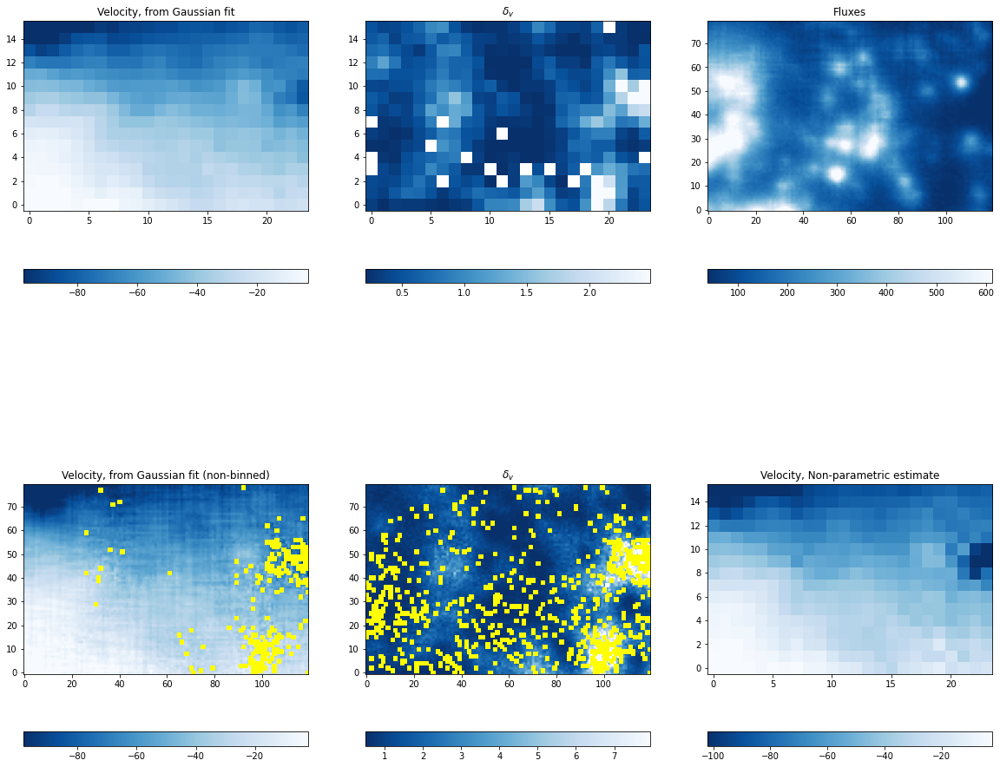

In [332]:
fig, ax = plt.subplots(2, 3, figsize=(20, 18))

data = np.transpose(map[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()

im1 = ax[0,0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))  
fig.colorbar(im1, ax=ax[0,0], orientation="horizontal")
ax[0,0].set_title("Velocity, from Gaussian fit")

###

data = np.transpose(map[1])
lo, up = np.nanpercentile(data, 6), np.nanpercentile(data, 94)
cmap = plt.cm.Blues_r.copy()

im1 = ax[0,1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))  
fig.colorbar(im1, ax=ax[0,1], orientation="horizontal")
ax[0,1].set_title("$\delta_v$")


######

data = region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)

im2 = ax[0,2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[0,2], orientation="horizontal")
ax[0,2].set_title("Fluxes")

######

data = np.transpose(NBmap[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')

im1 = ax[1,0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))  
fig.colorbar(im1, ax=ax[1,0], orientation="horizontal")
ax[1,0].set_title("Velocity, from Gaussian fit (non-binned)")


######

data = np.transpose(NBmap[1])
lo, up = np.nanpercentile(data, 6), np.nanpercentile(data, 94)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')

im2 = ax[1,1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1,1], orientation="horizontal")
ax[1,1].set_title("$\delta_v$")

######

data=np.transpose(map_vel_binned)
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')

im2 = ax[1,2].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1,2], orientation="horizontal")
ax[1,2].set_title("Velocity, Non-parametric estimate")



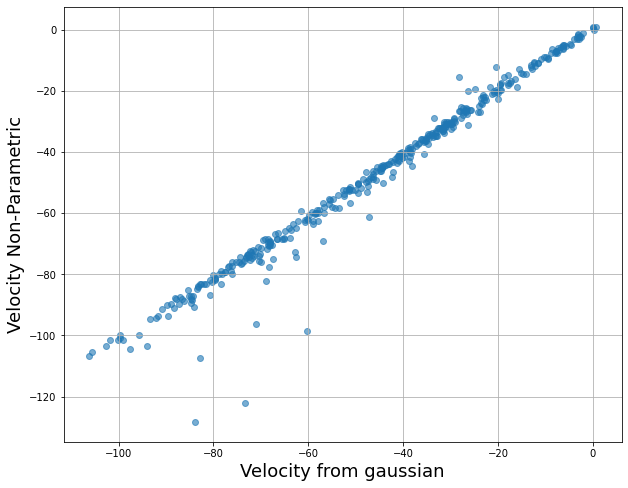

In [358]:
plt.figure(figsize=(10, 8))

values1 = np.transpose(map[0]).flatten()
values2 = np.transpose(map_vel_binned).flatten()

# Create scatter plot
plt.scatter(values1, values2, alpha=0.6)
plt.xlabel("Velocity from gaussian",fontsize=18)
plt.ylabel("Velocity Non-Parametric",fontsize=18)
plt.grid(True)
plt.show()

In [337]:
len(np.transpose(map[0])[0])

24

# Voronoi binning

goal: reach a chosen constant S/N per bin

2D

In [79]:
flux_map = region[index]
noise_values = region_err[index]
noise_values = noise_values.ravel()

voronoi_bins=voronoi(flux_map,noise_values,plots=False)

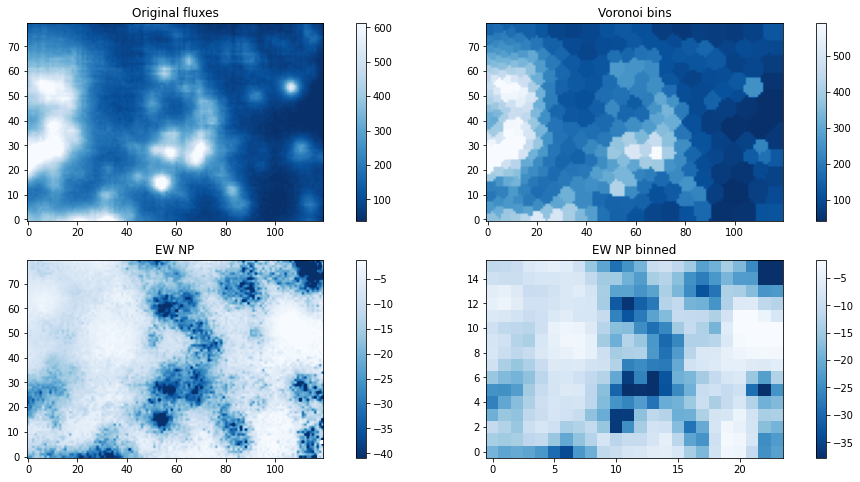

In [80]:
fig, ax = plt.subplots(2, 2, figsize=(20, 8))


####

data = flux_map
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[0,0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0,0])#, orientation="horizontal")
ax[0,0].set_title("Original fluxes")


####

data = np.transpose(voronoi_bins)
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[0,1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0,1])#, orientation="horizontal")
ax[0,1].set_title("Voronoi bins")


####

data= np.transpose(map_nonbinned_NP[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[1,0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[1,0])#, orientation="horizontal")
ax[1,0].set_title("EW NP")

####

data= np.transpose(map_NP[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[1,1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[1,1])#, orientation="horizontal")
ax[1,1].set_title("EW NP binned")

plt.subplots_adjust(wspace=-0.3, hspace=0.2)

3d: Voronoi binning each wavelength image

In [81]:
flux_map_3d=[]
data=region[index-50:index+50]
err=region_err[index-50:index+50]


for i in range(0,len(data)):
    print("binning wavelength = ",wave[index-50+i])
    flux = data[i]
    noise = err[i]
    noise = noise.ravel()

    flux_map_3d.append(voronoi(flux,noise,target_snr=40,plots=False))
    
    
flux_map_3d=np.array(flux_map_3d)

binning wavelength =  6560.9423828125
binning wavelength =  6562.1923828125
binning wavelength =  6563.4423828125
binning wavelength =  6564.6923828125
binning wavelength =  6565.9423828125
binning wavelength =  6567.1923828125
binning wavelength =  6568.4423828125
binning wavelength =  6569.6923828125
binning wavelength =  6570.9423828125
binning wavelength =  6572.1923828125
binning wavelength =  6573.4423828125
binning wavelength =  6574.6923828125
binning wavelength =  6575.9423828125
binning wavelength =  6577.1923828125
binning wavelength =  6578.4423828125
binning wavelength =  6579.6923828125
binning wavelength =  6580.9423828125
binning wavelength =  6582.1923828125
binning wavelength =  6583.4423828125
binning wavelength =  6584.6923828125
binning wavelength =  6585.9423828125
binning wavelength =  6587.1923828125
binning wavelength =  6588.4423828125
binning wavelength =  6589.6923828125
binning wavelength =  6590.9423828125
binning wavelength =  6592.1923828125
binning wave

In [121]:
wave_window=wave[index-50:index+50]

map_NP_voronoi=EW_map_non_parametric(flux_map_3d,wave_window,halpha_obs,kernel_size=3,plots=False)

Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 0 ,  0
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 0 ,  1
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 0 ,  2
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 0 ,  3
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 0 ,  4
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 0 ,  5
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 0 ,  6
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 0 ,  7
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 0 ,  8
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 0 ,  9
Integral of area over continuum divided by continuum: -5.841 +/- 0.050 at (i,j)= 0 ,  10
Integral of area over continuum

Integral of area over continuum divided by continuum: -6.421 +/- 0.087 at (i,j)= 1 ,  26
Integral of area over continuum divided by continuum: -5.999 +/- 0.085 at (i,j)= 1 ,  27
Integral of area over continuum divided by continuum: -5.999 +/- 0.085 at (i,j)= 1 ,  28
Integral of area over continuum divided by continuum: -6.049 +/- 0.085 at (i,j)= 1 ,  29
Integral of area over continuum divided by continuum: -6.049 +/- 0.085 at (i,j)= 1 ,  30
Integral of area over continuum divided by continuum: -6.048 +/- 0.085 at (i,j)= 1 ,  31
Integral of area over continuum divided by continuum: -6.931 +/- 0.082 at (i,j)= 1 ,  32
Integral of area over continuum divided by continuum: -6.931 +/- 0.082 at (i,j)= 1 ,  33
Integral of area over continuum divided by continuum: -5.414 +/- 0.081 at (i,j)= 1 ,  34
Integral of area over continuum divided by continuum: -4.194 +/- 0.085 at (i,j)= 1 ,  35
Integral of area over continuum divided by continuum: -4.343 +/- 0.058 at (i,j)= 1 ,  36
Integral of area over

Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 2 ,  5
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 2 ,  6
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 2 ,  7
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 2 ,  8
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 2 ,  9
Integral of area over continuum divided by continuum: -5.841 +/- 0.050 at (i,j)= 2 ,  10
Integral of area over continuum divided by continuum: -5.980 +/- 0.082 at (i,j)= 2 ,  11
Integral of area over continuum divided by continuum: -5.681 +/- 0.062 at (i,j)= 2 ,  12
Integral of area over continuum divided by continuum: -5.803 +/- 0.053 at (i,j)= 2 ,  13
Integral of area over continuum divided by continuum: -5.967 +/- 0.055 at (i,j)= 2 ,  14
Integral of area over continuum divided by continuum: -5.964 +/- 0.055 at (i,j)= 2 ,  15
Integral of area over cont

Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  108
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  109
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  110
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  111
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  112
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  113
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  114
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  115
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  116
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  117
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 2 ,  118
Integral o

Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 4 ,  3
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 4 ,  4
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 4 ,  5
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 4 ,  6
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 4 ,  7
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 4 ,  8
Integral of area over continuum divided by continuum: -5.113 +/- 0.050 at (i,j)= 4 ,  9
Integral of area over continuum divided by continuum: -5.332 +/- 0.049 at (i,j)= 4 ,  10
Integral of area over continuum divided by continuum: -5.980 +/- 0.082 at (i,j)= 4 ,  11
Integral of area over continuum divided by continuum: -5.681 +/- 0.062 at (i,j)= 4 ,  12
Integral of area over continuum divided by continuum: -5.803 +/- 0.053 at (i,j)= 4 ,  13
Integral of area over contin

Integral of area over continuum divided by continuum: -6.398 +/- 0.083 at (i,j)= 5 ,  24
Integral of area over continuum divided by continuum: -6.421 +/- 0.087 at (i,j)= 5 ,  25
Integral of area over continuum divided by continuum: -6.421 +/- 0.087 at (i,j)= 5 ,  26
Integral of area over continuum divided by continuum: -5.999 +/- 0.085 at (i,j)= 5 ,  27
Integral of area over continuum divided by continuum: -5.999 +/- 0.085 at (i,j)= 5 ,  28
Integral of area over continuum divided by continuum: -6.049 +/- 0.085 at (i,j)= 5 ,  29
Integral of area over continuum divided by continuum: -6.049 +/- 0.085 at (i,j)= 5 ,  30
Integral of area over continuum divided by continuum: -6.048 +/- 0.085 at (i,j)= 5 ,  31
Integral of area over continuum divided by continuum: -6.931 +/- 0.082 at (i,j)= 5 ,  32
Integral of area over continuum divided by continuum: -6.363 +/- 0.082 at (i,j)= 5 ,  33
Integral of area over continuum divided by continuum: -5.414 +/- 0.081 at (i,j)= 5 ,  34
Integral of area over

Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 5 ,  116
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 5 ,  117
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 5 ,  118
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 5 ,  119
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 6 ,  0
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 6 ,  1
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 6 ,  2
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 6 ,  3
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 6 ,  4
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 6 ,  5
Integral of area over continuum divided by continuum: -4.710 +/- 0.050 at (i,j)= 6 ,  6
Integral of area over co

Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  101
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  102
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  103
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  104
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  105
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  106
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  107
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  108
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  109
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  110
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 6 ,  111
Integral o

Integral of area over continuum divided by continuum: -1.413 +/- 0.129 at (i,j)= 7 ,  85
Integral of area over continuum divided by continuum: -1.413 +/- 0.129 at (i,j)= 7 ,  86
Integral of area over continuum divided by continuum: -1.153 +/- 0.172 at (i,j)= 7 ,  87
Integral of area over continuum divided by continuum: -1.223 +/- 0.307 at (i,j)= 7 ,  88
Integral of area over continuum divided by continuum: -5.910 +/- 0.283 at (i,j)= 7 ,  89
Integral of area over continuum divided by continuum: -6.736 +/- 0.162 at (i,j)= 7 ,  90
Integral of area over continuum divided by continuum: -6.062 +/- 0.154 at (i,j)= 7 ,  91
Integral of area over continuum divided by continuum: -5.422 +/- 0.078 at (i,j)= 7 ,  92
Integral of area over continuum divided by continuum: -5.159 +/- 0.046 at (i,j)= 7 ,  93
Integral of area over continuum divided by continuum: -5.732 +/- 0.045 at (i,j)= 7 ,  94
Integral of area over continuum divided by continuum: -5.732 +/- 0.045 at (i,j)= 7 ,  95
Integral of area over

Integral of area over continuum divided by continuum: -4.702 +/- 0.105 at (i,j)= 8 ,  63
Integral of area over continuum divided by continuum: -4.266 +/- 0.168 at (i,j)= 8 ,  64
Integral of area over continuum divided by continuum: -4.148 +/- 0.147 at (i,j)= 8 ,  65
Integral of area over continuum divided by continuum: -4.148 +/- 0.147 at (i,j)= 8 ,  66
Integral of area over continuum divided by continuum: -4.147 +/- 0.147 at (i,j)= 8 ,  67
Integral of area over continuum divided by continuum: -2.964 +/- 0.106 at (i,j)= 8 ,  68
Integral of area over continuum divided by continuum: -2.964 +/- 0.106 at (i,j)= 8 ,  69
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 8 ,  70
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 8 ,  71
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 8 ,  72
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 8 ,  73
Integral of area over

Integral of area over continuum divided by continuum: -6.009 +/- 0.069 at (i,j)= 9 ,  38
Integral of area over continuum divided by continuum: -6.009 +/- 0.069 at (i,j)= 9 ,  39
Integral of area over continuum divided by continuum: -6.009 +/- 0.069 at (i,j)= 9 ,  40
Integral of area over continuum divided by continuum: -6.009 +/- 0.069 at (i,j)= 9 ,  41
Integral of area over continuum divided by continuum: -5.792 +/- 0.090 at (i,j)= 9 ,  42
Integral of area over continuum divided by continuum: -5.340 +/- 0.172 at (i,j)= 9 ,  43
Integral of area over continuum divided by continuum: -5.401 +/- 0.128 at (i,j)= 9 ,  44
Integral of area over continuum divided by continuum: -5.316 +/- 0.094 at (i,j)= 9 ,  45
Integral of area over continuum divided by continuum: -5.369 +/- 0.095 at (i,j)= 9 ,  46
Integral of area over continuum divided by continuum: -4.354 +/- 0.086 at (i,j)= 9 ,  47
Integral of area over continuum divided by continuum: -4.105 +/- 0.071 at (i,j)= 9 ,  48
Integral of area over

Integral of area over continuum divided by continuum: -4.699 +/- 0.053 at (i,j)= 10 ,  10
Integral of area over continuum divided by continuum: -4.749 +/- 0.073 at (i,j)= 10 ,  11
Integral of area over continuum divided by continuum: -4.270 +/- 0.091 at (i,j)= 10 ,  12
Integral of area over continuum divided by continuum: -4.441 +/- 0.073 at (i,j)= 10 ,  13
Integral of area over continuum divided by continuum: -3.495 +/- 0.067 at (i,j)= 10 ,  14
Integral of area over continuum divided by continuum: -3.291 +/- 0.066 at (i,j)= 10 ,  15
Integral of area over continuum divided by continuum: -3.328 +/- 0.066 at (i,j)= 10 ,  16
Integral of area over continuum divided by continuum: -3.328 +/- 0.066 at (i,j)= 10 ,  17
Integral of area over continuum divided by continuum: -3.328 +/- 0.066 at (i,j)= 10 ,  18
Integral of area over continuum divided by continuum: -3.343 +/- 0.077 at (i,j)= 10 ,  19
Integral of area over continuum divided by continuum: -3.961 +/- 0.055 at (i,j)= 10 ,  20
Integral o

Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  108
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  109
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  110
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  111
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  112
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  113
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  114
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  115
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  116
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  117
Integral of area over continuum divided by continuum: -3.535 +/- 0.045 at (i,j)= 10 ,  118

Integral of area over continuum divided by continuum: -1.413 +/- 0.129 at (i,j)= 11 ,  84
Integral of area over continuum divided by continuum: -1.413 +/- 0.129 at (i,j)= 11 ,  85
Integral of area over continuum divided by continuum: -1.413 +/- 0.129 at (i,j)= 11 ,  86
Integral of area over continuum divided by continuum: -1.153 +/- 0.172 at (i,j)= 11 ,  87
Integral of area over continuum divided by continuum: -0.860 +/- 0.400 at (i,j)= 11 ,  88
Integral of area over continuum divided by continuum: -6.064 +/- 0.174 at (i,j)= 11 ,  89
Integral of area over continuum divided by continuum: -6.736 +/- 0.162 at (i,j)= 11 ,  90
Integral of area over continuum divided by continuum: -5.422 +/- 0.078 at (i,j)= 11 ,  91
Integral of area over continuum divided by continuum: -5.481 +/- 0.076 at (i,j)= 11 ,  92
Integral of area over continuum divided by continuum: -5.732 +/- 0.045 at (i,j)= 11 ,  93
Integral of area over continuum divided by continuum: -5.732 +/- 0.045 at (i,j)= 11 ,  94
Integral o

Integral of area over continuum divided by continuum: -5.135 +/- 0.149 at (i,j)= 12 ,  67
Integral of area over continuum divided by continuum: -4.404 +/- 0.123 at (i,j)= 12 ,  68
Integral of area over continuum divided by continuum: -2.964 +/- 0.106 at (i,j)= 12 ,  69
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 12 ,  70
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 12 ,  71
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 12 ,  72
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 12 ,  73
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 12 ,  74
Integral of area over continuum divided by continuum: -2.487 +/- 0.108 at (i,j)= 12 ,  75
Integral of area over continuum divided by continuum: -2.606 +/- 0.108 at (i,j)= 12 ,  76
Integral of area over continuum divided by continuum: -2.606 +/- 0.108 at (i,j)= 12 ,  77
Integral o

Integral of area over continuum divided by continuum: -5.053 +/- 0.072 at (i,j)= 13 ,  48
Integral of area over continuum divided by continuum: -5.053 +/- 0.072 at (i,j)= 13 ,  49
Integral of area over continuum divided by continuum: -5.016 +/- 0.072 at (i,j)= 13 ,  50
Integral of area over continuum divided by continuum: -5.714 +/- 0.070 at (i,j)= 13 ,  51
Integral of area over continuum divided by continuum: -5.651 +/- 0.057 at (i,j)= 13 ,  52
Integral of area over continuum divided by continuum: -6.880 +/- 0.058 at (i,j)= 13 ,  53
Integral of area over continuum divided by continuum: -6.880 +/- 0.058 at (i,j)= 13 ,  54
Integral of area over continuum divided by continuum: -6.880 +/- 0.058 at (i,j)= 13 ,  55
Integral of area over continuum divided by continuum: -6.880 +/- 0.058 at (i,j)= 13 ,  56
Integral of area over continuum divided by continuum: -6.880 +/- 0.058 at (i,j)= 13 ,  57
Integral of area over continuum divided by continuum: -4.223 +/- 0.064 at (i,j)= 13 ,  58
Integral o

Integral of area over continuum divided by continuum: -4.932 +/- 0.089 at (i,j)= 14 ,  35
Integral of area over continuum divided by continuum: -5.254 +/- 0.083 at (i,j)= 14 ,  36
Integral of area over continuum divided by continuum: -4.532 +/- 0.089 at (i,j)= 14 ,  37
Integral of area over continuum divided by continuum: -4.389 +/- 0.065 at (i,j)= 14 ,  38
Integral of area over continuum divided by continuum: -4.389 +/- 0.065 at (i,j)= 14 ,  39
Integral of area over continuum divided by continuum: -4.389 +/- 0.065 at (i,j)= 14 ,  40
Integral of area over continuum divided by continuum: -6.377 +/- 0.109 at (i,j)= 14 ,  41
Integral of area over continuum divided by continuum: -6.997 +/- 0.122 at (i,j)= 14 ,  42
Integral of area over continuum divided by continuum: -5.793 +/- 0.172 at (i,j)= 14 ,  43
Integral of area over continuum divided by continuum: -5.644 +/- 0.145 at (i,j)= 14 ,  44
Integral of area over continuum divided by continuum: -5.724 +/- 0.094 at (i,j)= 14 ,  45
Integral o

Integral of area over continuum divided by continuum: -3.114 +/- 0.103 at (i,j)= 15 ,  33
Integral of area over continuum divided by continuum: -2.881 +/- 0.103 at (i,j)= 15 ,  34
Integral of area over continuum divided by continuum: -2.881 +/- 0.103 at (i,j)= 15 ,  35
Integral of area over continuum divided by continuum: -2.881 +/- 0.103 at (i,j)= 15 ,  36
Integral of area over continuum divided by continuum: -2.825 +/- 0.102 at (i,j)= 15 ,  37
Integral of area over continuum divided by continuum: -3.316 +/- 0.086 at (i,j)= 15 ,  38
Integral of area over continuum divided by continuum: -4.418 +/- 0.100 at (i,j)= 15 ,  39
Integral of area over continuum divided by continuum: -4.513 +/- 0.099 at (i,j)= 15 ,  40
Integral of area over continuum divided by continuum: -4.578 +/- 0.100 at (i,j)= 15 ,  41
Integral of area over continuum divided by continuum: -6.801 +/- 0.182 at (i,j)= 15 ,  42
Integral of area over continuum divided by continuum: -7.369 +/- 0.197 at (i,j)= 15 ,  43
Integral o

Integral of area over continuum divided by continuum: -3.495 +/- 0.056 at (i,j)= 16 ,  15
Integral of area over continuum divided by continuum: -3.569 +/- 0.056 at (i,j)= 16 ,  16
Integral of area over continuum divided by continuum: -3.602 +/- 0.059 at (i,j)= 16 ,  17
Integral of area over continuum divided by continuum: -3.602 +/- 0.059 at (i,j)= 16 ,  18
Integral of area over continuum divided by continuum: -3.602 +/- 0.059 at (i,j)= 16 ,  19
Integral of area over continuum divided by continuum: -3.560 +/- 0.058 at (i,j)= 16 ,  20
Integral of area over continuum divided by continuum: -3.561 +/- 0.058 at (i,j)= 16 ,  21
Integral of area over continuum divided by continuum: -3.374 +/- 0.058 at (i,j)= 16 ,  22
Integral of area over continuum divided by continuum: -3.458 +/- 0.061 at (i,j)= 16 ,  23
Integral of area over continuum divided by continuum: -3.501 +/- 0.061 at (i,j)= 16 ,  24
Integral of area over continuum divided by continuum: -3.145 +/- 0.083 at (i,j)= 16 ,  25
Integral o

Integral of area over continuum divided by continuum: -4.031 +/- 0.133 at (i,j)= 17 ,  4
Integral of area over continuum divided by continuum: -4.031 +/- 0.133 at (i,j)= 17 ,  5
Integral of area over continuum divided by continuum: -3.656 +/- 0.109 at (i,j)= 17 ,  6
Integral of area over continuum divided by continuum: -4.099 +/- 0.109 at (i,j)= 17 ,  7
Integral of area over continuum divided by continuum: -4.099 +/- 0.109 at (i,j)= 17 ,  8
Integral of area over continuum divided by continuum: -4.101 +/- 0.041 at (i,j)= 17 ,  9
Integral of area over continuum divided by continuum: -4.603 +/- 0.032 at (i,j)= 17 ,  10
Integral of area over continuum divided by continuum: -4.654 +/- 0.034 at (i,j)= 17 ,  11
Integral of area over continuum divided by continuum: -4.639 +/- 0.074 at (i,j)= 17 ,  12
Integral of area over continuum divided by continuum: -4.712 +/- 0.056 at (i,j)= 17 ,  13
Integral of area over continuum divided by continuum: -4.396 +/- 0.056 at (i,j)= 17 ,  14
Integral of area

Integral of area over continuum divided by continuum: -3.531 +/- 0.061 at (i,j)= 18 ,  23
Integral of area over continuum divided by continuum: -3.500 +/- 0.061 at (i,j)= 18 ,  24
Integral of area over continuum divided by continuum: -3.456 +/- 0.061 at (i,j)= 18 ,  25
Integral of area over continuum divided by continuum: -3.456 +/- 0.061 at (i,j)= 18 ,  26
Integral of area over continuum divided by continuum: -3.456 +/- 0.061 at (i,j)= 18 ,  27
Integral of area over continuum divided by continuum: -3.579 +/- 0.082 at (i,j)= 18 ,  28
Integral of area over continuum divided by continuum: -3.473 +/- 0.072 at (i,j)= 18 ,  29
Integral of area over continuum divided by continuum: -3.473 +/- 0.072 at (i,j)= 18 ,  30
Integral of area over continuum divided by continuum: -3.400 +/- 0.075 at (i,j)= 18 ,  31
Integral of area over continuum divided by continuum: -3.395 +/- 0.072 at (i,j)= 18 ,  32
Integral of area over continuum divided by continuum: -2.852 +/- 0.074 at (i,j)= 18 ,  33
Integral o

Integral of area over continuum divided by continuum: -4.717 +/- 0.032 at (i,j)= 19 ,  11
Integral of area over continuum divided by continuum: -4.639 +/- 0.074 at (i,j)= 19 ,  12
Integral of area over continuum divided by continuum: -4.712 +/- 0.056 at (i,j)= 19 ,  13
Integral of area over continuum divided by continuum: -4.485 +/- 0.056 at (i,j)= 19 ,  14
Integral of area over continuum divided by continuum: -4.570 +/- 0.056 at (i,j)= 19 ,  15
Integral of area over continuum divided by continuum: -4.570 +/- 0.059 at (i,j)= 19 ,  16
Integral of area over continuum divided by continuum: -4.200 +/- 0.058 at (i,j)= 19 ,  17
Integral of area over continuum divided by continuum: -4.200 +/- 0.058 at (i,j)= 19 ,  18
Integral of area over continuum divided by continuum: -4.153 +/- 0.058 at (i,j)= 19 ,  19
Integral of area over continuum divided by continuum: -3.533 +/- 0.058 at (i,j)= 19 ,  20
Integral of area over continuum divided by continuum: -3.533 +/- 0.061 at (i,j)= 19 ,  21
Integral o

Integral of area over continuum divided by continuum: -5.802 +/- 0.181 at (i,j)= 20 ,  1
Integral of area over continuum divided by continuum: -5.802 +/- 0.181 at (i,j)= 20 ,  2
Integral of area over continuum divided by continuum: -5.802 +/- 0.181 at (i,j)= 20 ,  3
Integral of area over continuum divided by continuum: -5.802 +/- 0.181 at (i,j)= 20 ,  4
Integral of area over continuum divided by continuum: -5.802 +/- 0.181 at (i,j)= 20 ,  5
Integral of area over continuum divided by continuum: -5.901 +/- 0.141 at (i,j)= 20 ,  6
Integral of area over continuum divided by continuum: -6.406 +/- 0.145 at (i,j)= 20 ,  7
Integral of area over continuum divided by continuum: -2.720 +/- 0.111 at (i,j)= 20 ,  8
Integral of area over continuum divided by continuum: -3.721 +/- 0.046 at (i,j)= 20 ,  9
Integral of area over continuum divided by continuum: -3.976 +/- 0.040 at (i,j)= 20 ,  10
Integral of area over continuum divided by continuum: -3.594 +/- 0.048 at (i,j)= 20 ,  11
Integral of area ov

Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 20 ,  97
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 20 ,  98
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 20 ,  99
Integral of area over continuum divided by continuum: -4.639 +/- 0.045 at (i,j)= 20 ,  100
Integral of area over continuum divided by continuum: -4.639 +/- 0.045 at (i,j)= 20 ,  101
Integral of area over continuum divided by continuum: -4.639 +/- 0.045 at (i,j)= 20 ,  102
Integral of area over continuum divided by continuum: -4.639 +/- 0.045 at (i,j)= 20 ,  103
Integral of area over continuum divided by continuum: -4.639 +/- 0.045 at (i,j)= 20 ,  104
Integral of area over continuum divided by continuum: -4.226 +/- 0.045 at (i,j)= 20 ,  105
Integral of area over continuum divided by continuum: -4.226 +/- 0.045 at (i,j)= 20 ,  106
Integral of area over continuum divided by continuum: -4.709 +/- 0.045 at (i,j)= 20 ,  107
In

Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 21 ,  114
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 21 ,  115
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 21 ,  116
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 21 ,  117
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 21 ,  118
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 21 ,  119
Integral of area over continuum divided by continuum: -4.563 +/- 0.253 at (i,j)= 22 ,  0
Integral of area over continuum divided by continuum: -4.563 +/- 0.253 at (i,j)= 22 ,  1
Integral of area over continuum divided by continuum: -4.563 +/- 0.253 at (i,j)= 22 ,  2
Integral of area over continuum divided by continuum: -4.563 +/- 0.253 at (i,j)= 22 ,  3
Integral of area over continuum divided by continuum: -4.707 +/- 0.181 at (i,j)= 22 ,  4
Integral 

Integral of area over continuum divided by continuum: -4.639 +/- 0.045 at (i,j)= 22 ,  103
Integral of area over continuum divided by continuum: -4.639 +/- 0.045 at (i,j)= 22 ,  104
Integral of area over continuum divided by continuum: -4.364 +/- 0.045 at (i,j)= 22 ,  105
Integral of area over continuum divided by continuum: -4.364 +/- 0.045 at (i,j)= 22 ,  106
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 22 ,  107
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 22 ,  108
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 22 ,  109
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 22 ,  110
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 22 ,  111
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 22 ,  112
Integral of area over continuum divided by continuum: -4.847 +/- 0.045 at (i,j)= 22 ,  113

Integral of area over continuum divided by continuum: -5.089 +/- 0.052 at (i,j)= 23 ,  94
Integral of area over continuum divided by continuum: -6.165 +/- 0.045 at (i,j)= 23 ,  95
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 23 ,  96
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 23 ,  97
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 23 ,  98
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 23 ,  99
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 23 ,  100
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 23 ,  101
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 23 ,  102
Integral of area over continuum divided by continuum: -5.503 +/- 0.045 at (i,j)= 23 ,  103
Integral of area over continuum divided by continuum: -4.639 +/- 0.045 at (i,j)= 23 ,  104
Integ

Integral of area over continuum divided by continuum: -7.648 +/- 0.252 at (i,j)= 24 ,  75
Integral of area over continuum divided by continuum: -8.419 +/- 0.202 at (i,j)= 24 ,  76
Integral of area over continuum divided by continuum: -8.368 +/- 0.195 at (i,j)= 24 ,  77
Integral of area over continuum divided by continuum: -6.692 +/- 0.175 at (i,j)= 24 ,  78
Integral of area over continuum divided by continuum: -6.693 +/- 0.175 at (i,j)= 24 ,  79
Integral of area over continuum divided by continuum: -6.348 +/- 0.172 at (i,j)= 24 ,  80
Integral of area over continuum divided by continuum: -6.328 +/- 0.172 at (i,j)= 24 ,  81
Integral of area over continuum divided by continuum: -6.328 +/- 0.172 at (i,j)= 24 ,  82
Integral of area over continuum divided by continuum: -6.529 +/- 0.173 at (i,j)= 24 ,  83
Integral of area over continuum divided by continuum: -6.305 +/- 0.163 at (i,j)= 24 ,  84
Integral of area over continuum divided by continuum: -4.924 +/- 0.159 at (i,j)= 24 ,  85
Integral o

Integral of area over continuum divided by continuum: -9.474 +/- 0.146 at (i,j)= 25 ,  54
Integral of area over continuum divided by continuum: -9.341 +/- 0.123 at (i,j)= 25 ,  55
Integral of area over continuum divided by continuum: -9.322 +/- 0.123 at (i,j)= 25 ,  56
Integral of area over continuum divided by continuum: -9.322 +/- 0.123 at (i,j)= 25 ,  57
Integral of area over continuum divided by continuum: -9.322 +/- 0.123 at (i,j)= 25 ,  58
Integral of area over continuum divided by continuum: -8.975 +/- 0.134 at (i,j)= 25 ,  59
Integral of area over continuum divided by continuum: -9.873 +/- 0.122 at (i,j)= 25 ,  60
Integral of area over continuum divided by continuum: -9.874 +/- 0.122 at (i,j)= 25 ,  61
Integral of area over continuum divided by continuum: -9.874 +/- 0.122 at (i,j)= 25 ,  62
Integral of area over continuum divided by continuum: -9.874 +/- 0.122 at (i,j)= 25 ,  63
Integral of area over continuum divided by continuum: -9.874 +/- 0.122 at (i,j)= 25 ,  64
Integral o

Integral of area over continuum divided by continuum: -2.842 +/- 0.165 at (i,j)= 26 ,  28
Integral of area over continuum divided by continuum: -2.755 +/- 0.154 at (i,j)= 26 ,  29
Integral of area over continuum divided by continuum: -2.849 +/- 0.086 at (i,j)= 26 ,  30
Integral of area over continuum divided by continuum: -3.101 +/- 0.086 at (i,j)= 26 ,  31
Integral of area over continuum divided by continuum: -2.950 +/- 0.066 at (i,j)= 26 ,  32
Integral of area over continuum divided by continuum: -2.951 +/- 0.066 at (i,j)= 26 ,  33
Integral of area over continuum divided by continuum: -2.951 +/- 0.066 at (i,j)= 26 ,  34
Integral of area over continuum divided by continuum: -2.973 +/- 0.063 at (i,j)= 26 ,  35
Integral of area over continuum divided by continuum: -2.974 +/- 0.063 at (i,j)= 26 ,  36
Integral of area over continuum divided by continuum: -2.974 +/- 0.063 at (i,j)= 26 ,  37
Integral of area over continuum divided by continuum: -3.321 +/- 0.064 at (i,j)= 26 ,  38
Integral o

Integral of area over continuum divided by continuum: -5.337 +/- 0.094 at (i,j)= 27 ,  9
Integral of area over continuum divided by continuum: -5.755 +/- 0.143 at (i,j)= 27 ,  10
Integral of area over continuum divided by continuum: -5.679 +/- 0.141 at (i,j)= 27 ,  11
Integral of area over continuum divided by continuum: -5.855 +/- 0.142 at (i,j)= 27 ,  12
Integral of area over continuum divided by continuum: -5.855 +/- 0.142 at (i,j)= 27 ,  13
Integral of area over continuum divided by continuum: -4.318 +/- 0.139 at (i,j)= 27 ,  14
Integral of area over continuum divided by continuum: -4.318 +/- 0.139 at (i,j)= 27 ,  15
Integral of area over continuum divided by continuum: -3.849 +/- 0.139 at (i,j)= 27 ,  16
Integral of area over continuum divided by continuum: -3.657 +/- 0.141 at (i,j)= 27 ,  17
Integral of area over continuum divided by continuum: -2.852 +/- 0.122 at (i,j)= 27 ,  18
Integral of area over continuum divided by continuum: -3.186 +/- 0.124 at (i,j)= 27 ,  19
Integral of

Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 27 ,  118
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 27 ,  119
Integral of area over continuum divided by continuum: -5.988 +/- 0.101 at (i,j)= 28 ,  0
Integral of area over continuum divided by continuum: -5.988 +/- 0.101 at (i,j)= 28 ,  1
Integral of area over continuum divided by continuum: -5.988 +/- 0.101 at (i,j)= 28 ,  2
Integral of area over continuum divided by continuum: -5.365 +/- 0.128 at (i,j)= 28 ,  3
Integral of area over continuum divided by continuum: -5.365 +/- 0.128 at (i,j)= 28 ,  4
Integral of area over continuum divided by continuum: -4.714 +/- 0.078 at (i,j)= 28 ,  5
Integral of area over continuum divided by continuum: -4.283 +/- 0.081 at (i,j)= 28 ,  6
Integral of area over continuum divided by continuum: -4.949 +/- 0.134 at (i,j)= 28 ,  7
Integral of area over continuum divided by continuum: -6.113 +/- 0.084 at (i,j)= 28 ,  8
Integral of area 

Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  111
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  112
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  113
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  114
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  115
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  116
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  117
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  118
Integral of area over continuum divided by continuum: -4.650 +/- 0.048 at (i,j)= 28 ,  119
Integral of area over continuum divided by continuum: -4.843 +/- 0.124 at (i,j)= 29 ,  0
Integral of area over continuum divided by continuum: -4.843 +/- 0.124 at (i,j)= 29 ,  1
Int

Integral of area over continuum divided by continuum: -4.742 +/- 0.116 at (i,j)= 29 ,  83
Integral of area over continuum divided by continuum: -2.876 +/- 0.115 at (i,j)= 29 ,  84
Integral of area over continuum divided by continuum: -3.141 +/- 0.121 at (i,j)= 29 ,  85
Integral of area over continuum divided by continuum: -2.398 +/- 0.131 at (i,j)= 29 ,  86
Integral of area over continuum divided by continuum: -2.398 +/- 0.131 at (i,j)= 29 ,  87
Integral of area over continuum divided by continuum: -2.267 +/- 0.116 at (i,j)= 29 ,  88
Integral of area over continuum divided by continuum: -2.300 +/- 0.147 at (i,j)= 29 ,  89
Integral of area over continuum divided by continuum: -2.437 +/- 0.164 at (i,j)= 29 ,  90
Integral of area over continuum divided by continuum: -2.094 +/- 0.170 at (i,j)= 29 ,  91
Integral of area over continuum divided by continuum: -2.094 +/- 0.170 at (i,j)= 29 ,  92
Integral of area over continuum divided by continuum: -0.661 +/- 0.166 at (i,j)= 29 ,  93
Integral o

Integral of area over continuum divided by continuum: -11.163 +/- 0.078 at (i,j)= 30 ,  65
Integral of area over continuum divided by continuum: -11.163 +/- 0.078 at (i,j)= 30 ,  66
Integral of area over continuum divided by continuum: -11.496 +/- 0.078 at (i,j)= 30 ,  67
Integral of area over continuum divided by continuum: -11.496 +/- 0.078 at (i,j)= 30 ,  68
Integral of area over continuum divided by continuum: -10.661 +/- 0.132 at (i,j)= 30 ,  69
Integral of area over continuum divided by continuum: -9.370 +/- 0.140 at (i,j)= 30 ,  70
Integral of area over continuum divided by continuum: -13.470 +/- 0.226 at (i,j)= 30 ,  71
Integral of area over continuum divided by continuum: -13.473 +/- 0.226 at (i,j)= 30 ,  72
Integral of area over continuum divided by continuum: -13.546 +/- 0.234 at (i,j)= 30 ,  73
Integral of area over continuum divided by continuum: -13.923 +/- 0.253 at (i,j)= 30 ,  74
Integral of area over continuum divided by continuum: -13.923 +/- 0.253 at (i,j)= 30 ,  75


Integral of area over continuum divided by continuum: -4.026 +/- 0.187 at (i,j)= 31 ,  49
Integral of area over continuum divided by continuum: -3.956 +/- 0.203 at (i,j)= 31 ,  50
Integral of area over continuum divided by continuum: -4.669 +/- 0.205 at (i,j)= 31 ,  51
Integral of area over continuum divided by continuum: -5.495 +/- 0.209 at (i,j)= 31 ,  52
Integral of area over continuum divided by continuum: -7.106 +/- 0.203 at (i,j)= 31 ,  53
Integral of area over continuum divided by continuum: -7.976 +/- 0.196 at (i,j)= 31 ,  54
Integral of area over continuum divided by continuum: -7.962 +/- 0.195 at (i,j)= 31 ,  55
Integral of area over continuum divided by continuum: -9.495 +/- 0.161 at (i,j)= 31 ,  56
Integral of area over continuum divided by continuum: -9.436 +/- 0.088 at (i,j)= 31 ,  57
Integral of area over continuum divided by continuum: -9.436 +/- 0.088 at (i,j)= 31 ,  58
Integral of area over continuum divided by continuum: -9.394 +/- 0.089 at (i,j)= 31 ,  59
Integral o

Integral of area over continuum divided by continuum: -3.756 +/- 0.081 at (i,j)= 32 ,  38
Integral of area over continuum divided by continuum: -3.752 +/- 0.081 at (i,j)= 32 ,  39
Integral of area over continuum divided by continuum: -4.237 +/- 0.081 at (i,j)= 32 ,  40
Integral of area over continuum divided by continuum: -4.426 +/- 0.081 at (i,j)= 32 ,  41
Integral of area over continuum divided by continuum: -4.126 +/- 0.083 at (i,j)= 32 ,  42
Integral of area over continuum divided by continuum: -3.518 +/- 0.095 at (i,j)= 32 ,  43
Integral of area over continuum divided by continuum: -3.512 +/- 0.094 at (i,j)= 32 ,  44
Integral of area over continuum divided by continuum: -3.507 +/- 0.137 at (i,j)= 32 ,  45
Integral of area over continuum divided by continuum: -3.383 +/- 0.151 at (i,j)= 32 ,  46
Integral of area over continuum divided by continuum: -3.187 +/- 0.159 at (i,j)= 32 ,  47
Integral of area over continuum divided by continuum: -4.106 +/- 0.162 at (i,j)= 32 ,  48
Integral o

Integral of area over continuum divided by continuum: -2.196 +/- 0.102 at (i,j)= 33 ,  30
Integral of area over continuum divided by continuum: -1.991 +/- 0.067 at (i,j)= 33 ,  31
Integral of area over continuum divided by continuum: -1.907 +/- 0.077 at (i,j)= 33 ,  32
Integral of area over continuum divided by continuum: -1.923 +/- 0.086 at (i,j)= 33 ,  33
Integral of area over continuum divided by continuum: -1.857 +/- 0.109 at (i,j)= 33 ,  34
Integral of area over continuum divided by continuum: -1.945 +/- 0.105 at (i,j)= 33 ,  35
Integral of area over continuum divided by continuum: -1.712 +/- 0.136 at (i,j)= 33 ,  36
Integral of area over continuum divided by continuum: -1.736 +/- 0.186 at (i,j)= 33 ,  37
Integral of area over continuum divided by continuum: -3.106 +/- 0.134 at (i,j)= 33 ,  38
Integral of area over continuum divided by continuum: -3.639 +/- 0.080 at (i,j)= 33 ,  39
Integral of area over continuum divided by continuum: -3.822 +/- 0.080 at (i,j)= 33 ,  40
Integral o

Integral of area over continuum divided by continuum: -4.484 +/- 0.137 at (i,j)= 34 ,  8
Integral of area over continuum divided by continuum: -4.615 +/- 0.160 at (i,j)= 34 ,  9
Integral of area over continuum divided by continuum: -4.615 +/- 0.160 at (i,j)= 34 ,  10
Integral of area over continuum divided by continuum: -4.140 +/- 0.176 at (i,j)= 34 ,  11
Integral of area over continuum divided by continuum: -4.034 +/- 0.146 at (i,j)= 34 ,  12
Integral of area over continuum divided by continuum: -4.497 +/- 0.168 at (i,j)= 34 ,  13
Integral of area over continuum divided by continuum: -4.318 +/- 0.158 at (i,j)= 34 ,  14
Integral of area over continuum divided by continuum: -4.226 +/- 0.138 at (i,j)= 34 ,  15
Integral of area over continuum divided by continuum: -4.181 +/- 0.124 at (i,j)= 34 ,  16
Integral of area over continuum divided by continuum: -5.905 +/- 0.155 at (i,j)= 34 ,  17
Integral of area over continuum divided by continuum: -2.616 +/- 0.135 at (i,j)= 34 ,  18
Integral of 

Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 34 ,  115
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 34 ,  116
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 34 ,  117
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 34 ,  118
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 34 ,  119
Integral of area over continuum divided by continuum: -5.577 +/- 0.153 at (i,j)= 35 ,  0
Integral of area over continuum divided by continuum: -5.577 +/- 0.153 at (i,j)= 35 ,  1
Integral of area over continuum divided by continuum: -5.578 +/- 0.153 at (i,j)= 35 ,  2
Integral of area over continuum divided by continuum: -5.578 +/- 0.153 at (i,j)= 35 ,  3
Integral of area over continuum divided by continuum: -4.416 +/- 0.146 at (i,j)= 35 ,  4
Integral of area over continuum divided by continuum: -4.582 +/- 0.136 at (i,j)= 35 ,  5
Integral of

Integral of area over continuum divided by continuum: -3.281 +/- 0.170 at (i,j)= 35 ,  103
Integral of area over continuum divided by continuum: -3.281 +/- 0.170 at (i,j)= 35 ,  104
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  105
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  106
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  107
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  108
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  109
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  110
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  111
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  112
Integral of area over continuum divided by continuum: -1.591 +/- 0.161 at (i,j)= 35 ,  113

Integral of area over continuum divided by continuum: -2.133 +/- 0.099 at (i,j)= 36 ,  92
Integral of area over continuum divided by continuum: -2.220 +/- 0.100 at (i,j)= 36 ,  93
Integral of area over continuum divided by continuum: -2.499 +/- 0.137 at (i,j)= 36 ,  94
Integral of area over continuum divided by continuum: -2.502 +/- 0.126 at (i,j)= 36 ,  95
Integral of area over continuum divided by continuum: -2.683 +/- 0.118 at (i,j)= 36 ,  96
Integral of area over continuum divided by continuum: -2.683 +/- 0.118 at (i,j)= 36 ,  97
Integral of area over continuum divided by continuum: -2.683 +/- 0.118 at (i,j)= 36 ,  98
Integral of area over continuum divided by continuum: -2.653 +/- 0.090 at (i,j)= 36 ,  99
Integral of area over continuum divided by continuum: -1.717 +/- 0.125 at (i,j)= 36 ,  100
Integral of area over continuum divided by continuum: -1.452 +/- 0.123 at (i,j)= 36 ,  101
Integral of area over continuum divided by continuum: -3.144 +/- 0.132 at (i,j)= 36 ,  102
Integra

Integral of area over continuum divided by continuum: -2.104 +/- 0.099 at (i,j)= 37 ,  92
Integral of area over continuum divided by continuum: -2.133 +/- 0.099 at (i,j)= 37 ,  93
Integral of area over continuum divided by continuum: -2.447 +/- 0.138 at (i,j)= 37 ,  94
Integral of area over continuum divided by continuum: -2.443 +/- 0.125 at (i,j)= 37 ,  95
Integral of area over continuum divided by continuum: -2.683 +/- 0.118 at (i,j)= 37 ,  96
Integral of area over continuum divided by continuum: -2.683 +/- 0.118 at (i,j)= 37 ,  97
Integral of area over continuum divided by continuum: -2.710 +/- 0.089 at (i,j)= 37 ,  98
Integral of area over continuum divided by continuum: -2.638 +/- 0.090 at (i,j)= 37 ,  99
Integral of area over continuum divided by continuum: -1.717 +/- 0.125 at (i,j)= 37 ,  100
Integral of area over continuum divided by continuum: -1.598 +/- 0.123 at (i,j)= 37 ,  101
Integral of area over continuum divided by continuum: -1.598 +/- 0.123 at (i,j)= 37 ,  102
Integra

Integral of area over continuum divided by continuum: -10.274 +/- 0.192 at (i,j)= 38 ,  79
Integral of area over continuum divided by continuum: -8.588 +/- 0.157 at (i,j)= 38 ,  80
Integral of area over continuum divided by continuum: -4.513 +/- 0.146 at (i,j)= 38 ,  81
Integral of area over continuum divided by continuum: -4.513 +/- 0.146 at (i,j)= 38 ,  82
Integral of area over continuum divided by continuum: -4.349 +/- 0.149 at (i,j)= 38 ,  83
Integral of area over continuum divided by continuum: -4.349 +/- 0.149 at (i,j)= 38 ,  84
Integral of area over continuum divided by continuum: -3.416 +/- 0.131 at (i,j)= 38 ,  85
Integral of area over continuum divided by continuum: -3.416 +/- 0.131 at (i,j)= 38 ,  86
Integral of area over continuum divided by continuum: -3.616 +/- 0.133 at (i,j)= 38 ,  87
Integral of area over continuum divided by continuum: -3.616 +/- 0.133 at (i,j)= 38 ,  88
Integral of area over continuum divided by continuum: -2.278 +/- 0.100 at (i,j)= 38 ,  89
Integral 

Integral of area over continuum divided by continuum: -11.117 +/- 0.264 at (i,j)= 39 ,  76
Integral of area over continuum divided by continuum: -11.101 +/- 0.303 at (i,j)= 39 ,  77
Integral of area over continuum divided by continuum: -11.514 +/- 0.244 at (i,j)= 39 ,  78
Integral of area over continuum divided by continuum: -7.909 +/- 0.190 at (i,j)= 39 ,  79
Integral of area over continuum divided by continuum: -7.909 +/- 0.190 at (i,j)= 39 ,  80
Integral of area over continuum divided by continuum: -6.336 +/- 0.154 at (i,j)= 39 ,  81
Integral of area over continuum divided by continuum: -4.586 +/- 0.146 at (i,j)= 39 ,  82
Integral of area over continuum divided by continuum: -4.347 +/- 0.148 at (i,j)= 39 ,  83
Integral of area over continuum divided by continuum: -4.347 +/- 0.148 at (i,j)= 39 ,  84
Integral of area over continuum divided by continuum: -4.347 +/- 0.148 at (i,j)= 39 ,  85
Integral of area over continuum divided by continuum: -3.616 +/- 0.133 at (i,j)= 39 ,  86
Integra

Integral of area over continuum divided by continuum: -7.529 +/- 0.061 at (i,j)= 40 ,  66
Integral of area over continuum divided by continuum: -6.745 +/- 0.147 at (i,j)= 40 ,  67
Integral of area over continuum divided by continuum: -6.746 +/- 0.147 at (i,j)= 40 ,  68
Integral of area over continuum divided by continuum: -6.889 +/- 0.147 at (i,j)= 40 ,  69
Integral of area over continuum divided by continuum: -5.686 +/- 0.173 at (i,j)= 40 ,  70
Integral of area over continuum divided by continuum: -5.914 +/- 0.194 at (i,j)= 40 ,  71
Integral of area over continuum divided by continuum: -5.914 +/- 0.194 at (i,j)= 40 ,  72
Integral of area over continuum divided by continuum: -10.146 +/- 0.217 at (i,j)= 40 ,  73
Integral of area over continuum divided by continuum: -11.117 +/- 0.264 at (i,j)= 40 ,  74
Integral of area over continuum divided by continuum: -11.117 +/- 0.264 at (i,j)= 40 ,  75
Integral of area over continuum divided by continuum: -8.889 +/- 0.245 at (i,j)= 40 ,  76
Integra

Integral of area over continuum divided by continuum: -4.889 +/- 0.139 at (i,j)= 41 ,  56
Integral of area over continuum divided by continuum: -5.282 +/- 0.141 at (i,j)= 41 ,  57
Integral of area over continuum divided by continuum: -6.389 +/- 0.148 at (i,j)= 41 ,  58
Integral of area over continuum divided by continuum: -7.029 +/- 0.146 at (i,j)= 41 ,  59
Integral of area over continuum divided by continuum: -7.756 +/- 0.086 at (i,j)= 41 ,  60
Integral of area over continuum divided by continuum: -7.337 +/- 0.069 at (i,j)= 41 ,  61
Integral of area over continuum divided by continuum: -7.337 +/- 0.069 at (i,j)= 41 ,  62
Integral of area over continuum divided by continuum: -7.338 +/- 0.069 at (i,j)= 41 ,  63
Integral of area over continuum divided by continuum: -7.384 +/- 0.069 at (i,j)= 41 ,  64
Integral of area over continuum divided by continuum: -7.321 +/- 0.072 at (i,j)= 41 ,  65
Integral of area over continuum divided by continuum: -7.354 +/- 0.072 at (i,j)= 41 ,  66
Integral o

Integral of area over continuum divided by continuum: -2.651 +/- 0.100 at (i,j)= 42 ,  48
Integral of area over continuum divided by continuum: -2.575 +/- 0.180 at (i,j)= 42 ,  49
Integral of area over continuum divided by continuum: -3.082 +/- 0.114 at (i,j)= 42 ,  50
Integral of area over continuum divided by continuum: -3.082 +/- 0.114 at (i,j)= 42 ,  51
Integral of area over continuum divided by continuum: -3.674 +/- 0.209 at (i,j)= 42 ,  52
Integral of area over continuum divided by continuum: -3.674 +/- 0.209 at (i,j)= 42 ,  53
Integral of area over continuum divided by continuum: -3.723 +/- 0.209 at (i,j)= 42 ,  54
Integral of area over continuum divided by continuum: -3.780 +/- 0.140 at (i,j)= 42 ,  55
Integral of area over continuum divided by continuum: -3.815 +/- 0.135 at (i,j)= 42 ,  56
Integral of area over continuum divided by continuum: -4.280 +/- 0.134 at (i,j)= 42 ,  57
Integral of area over continuum divided by continuum: -4.531 +/- 0.135 at (i,j)= 42 ,  58
Integral o

Integral of area over continuum divided by continuum: -1.749 +/- 0.083 at (i,j)= 43 ,  32
Integral of area over continuum divided by continuum: -2.054 +/- 0.082 at (i,j)= 43 ,  33
Integral of area over continuum divided by continuum: -2.054 +/- 0.082 at (i,j)= 43 ,  34
Integral of area over continuum divided by continuum: -1.989 +/- 0.073 at (i,j)= 43 ,  35
Integral of area over continuum divided by continuum: -2.088 +/- 0.085 at (i,j)= 43 ,  36
Integral of area over continuum divided by continuum: -2.410 +/- 0.085 at (i,j)= 43 ,  37
Integral of area over continuum divided by continuum: -2.410 +/- 0.085 at (i,j)= 43 ,  38
Integral of area over continuum divided by continuum: -2.148 +/- 0.085 at (i,j)= 43 ,  39
Integral of area over continuum divided by continuum: -1.945 +/- 0.085 at (i,j)= 43 ,  40
Integral of area over continuum divided by continuum: -1.769 +/- 0.187 at (i,j)= 43 ,  41
Integral of area over continuum divided by continuum: -1.813 +/- 0.188 at (i,j)= 43 ,  42
Integral o

Integral of area over continuum divided by continuum: -3.163 +/- 0.121 at (i,j)= 44 ,  28
Integral of area over continuum divided by continuum: -2.147 +/- 0.092 at (i,j)= 44 ,  29
Integral of area over continuum divided by continuum: -1.790 +/- 0.083 at (i,j)= 44 ,  30
Integral of area over continuum divided by continuum: -1.790 +/- 0.083 at (i,j)= 44 ,  31
Integral of area over continuum divided by continuum: -2.031 +/- 0.083 at (i,j)= 44 ,  32
Integral of area over continuum divided by continuum: -2.213 +/- 0.099 at (i,j)= 44 ,  33
Integral of area over continuum divided by continuum: -2.213 +/- 0.099 at (i,j)= 44 ,  34
Integral of area over continuum divided by continuum: -2.165 +/- 0.072 at (i,j)= 44 ,  35
Integral of area over continuum divided by continuum: -2.296 +/- 0.084 at (i,j)= 44 ,  36
Integral of area over continuum divided by continuum: -2.354 +/- 0.084 at (i,j)= 44 ,  37
Integral of area over continuum divided by continuum: -2.336 +/- 0.084 at (i,j)= 44 ,  38
Integral o

Integral of area over continuum divided by continuum: -2.019 +/- 0.142 at (i,j)= 45 ,  4
Integral of area over continuum divided by continuum: -2.634 +/- 0.146 at (i,j)= 45 ,  5
Integral of area over continuum divided by continuum: -2.778 +/- 0.129 at (i,j)= 45 ,  6
Integral of area over continuum divided by continuum: -3.213 +/- 0.077 at (i,j)= 45 ,  7
Integral of area over continuum divided by continuum: -3.526 +/- 0.077 at (i,j)= 45 ,  8
Integral of area over continuum divided by continuum: -3.526 +/- 0.077 at (i,j)= 45 ,  9
Integral of area over continuum divided by continuum: -2.970 +/- 0.077 at (i,j)= 45 ,  10
Integral of area over continuum divided by continuum: -3.091 +/- 0.077 at (i,j)= 45 ,  11
Integral of area over continuum divided by continuum: -3.091 +/- 0.077 at (i,j)= 45 ,  12
Integral of area over continuum divided by continuum: -2.875 +/- 0.074 at (i,j)= 45 ,  13
Integral of area over continuum divided by continuum: -3.747 +/- 0.077 at (i,j)= 45 ,  14
Integral of area

Integral of area over continuum divided by continuum: -2.015 +/- 0.125 at (i,j)= 45 ,  105
Integral of area over continuum divided by continuum: -2.015 +/- 0.125 at (i,j)= 45 ,  106
Integral of area over continuum divided by continuum: -2.238 +/- 0.103 at (i,j)= 45 ,  107
Integral of area over continuum divided by continuum: -2.236 +/- 0.103 at (i,j)= 45 ,  108
Integral of area over continuum divided by continuum: -2.236 +/- 0.103 at (i,j)= 45 ,  109
Integral of area over continuum divided by continuum: -2.236 +/- 0.103 at (i,j)= 45 ,  110
Integral of area over continuum divided by continuum: -2.236 +/- 0.103 at (i,j)= 45 ,  111
Integral of area over continuum divided by continuum: -2.829 +/- 0.123 at (i,j)= 45 ,  112
Integral of area over continuum divided by continuum: -2.829 +/- 0.123 at (i,j)= 45 ,  113
Integral of area over continuum divided by continuum: -4.129 +/- 0.130 at (i,j)= 45 ,  114
Integral of area over continuum divided by continuum: -4.129 +/- 0.130 at (i,j)= 45 ,  115

Integral of area over continuum divided by continuum: -6.122 +/- 0.104 at (i,j)= 46 ,  89
Integral of area over continuum divided by continuum: -5.723 +/- 0.133 at (i,j)= 46 ,  90
Integral of area over continuum divided by continuum: -4.844 +/- 0.126 at (i,j)= 46 ,  91
Integral of area over continuum divided by continuum: -4.565 +/- 0.112 at (i,j)= 46 ,  92
Integral of area over continuum divided by continuum: -4.565 +/- 0.112 at (i,j)= 46 ,  93
Integral of area over continuum divided by continuum: -4.592 +/- 0.113 at (i,j)= 46 ,  94
Integral of area over continuum divided by continuum: -4.636 +/- 0.094 at (i,j)= 46 ,  95
Integral of area over continuum divided by continuum: -4.636 +/- 0.094 at (i,j)= 46 ,  96
Integral of area over continuum divided by continuum: -4.187 +/- 0.081 at (i,j)= 46 ,  97
Integral of area over continuum divided by continuum: -3.200 +/- 0.100 at (i,j)= 46 ,  98
Integral of area over continuum divided by continuum: -3.458 +/- 0.114 at (i,j)= 46 ,  99
Integral o

Integral of area over continuum divided by continuum: -7.114 +/- 0.131 at (i,j)= 47 ,  71
Integral of area over continuum divided by continuum: -7.115 +/- 0.130 at (i,j)= 47 ,  72
Integral of area over continuum divided by continuum: -5.882 +/- 0.166 at (i,j)= 47 ,  73
Integral of area over continuum divided by continuum: -5.883 +/- 0.166 at (i,j)= 47 ,  74
Integral of area over continuum divided by continuum: -5.883 +/- 0.166 at (i,j)= 47 ,  75
Integral of area over continuum divided by continuum: -5.883 +/- 0.166 at (i,j)= 47 ,  76
Integral of area over continuum divided by continuum: -4.408 +/- 0.196 at (i,j)= 47 ,  77
Integral of area over continuum divided by continuum: -4.652 +/- 0.264 at (i,j)= 47 ,  78
Integral of area over continuum divided by continuum: -4.570 +/- 0.236 at (i,j)= 47 ,  79
Integral of area over continuum divided by continuum: -4.262 +/- 0.210 at (i,j)= 47 ,  80
Integral of area over continuum divided by continuum: -4.556 +/- 0.166 at (i,j)= 47 ,  81
Integral o

Integral of area over continuum divided by continuum: -3.617 +/- 0.133 at (i,j)= 48 ,  53
Integral of area over continuum divided by continuum: -3.320 +/- 0.132 at (i,j)= 48 ,  54
Integral of area over continuum divided by continuum: -3.732 +/- 0.106 at (i,j)= 48 ,  55
Integral of area over continuum divided by continuum: -3.795 +/- 0.127 at (i,j)= 48 ,  56
Integral of area over continuum divided by continuum: -3.795 +/- 0.127 at (i,j)= 48 ,  57
Integral of area over continuum divided by continuum: -5.879 +/- 0.098 at (i,j)= 48 ,  58
Integral of area over continuum divided by continuum: -5.985 +/- 0.085 at (i,j)= 48 ,  59
Integral of area over continuum divided by continuum: -5.750 +/- 0.056 at (i,j)= 48 ,  60
Integral of area over continuum divided by continuum: -6.028 +/- 0.057 at (i,j)= 48 ,  61
Integral of area over continuum divided by continuum: -6.367 +/- 0.083 at (i,j)= 48 ,  62
Integral of area over continuum divided by continuum: -6.693 +/- 0.084 at (i,j)= 48 ,  63
Integral o

Integral of area over continuum divided by continuum: -1.642 +/- 0.151 at (i,j)= 49 ,  33
Integral of area over continuum divided by continuum: -1.167 +/- 0.127 at (i,j)= 49 ,  34
Integral of area over continuum divided by continuum: -1.084 +/- 0.127 at (i,j)= 49 ,  35
Integral of area over continuum divided by continuum: -2.329 +/- 0.117 at (i,j)= 49 ,  36
Integral of area over continuum divided by continuum: -2.232 +/- 0.148 at (i,j)= 49 ,  37
Integral of area over continuum divided by continuum: -2.421 +/- 0.180 at (i,j)= 49 ,  38
Integral of area over continuum divided by continuum: -2.519 +/- 0.181 at (i,j)= 49 ,  39
Integral of area over continuum divided by continuum: -2.214 +/- 0.162 at (i,j)= 49 ,  40
Integral of area over continuum divided by continuum: -2.214 +/- 0.162 at (i,j)= 49 ,  41
Integral of area over continuum divided by continuum: -2.248 +/- 0.164 at (i,j)= 49 ,  42
Integral of area over continuum divided by continuum: -2.136 +/- 0.187 at (i,j)= 49 ,  43
Integral o

Integral of area over continuum divided by continuum: -2.222 +/- 0.155 at (i,j)= 50 ,  26
Integral of area over continuum divided by continuum: -1.841 +/- 0.164 at (i,j)= 50 ,  27
Integral of area over continuum divided by continuum: -1.864 +/- 0.228 at (i,j)= 50 ,  28
Integral of area over continuum divided by continuum: -1.471 +/- 0.201 at (i,j)= 50 ,  29
Integral of area over continuum divided by continuum: -1.181 +/- 0.221 at (i,j)= 50 ,  30
Integral of area over continuum divided by continuum: -2.101 +/- 0.207 at (i,j)= 50 ,  31
Integral of area over continuum divided by continuum: -1.564 +/- 0.206 at (i,j)= 50 ,  32
Integral of area over continuum divided by continuum: -1.564 +/- 0.206 at (i,j)= 50 ,  33
Integral of area over continuum divided by continuum: -1.475 +/- 0.206 at (i,j)= 50 ,  34
Integral of area over continuum divided by continuum: -0.930 +/- 0.189 at (i,j)= 50 ,  35
Integral of area over continuum divided by continuum: -2.168 +/- 0.177 at (i,j)= 50 ,  36
Integral o

Integral of area over continuum divided by continuum: -2.095 +/- 0.293 at (i,j)= 51 ,  16
Integral of area over continuum divided by continuum: -2.095 +/- 0.293 at (i,j)= 51 ,  17
Integral of area over continuum divided by continuum: -2.135 +/- 0.333 at (i,j)= 51 ,  18
Integral of area over continuum divided by continuum: -5.328 +/- 0.210 at (i,j)= 51 ,  19
Integral of area over continuum divided by continuum: -3.332 +/- 0.181 at (i,j)= 51 ,  20
Integral of area over continuum divided by continuum: -4.517 +/- 0.139 at (i,j)= 51 ,  21
Integral of area over continuum divided by continuum: -2.566 +/- 0.137 at (i,j)= 51 ,  22
Integral of area over continuum divided by continuum: -2.763 +/- 0.121 at (i,j)= 51 ,  23
Integral of area over continuum divided by continuum: -2.349 +/- 0.120 at (i,j)= 51 ,  24
Integral of area over continuum divided by continuum: -2.153 +/- 0.152 at (i,j)= 51 ,  25
Integral of area over continuum divided by continuum: -2.302 +/- 0.157 at (i,j)= 51 ,  26
Integral o

Integral of area over continuum divided by continuum: -1.922 +/- 0.142 at (i,j)= 52 ,  4
Integral of area over continuum divided by continuum: -2.437 +/- 0.190 at (i,j)= 52 ,  5
Integral of area over continuum divided by continuum: -2.460 +/- 0.143 at (i,j)= 52 ,  6
Integral of area over continuum divided by continuum: -1.962 +/- 0.156 at (i,j)= 52 ,  7
Integral of area over continuum divided by continuum: -2.290 +/- 0.121 at (i,j)= 52 ,  8
Integral of area over continuum divided by continuum: -2.231 +/- 0.122 at (i,j)= 52 ,  9
Integral of area over continuum divided by continuum: -3.118 +/- 0.125 at (i,j)= 52 ,  10
Integral of area over continuum divided by continuum: -3.018 +/- 0.126 at (i,j)= 52 ,  11
Integral of area over continuum divided by continuum: -2.787 +/- 0.130 at (i,j)= 52 ,  12
Integral of area over continuum divided by continuum: -2.270 +/- 0.176 at (i,j)= 52 ,  13
Integral of area over continuum divided by continuum: -2.483 +/- 0.190 at (i,j)= 52 ,  14
Integral of area

Integral of area over continuum divided by continuum: -5.492 +/- 0.091 at (i,j)= 52 ,  113
Integral of area over continuum divided by continuum: -5.492 +/- 0.091 at (i,j)= 52 ,  114
Integral of area over continuum divided by continuum: -5.492 +/- 0.091 at (i,j)= 52 ,  115
Integral of area over continuum divided by continuum: -5.492 +/- 0.091 at (i,j)= 52 ,  116
Integral of area over continuum divided by continuum: -5.492 +/- 0.091 at (i,j)= 52 ,  117
Integral of area over continuum divided by continuum: -5.492 +/- 0.091 at (i,j)= 52 ,  118
Integral of area over continuum divided by continuum: -5.492 +/- 0.091 at (i,j)= 52 ,  119
Integral of area over continuum divided by continuum: -1.324 +/- 0.153 at (i,j)= 53 ,  0
Integral of area over continuum divided by continuum: -1.324 +/- 0.153 at (i,j)= 53 ,  1
Integral of area over continuum divided by continuum: -1.324 +/- 0.153 at (i,j)= 53 ,  2
Integral of area over continuum divided by continuum: -1.324 +/- 0.153 at (i,j)= 53 ,  3
Integra

Integral of area over continuum divided by continuum: -4.808 +/- 0.092 at (i,j)= 53 ,  94
Integral of area over continuum divided by continuum: -4.831 +/- 0.094 at (i,j)= 53 ,  95
Integral of area over continuum divided by continuum: -4.831 +/- 0.094 at (i,j)= 53 ,  96
Integral of area over continuum divided by continuum: -4.831 +/- 0.094 at (i,j)= 53 ,  97
Integral of area over continuum divided by continuum: -4.831 +/- 0.094 at (i,j)= 53 ,  98
Integral of area over continuum divided by continuum: -4.872 +/- 0.104 at (i,j)= 53 ,  99
Integral of area over continuum divided by continuum: -4.944 +/- 0.117 at (i,j)= 53 ,  100
Integral of area over continuum divided by continuum: -4.692 +/- 0.112 at (i,j)= 53 ,  101
Integral of area over continuum divided by continuum: -4.385 +/- 0.111 at (i,j)= 53 ,  102
Integral of area over continuum divided by continuum: -4.492 +/- 0.088 at (i,j)= 53 ,  103
Integral of area over continuum divided by continuum: -5.493 +/- 0.089 at (i,j)= 53 ,  104
Integ

Integral of area over continuum divided by continuum: -6.140 +/- 0.115 at (i,j)= 54 ,  84
Integral of area over continuum divided by continuum: -5.949 +/- 0.127 at (i,j)= 54 ,  85
Integral of area over continuum divided by continuum: -5.438 +/- 0.086 at (i,j)= 54 ,  86
Integral of area over continuum divided by continuum: -5.438 +/- 0.086 at (i,j)= 54 ,  87
Integral of area over continuum divided by continuum: -5.438 +/- 0.086 at (i,j)= 54 ,  88
Integral of area over continuum divided by continuum: -5.438 +/- 0.086 at (i,j)= 54 ,  89
Integral of area over continuum divided by continuum: -5.563 +/- 0.086 at (i,j)= 54 ,  90
Integral of area over continuum divided by continuum: -5.563 +/- 0.086 at (i,j)= 54 ,  91
Integral of area over continuum divided by continuum: -5.068 +/- 0.087 at (i,j)= 54 ,  92
Integral of area over continuum divided by continuum: -5.068 +/- 0.087 at (i,j)= 54 ,  93
Integral of area over continuum divided by continuum: -5.013 +/- 0.089 at (i,j)= 54 ,  94
Integral o

Integral of area over continuum divided by continuum: -8.327 +/- 0.079 at (i,j)= 55 ,  70
Integral of area over continuum divided by continuum: -8.327 +/- 0.079 at (i,j)= 55 ,  71
Integral of area over continuum divided by continuum: -8.363 +/- 0.080 at (i,j)= 55 ,  72
Integral of area over continuum divided by continuum: -6.203 +/- 0.101 at (i,j)= 55 ,  73
Integral of area over continuum divided by continuum: -6.203 +/- 0.101 at (i,j)= 55 ,  74
Integral of area over continuum divided by continuum: -4.609 +/- 0.193 at (i,j)= 55 ,  75
Integral of area over continuum divided by continuum: -4.609 +/- 0.193 at (i,j)= 55 ,  76
Integral of area over continuum divided by continuum: -3.201 +/- 0.218 at (i,j)= 55 ,  77
Integral of area over continuum divided by continuum: -3.201 +/- 0.218 at (i,j)= 55 ,  78
Integral of area over continuum divided by continuum: -3.568 +/- 0.237 at (i,j)= 55 ,  79
Integral of area over continuum divided by continuum: -3.721 +/- 0.212 at (i,j)= 55 ,  80
Integral o

Integral of area over continuum divided by continuum: -6.661 +/- 0.122 at (i,j)= 56 ,  54
Integral of area over continuum divided by continuum: -6.282 +/- 0.113 at (i,j)= 56 ,  55
Integral of area over continuum divided by continuum: -6.282 +/- 0.113 at (i,j)= 56 ,  56
Integral of area over continuum divided by continuum: -6.281 +/- 0.113 at (i,j)= 56 ,  57
Integral of area over continuum divided by continuum: -7.437 +/- 0.117 at (i,j)= 56 ,  58
Integral of area over continuum divided by continuum: -7.437 +/- 0.117 at (i,j)= 56 ,  59
Integral of area over continuum divided by continuum: -7.852 +/- 0.102 at (i,j)= 56 ,  60
Integral of area over continuum divided by continuum: -8.105 +/- 0.095 at (i,j)= 56 ,  61
Integral of area over continuum divided by continuum: -8.105 +/- 0.095 at (i,j)= 56 ,  62
Integral of area over continuum divided by continuum: -7.986 +/- 0.095 at (i,j)= 56 ,  63
Integral of area over continuum divided by continuum: -7.590 +/- 0.099 at (i,j)= 56 ,  64
Integral o

Integral of area over continuum divided by continuum: -2.910 +/- 0.299 at (i,j)= 57 ,  28
Integral of area over continuum divided by continuum: -2.736 +/- 0.219 at (i,j)= 57 ,  29
Integral of area over continuum divided by continuum: -2.384 +/- 0.211 at (i,j)= 57 ,  30
Integral of area over continuum divided by continuum: -1.743 +/- 0.176 at (i,j)= 57 ,  31
Integral of area over continuum divided by continuum: -1.818 +/- 0.154 at (i,j)= 57 ,  32
Integral of area over continuum divided by continuum: -1.253 +/- 0.184 at (i,j)= 57 ,  33
Integral of area over continuum divided by continuum: -0.742 +/- 0.247 at (i,j)= 57 ,  34
Integral of area over continuum divided by continuum: -0.617 +/- 0.261 at (i,j)= 57 ,  35
Integral of area over continuum divided by continuum: -0.617 +/- 0.261 at (i,j)= 57 ,  36
Integral of area over continuum divided by continuum: -0.745 +/- 0.233 at (i,j)= 57 ,  37
Integral of area over continuum divided by continuum: -0.745 +/- 0.233 at (i,j)= 57 ,  38
Integral o

Integral of area over continuum divided by continuum: -1.272 +/- 0.235 at (i,j)= 58 ,  18
Integral of area over continuum divided by continuum: -3.126 +/- 0.259 at (i,j)= 58 ,  19
Integral of area over continuum divided by continuum: -2.142 +/- 0.230 at (i,j)= 58 ,  20
Integral of area over continuum divided by continuum: -1.864 +/- 0.206 at (i,j)= 58 ,  21
Integral of area over continuum divided by continuum: -2.468 +/- 0.214 at (i,j)= 58 ,  22
Integral of area over continuum divided by continuum: -2.074 +/- 0.208 at (i,j)= 58 ,  23
Integral of area over continuum divided by continuum: -4.112 +/- 0.239 at (i,j)= 58 ,  24
Integral of area over continuum divided by continuum: -2.978 +/- 0.248 at (i,j)= 58 ,  25
Integral of area over continuum divided by continuum: -3.940 +/- 0.268 at (i,j)= 58 ,  26
Integral of area over continuum divided by continuum: -3.598 +/- 0.273 at (i,j)= 58 ,  27
Integral of area over continuum divided by continuum: -2.970 +/- 0.289 at (i,j)= 58 ,  28
Integral o

Integral of area over continuum divided by continuum: -1.019 +/- 0.110 at (i,j)= 59 ,  1
Integral of area over continuum divided by continuum: -1.167 +/- 0.127 at (i,j)= 59 ,  2
Integral of area over continuum divided by continuum: -1.618 +/- 0.130 at (i,j)= 59 ,  3
Integral of area over continuum divided by continuum: -2.900 +/- 0.138 at (i,j)= 59 ,  4
Integral of area over continuum divided by continuum: -3.024 +/- 0.151 at (i,j)= 59 ,  5
Integral of area over continuum divided by continuum: -1.243 +/- 0.067 at (i,j)= 59 ,  6
Integral of area over continuum divided by continuum: -1.364 +/- 0.057 at (i,j)= 59 ,  7
Integral of area over continuum divided by continuum: -1.299 +/- 0.057 at (i,j)= 59 ,  8
Integral of area over continuum divided by continuum: -1.984 +/- 0.051 at (i,j)= 59 ,  9
Integral of area over continuum divided by continuum: -1.502 +/- 0.085 at (i,j)= 59 ,  10
Integral of area over continuum divided by continuum: -1.087 +/- 0.084 at (i,j)= 59 ,  11
Integral of area ov

Integral of area over continuum divided by continuum: -6.552 +/- 0.122 at (i,j)= 59 ,  101
Integral of area over continuum divided by continuum: -6.511 +/- 0.122 at (i,j)= 59 ,  102
Integral of area over continuum divided by continuum: -6.511 +/- 0.122 at (i,j)= 59 ,  103
Integral of area over continuum divided by continuum: -6.511 +/- 0.122 at (i,j)= 59 ,  104
Integral of area over continuum divided by continuum: -6.511 +/- 0.122 at (i,j)= 59 ,  105
Integral of area over continuum divided by continuum: -6.114 +/- 0.121 at (i,j)= 59 ,  106
Integral of area over continuum divided by continuum: -6.114 +/- 0.121 at (i,j)= 59 ,  107
Integral of area over continuum divided by continuum: -6.114 +/- 0.121 at (i,j)= 59 ,  108
Integral of area over continuum divided by continuum: -6.352 +/- 0.160 at (i,j)= 59 ,  109
Integral of area over continuum divided by continuum: -6.352 +/- 0.160 at (i,j)= 59 ,  110
Integral of area over continuum divided by continuum: -6.352 +/- 0.160 at (i,j)= 59 ,  111

Integral of area over continuum divided by continuum: -6.399 +/- 0.156 at (i,j)= 60 ,  85
Integral of area over continuum divided by continuum: -6.355 +/- 0.156 at (i,j)= 60 ,  86
Integral of area over continuum divided by continuum: -5.920 +/- 0.113 at (i,j)= 60 ,  87
Integral of area over continuum divided by continuum: -5.911 +/- 0.113 at (i,j)= 60 ,  88
Integral of area over continuum divided by continuum: -5.102 +/- 0.086 at (i,j)= 60 ,  89
Integral of area over continuum divided by continuum: -5.102 +/- 0.086 at (i,j)= 60 ,  90
Integral of area over continuum divided by continuum: -5.102 +/- 0.086 at (i,j)= 60 ,  91
Integral of area over continuum divided by continuum: -5.102 +/- 0.086 at (i,j)= 60 ,  92
Integral of area over continuum divided by continuum: -5.165 +/- 0.086 at (i,j)= 60 ,  93
Integral of area over continuum divided by continuum: -5.164 +/- 0.086 at (i,j)= 60 ,  94
Integral of area over continuum divided by continuum: -5.274 +/- 0.144 at (i,j)= 60 ,  95
Integral o

Integral of area over continuum divided by continuum: -7.802 +/- 0.092 at (i,j)= 61 ,  67
Integral of area over continuum divided by continuum: -7.425 +/- 0.108 at (i,j)= 61 ,  68
Integral of area over continuum divided by continuum: -5.911 +/- 0.087 at (i,j)= 61 ,  69
Integral of area over continuum divided by continuum: -6.912 +/- 0.062 at (i,j)= 61 ,  70
Integral of area over continuum divided by continuum: -6.911 +/- 0.062 at (i,j)= 61 ,  71
Integral of area over continuum divided by continuum: -6.187 +/- 0.094 at (i,j)= 61 ,  72
Integral of area over continuum divided by continuum: -6.335 +/- 0.380 at (i,j)= 61 ,  73
Integral of area over continuum divided by continuum: -4.576 +/- 0.355 at (i,j)= 61 ,  74
Integral of area over continuum divided by continuum: -3.763 +/- 0.220 at (i,j)= 61 ,  75
Integral of area over continuum divided by continuum: -3.763 +/- 0.220 at (i,j)= 61 ,  76
Integral of area over continuum divided by continuum: -3.763 +/- 0.220 at (i,j)= 61 ,  77
Integral o

Integral of area over continuum divided by continuum: -3.743 +/- 0.146 at (i,j)= 62 ,  48
Integral of area over continuum divided by continuum: -4.411 +/- 0.162 at (i,j)= 62 ,  49
Integral of area over continuum divided by continuum: -6.452 +/- 0.154 at (i,j)= 62 ,  50
Integral of area over continuum divided by continuum: -6.236 +/- 0.141 at (i,j)= 62 ,  51
Integral of area over continuum divided by continuum: -6.236 +/- 0.141 at (i,j)= 62 ,  52
Integral of area over continuum divided by continuum: -5.881 +/- 0.096 at (i,j)= 62 ,  53
Integral of area over continuum divided by continuum: -5.971 +/- 0.108 at (i,j)= 62 ,  54
Integral of area over continuum divided by continuum: -6.112 +/- 0.103 at (i,j)= 62 ,  55
Integral of area over continuum divided by continuum: -7.386 +/- 0.111 at (i,j)= 62 ,  56
Integral of area over continuum divided by continuum: -7.386 +/- 0.111 at (i,j)= 62 ,  57
Integral of area over continuum divided by continuum: -7.497 +/- 0.111 at (i,j)= 62 ,  58
Integral o

Integral of area over continuum divided by continuum: -2.609 +/- 0.228 at (i,j)= 63 ,  29
Integral of area over continuum divided by continuum: -2.152 +/- 0.222 at (i,j)= 63 ,  30
Integral of area over continuum divided by continuum: -2.225 +/- 0.165 at (i,j)= 63 ,  31
Integral of area over continuum divided by continuum: -2.312 +/- 0.152 at (i,j)= 63 ,  32
Integral of area over continuum divided by continuum: -1.766 +/- 0.157 at (i,j)= 63 ,  33
Integral of area over continuum divided by continuum: -1.766 +/- 0.157 at (i,j)= 63 ,  34
Integral of area over continuum divided by continuum: -1.185 +/- 0.178 at (i,j)= 63 ,  35
Integral of area over continuum divided by continuum: -1.185 +/- 0.178 at (i,j)= 63 ,  36
Integral of area over continuum divided by continuum: -1.185 +/- 0.178 at (i,j)= 63 ,  37
Integral of area over continuum divided by continuum: -1.516 +/- 0.199 at (i,j)= 63 ,  38
Integral of area over continuum divided by continuum: -1.471 +/- 0.189 at (i,j)= 63 ,  39
Integral o

Integral of area over continuum divided by continuum: -0.494 +/- 0.104 at (i,j)= 64 ,  12
Integral of area over continuum divided by continuum: -2.447 +/- 0.110 at (i,j)= 64 ,  13
Integral of area over continuum divided by continuum: -2.233 +/- 0.184 at (i,j)= 64 ,  14
Integral of area over continuum divided by continuum: -2.277 +/- 0.133 at (i,j)= 64 ,  15
Integral of area over continuum divided by continuum: -2.248 +/- 0.126 at (i,j)= 64 ,  16
Integral of area over continuum divided by continuum: -4.454 +/- 0.388 at (i,j)= 64 ,  17
Integral of area over continuum divided by continuum: -4.454 +/- 0.388 at (i,j)= 64 ,  18
Integral of area over continuum divided by continuum: -4.137 +/- 0.204 at (i,j)= 64 ,  19
Integral of area over continuum divided by continuum: -5.237 +/- 0.160 at (i,j)= 64 ,  20
Integral of area over continuum divided by continuum: -3.358 +/- 0.124 at (i,j)= 64 ,  21
Integral of area over continuum divided by continuum: -2.140 +/- 0.124 at (i,j)= 64 ,  22
Integral o

Integral of area over continuum divided by continuum: -5.743 +/- 0.121 at (i,j)= 64 ,  118
Integral of area over continuum divided by continuum: -5.743 +/- 0.121 at (i,j)= 64 ,  119
Integral of area over continuum divided by continuum: -1.866 +/- 0.088 at (i,j)= 65 ,  0
Integral of area over continuum divided by continuum: -1.866 +/- 0.088 at (i,j)= 65 ,  1
Integral of area over continuum divided by continuum: -1.866 +/- 0.088 at (i,j)= 65 ,  2
Integral of area over continuum divided by continuum: -1.866 +/- 0.088 at (i,j)= 65 ,  3
Integral of area over continuum divided by continuum: -1.849 +/- 0.088 at (i,j)= 65 ,  4
Integral of area over continuum divided by continuum: -1.158 +/- 0.135 at (i,j)= 65 ,  5
Integral of area over continuum divided by continuum: -1.319 +/- 0.135 at (i,j)= 65 ,  6
Integral of area over continuum divided by continuum: -1.542 +/- 0.147 at (i,j)= 65 ,  7
Integral of area over continuum divided by continuum: -1.542 +/- 0.147 at (i,j)= 65 ,  8
Integral of area 

Integral of area over continuum divided by continuum: -4.741 +/- 0.119 at (i,j)= 65 ,  90
Integral of area over continuum divided by continuum: -4.741 +/- 0.119 at (i,j)= 65 ,  91
Integral of area over continuum divided by continuum: -5.922 +/- 0.112 at (i,j)= 65 ,  92
Integral of area over continuum divided by continuum: -7.141 +/- 0.111 at (i,j)= 65 ,  93
Integral of area over continuum divided by continuum: -6.433 +/- 0.094 at (i,j)= 65 ,  94
Integral of area over continuum divided by continuum: -7.042 +/- 0.121 at (i,j)= 65 ,  95
Integral of area over continuum divided by continuum: -7.442 +/- 0.125 at (i,j)= 65 ,  96
Integral of area over continuum divided by continuum: -7.054 +/- 0.115 at (i,j)= 65 ,  97
Integral of area over continuum divided by continuum: -6.368 +/- 0.098 at (i,j)= 65 ,  98
Integral of area over continuum divided by continuum: -6.368 +/- 0.098 at (i,j)= 65 ,  99
Integral of area over continuum divided by continuum: -6.288 +/- 0.098 at (i,j)= 65 ,  100
Integral 

Integral of area over continuum divided by continuum: -6.785 +/- 0.092 at (i,j)= 66 ,  97
Integral of area over continuum divided by continuum: -6.368 +/- 0.098 at (i,j)= 66 ,  98
Integral of area over continuum divided by continuum: -6.368 +/- 0.098 at (i,j)= 66 ,  99
Integral of area over continuum divided by continuum: -6.288 +/- 0.098 at (i,j)= 66 ,  100
Integral of area over continuum divided by continuum: -6.288 +/- 0.098 at (i,j)= 66 ,  101
Integral of area over continuum divided by continuum: -6.288 +/- 0.098 at (i,j)= 66 ,  102
Integral of area over continuum divided by continuum: -6.288 +/- 0.098 at (i,j)= 66 ,  103
Integral of area over continuum divided by continuum: -6.060 +/- 0.122 at (i,j)= 66 ,  104
Integral of area over continuum divided by continuum: -6.060 +/- 0.122 at (i,j)= 66 ,  105
Integral of area over continuum divided by continuum: -6.053 +/- 0.122 at (i,j)= 66 ,  106
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 66 ,  107
In

Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 67 ,  116
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 67 ,  117
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 67 ,  118
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 67 ,  119
Integral of area over continuum divided by continuum: -2.471 +/- 0.133 at (i,j)= 68 ,  0
Integral of area over continuum divided by continuum: -2.471 +/- 0.133 at (i,j)= 68 ,  1
Integral of area over continuum divided by continuum: -2.471 +/- 0.133 at (i,j)= 68 ,  2
Integral of area over continuum divided by continuum: -2.471 +/- 0.133 at (i,j)= 68 ,  3
Integral of area over continuum divided by continuum: -2.380 +/- 0.086 at (i,j)= 68 ,  4
Integral of area over continuum divided by continuum: -1.756 +/- 0.092 at (i,j)= 68 ,  5
Integral of area over continuum divided by continuum: -4.317 +/- 0.148 at (i,j)= 68 ,  6
Integral of a

Integral of area over continuum divided by continuum: -5.981 +/- 0.105 at (i,j)= 68 ,  99
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 68 ,  100
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 68 ,  101
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 68 ,  102
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 68 ,  103
Integral of area over continuum divided by continuum: -5.767 +/- 0.096 at (i,j)= 68 ,  104
Integral of area over continuum divided by continuum: -6.053 +/- 0.122 at (i,j)= 68 ,  105
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 68 ,  106
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 68 ,  107
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 68 ,  108
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 68 ,  109


Integral of area over continuum divided by continuum: -5.463 +/- 0.154 at (i,j)= 69 ,  93
Integral of area over continuum divided by continuum: -5.970 +/- 0.128 at (i,j)= 69 ,  94
Integral of area over continuum divided by continuum: -6.409 +/- 0.129 at (i,j)= 69 ,  95
Integral of area over continuum divided by continuum: -6.913 +/- 0.124 at (i,j)= 69 ,  96
Integral of area over continuum divided by continuum: -6.332 +/- 0.089 at (i,j)= 69 ,  97
Integral of area over continuum divided by continuum: -5.981 +/- 0.105 at (i,j)= 69 ,  98
Integral of area over continuum divided by continuum: -5.981 +/- 0.105 at (i,j)= 69 ,  99
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 69 ,  100
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 69 ,  101
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 69 ,  102
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 69 ,  103
Integr

Integral of area over continuum divided by continuum: -6.623 +/- 0.167 at (i,j)= 70 ,  84
Integral of area over continuum divided by continuum: -6.623 +/- 0.167 at (i,j)= 70 ,  85
Integral of area over continuum divided by continuum: -6.661 +/- 0.164 at (i,j)= 70 ,  86
Integral of area over continuum divided by continuum: -6.661 +/- 0.164 at (i,j)= 70 ,  87
Integral of area over continuum divided by continuum: -6.661 +/- 0.164 at (i,j)= 70 ,  88
Integral of area over continuum divided by continuum: -6.450 +/- 0.164 at (i,j)= 70 ,  89
Integral of area over continuum divided by continuum: -6.450 +/- 0.164 at (i,j)= 70 ,  90
Integral of area over continuum divided by continuum: -4.338 +/- 0.155 at (i,j)= 70 ,  91
Integral of area over continuum divided by continuum: -5.463 +/- 0.154 at (i,j)= 70 ,  92
Integral of area over continuum divided by continuum: -5.463 +/- 0.154 at (i,j)= 70 ,  93
Integral of area over continuum divided by continuum: -6.625 +/- 0.112 at (i,j)= 70 ,  94
Integral o

Integral of area over continuum divided by continuum: -4.362 +/- 0.079 at (i,j)= 71 ,  67
Integral of area over continuum divided by continuum: -4.309 +/- 0.080 at (i,j)= 71 ,  68
Integral of area over continuum divided by continuum: -4.309 +/- 0.080 at (i,j)= 71 ,  69
Integral of area over continuum divided by continuum: -4.309 +/- 0.080 at (i,j)= 71 ,  70
Integral of area over continuum divided by continuum: -4.310 +/- 0.080 at (i,j)= 71 ,  71
Integral of area over continuum divided by continuum: -6.159 +/- 0.188 at (i,j)= 71 ,  72
Integral of area over continuum divided by continuum: -5.975 +/- 0.288 at (i,j)= 71 ,  73
Integral of area over continuum divided by continuum: -6.754 +/- 0.303 at (i,j)= 71 ,  74
Integral of area over continuum divided by continuum: -7.696 +/- 0.309 at (i,j)= 71 ,  75
Integral of area over continuum divided by continuum: -7.811 +/- 0.213 at (i,j)= 71 ,  76
Integral of area over continuum divided by continuum: -8.122 +/- 0.215 at (i,j)= 71 ,  77
Integral o

Integral of area over continuum divided by continuum: -3.695 +/- 0.239 at (i,j)= 72 ,  39
Integral of area over continuum divided by continuum: -3.589 +/- 0.208 at (i,j)= 72 ,  40
Integral of area over continuum divided by continuum: -4.862 +/- 0.216 at (i,j)= 72 ,  41
Integral of area over continuum divided by continuum: -3.678 +/- 0.164 at (i,j)= 72 ,  42
Integral of area over continuum divided by continuum: -3.678 +/- 0.155 at (i,j)= 72 ,  43
Integral of area over continuum divided by continuum: -3.600 +/- 0.158 at (i,j)= 72 ,  44
Integral of area over continuum divided by continuum: -3.600 +/- 0.158 at (i,j)= 72 ,  45
Integral of area over continuum divided by continuum: -3.600 +/- 0.158 at (i,j)= 72 ,  46
Integral of area over continuum divided by continuum: -4.216 +/- 0.167 at (i,j)= 72 ,  47
Integral of area over continuum divided by continuum: -4.216 +/- 0.167 at (i,j)= 72 ,  48
Integral of area over continuum divided by continuum: -3.481 +/- 0.171 at (i,j)= 72 ,  49
Integral o

Integral of area over continuum divided by continuum: -1.639 +/- 0.206 at (i,j)= 73 ,  10
Integral of area over continuum divided by continuum: -2.646 +/- 0.213 at (i,j)= 73 ,  11
Integral of area over continuum divided by continuum: -2.722 +/- 0.213 at (i,j)= 73 ,  12
Integral of area over continuum divided by continuum: -4.124 +/- 0.198 at (i,j)= 73 ,  13
Integral of area over continuum divided by continuum: -3.108 +/- 0.177 at (i,j)= 73 ,  14
Integral of area over continuum divided by continuum: -2.294 +/- 0.121 at (i,j)= 73 ,  15
Integral of area over continuum divided by continuum: -2.076 +/- 0.119 at (i,j)= 73 ,  16
Integral of area over continuum divided by continuum: -1.758 +/- 0.131 at (i,j)= 73 ,  17
Integral of area over continuum divided by continuum: -1.852 +/- 0.134 at (i,j)= 73 ,  18
Integral of area over continuum divided by continuum: -2.222 +/- 0.104 at (i,j)= 73 ,  19
Integral of area over continuum divided by continuum: -2.229 +/- 0.096 at (i,j)= 73 ,  20
Integral o

Integral of area over continuum divided by continuum: -2.294 +/- 0.121 at (i,j)= 74 ,  15
Integral of area over continuum divided by continuum: -2.294 +/- 0.121 at (i,j)= 74 ,  16
Integral of area over continuum divided by continuum: -1.782 +/- 0.119 at (i,j)= 74 ,  17
Integral of area over continuum divided by continuum: -1.875 +/- 0.114 at (i,j)= 74 ,  18
Integral of area over continuum divided by continuum: -2.043 +/- 0.131 at (i,j)= 74 ,  19
Integral of area over continuum divided by continuum: -2.222 +/- 0.104 at (i,j)= 74 ,  20
Integral of area over continuum divided by continuum: -2.285 +/- 0.098 at (i,j)= 74 ,  21
Integral of area over continuum divided by continuum: -1.318 +/- 0.155 at (i,j)= 74 ,  22
Integral of area over continuum divided by continuum: -1.408 +/- 0.159 at (i,j)= 74 ,  23
Integral of area over continuum divided by continuum: -0.907 +/- 0.197 at (i,j)= 74 ,  24
Integral of area over continuum divided by continuum: -2.609 +/- 0.153 at (i,j)= 74 ,  25
Integral o

Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 74 ,  119
Integral of area over continuum divided by continuum: -2.671 +/- 0.048 at (i,j)= 75 ,  0
Integral of area over continuum divided by continuum: -2.671 +/- 0.048 at (i,j)= 75 ,  1
Integral of area over continuum divided by continuum: -2.671 +/- 0.048 at (i,j)= 75 ,  2
Integral of area over continuum divided by continuum: -2.671 +/- 0.048 at (i,j)= 75 ,  3
Integral of area over continuum divided by continuum: -2.671 +/- 0.048 at (i,j)= 75 ,  4
Integral of area over continuum divided by continuum: -2.671 +/- 0.048 at (i,j)= 75 ,  5
Integral of area over continuum divided by continuum: -2.790 +/- 0.048 at (i,j)= 75 ,  6
Integral of area over continuum divided by continuum: -2.705 +/- 0.048 at (i,j)= 75 ,  7
Integral of area over continuum divided by continuum: -3.403 +/- 0.115 at (i,j)= 75 ,  8
Integral of area over continuum divided by continuum: -2.468 +/- 0.119 at (i,j)= 75 ,  9
Integral of area ov

Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 75 ,  100
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 75 ,  101
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 75 ,  102
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 75 ,  103
Integral of area over continuum divided by continuum: -5.974 +/- 0.096 at (i,j)= 75 ,  104
Integral of area over continuum divided by continuum: -6.613 +/- 0.099 at (i,j)= 75 ,  105
Integral of area over continuum divided by continuum: -7.058 +/- 0.100 at (i,j)= 75 ,  106
Integral of area over continuum divided by continuum: -7.058 +/- 0.100 at (i,j)= 75 ,  107
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 75 ,  108
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 75 ,  109
Integral of area over continuum divided by continuum: -7.090 +/- 0.126 at (i,j)= 75 ,  110

Integral of area over continuum divided by continuum: -6.623 +/- 0.167 at (i,j)= 76 ,  84
Integral of area over continuum divided by continuum: -6.623 +/- 0.167 at (i,j)= 76 ,  85
Integral of area over continuum divided by continuum: -6.661 +/- 0.164 at (i,j)= 76 ,  86
Integral of area over continuum divided by continuum: -6.661 +/- 0.164 at (i,j)= 76 ,  87
Integral of area over continuum divided by continuum: -6.661 +/- 0.164 at (i,j)= 76 ,  88
Integral of area over continuum divided by continuum: -6.450 +/- 0.164 at (i,j)= 76 ,  89
Integral of area over continuum divided by continuum: -6.450 +/- 0.164 at (i,j)= 76 ,  90
Integral of area over continuum divided by continuum: -5.585 +/- 0.160 at (i,j)= 76 ,  91
Integral of area over continuum divided by continuum: -5.426 +/- 0.154 at (i,j)= 76 ,  92
Integral of area over continuum divided by continuum: -5.463 +/- 0.154 at (i,j)= 76 ,  93
Integral of area over continuum divided by continuum: -6.625 +/- 0.112 at (i,j)= 76 ,  94
Integral o

Integral of area over continuum divided by continuum: -4.309 +/- 0.080 at (i,j)= 77 ,  69
Integral of area over continuum divided by continuum: -4.309 +/- 0.080 at (i,j)= 77 ,  70
Integral of area over continuum divided by continuum: -3.352 +/- 0.083 at (i,j)= 77 ,  71
Integral of area over continuum divided by continuum: -6.055 +/- 0.180 at (i,j)= 77 ,  72
Integral of area over continuum divided by continuum: -5.975 +/- 0.288 at (i,j)= 77 ,  73
Integral of area over continuum divided by continuum: -6.880 +/- 0.238 at (i,j)= 77 ,  74
Integral of area over continuum divided by continuum: -7.696 +/- 0.309 at (i,j)= 77 ,  75
Integral of area over continuum divided by continuum: -7.564 +/- 0.308 at (i,j)= 77 ,  76
Integral of area over continuum divided by continuum: -7.823 +/- 0.213 at (i,j)= 77 ,  77
Integral of area over continuum divided by continuum: -7.226 +/- 0.168 at (i,j)= 77 ,  78
Integral of area over continuum divided by continuum: -7.510 +/- 0.168 at (i,j)= 77 ,  79
Integral o

Integral of area over continuum divided by continuum: -3.884 +/- 0.184 at (i,j)= 78 ,  51
Integral of area over continuum divided by continuum: -3.884 +/- 0.184 at (i,j)= 78 ,  52
Integral of area over continuum divided by continuum: -6.240 +/- 0.170 at (i,j)= 78 ,  53
Integral of area over continuum divided by continuum: -5.570 +/- 0.138 at (i,j)= 78 ,  54
Integral of area over continuum divided by continuum: -6.286 +/- 0.114 at (i,j)= 78 ,  55
Integral of area over continuum divided by continuum: -6.606 +/- 0.111 at (i,j)= 78 ,  56
Integral of area over continuum divided by continuum: -6.570 +/- 0.088 at (i,j)= 78 ,  57
Integral of area over continuum divided by continuum: -6.570 +/- 0.088 at (i,j)= 78 ,  58
Integral of area over continuum divided by continuum: -6.561 +/- 0.089 at (i,j)= 78 ,  59
Integral of area over continuum divided by continuum: -6.561 +/- 0.089 at (i,j)= 78 ,  60
Integral of area over continuum divided by continuum: -6.517 +/- 0.086 at (i,j)= 78 ,  61
Integral o

Integral of area over continuum divided by continuum: -1.217 +/- 0.176 at (i,j)= 79 ,  36
Integral of area over continuum divided by continuum: -3.988 +/- 0.171 at (i,j)= 79 ,  37
Integral of area over continuum divided by continuum: -3.596 +/- 0.292 at (i,j)= 79 ,  38
Integral of area over continuum divided by continuum: -3.695 +/- 0.239 at (i,j)= 79 ,  39
Integral of area over continuum divided by continuum: -3.589 +/- 0.208 at (i,j)= 79 ,  40
Integral of area over continuum divided by continuum: -4.862 +/- 0.216 at (i,j)= 79 ,  41
Integral of area over continuum divided by continuum: -3.678 +/- 0.164 at (i,j)= 79 ,  42
Integral of area over continuum divided by continuum: -3.678 +/- 0.164 at (i,j)= 79 ,  43
Integral of area over continuum divided by continuum: -3.600 +/- 0.158 at (i,j)= 79 ,  44
Integral of area over continuum divided by continuum: -3.600 +/- 0.158 at (i,j)= 79 ,  45
Integral of area over continuum divided by continuum: -3.600 +/- 0.158 at (i,j)= 79 ,  46
Integral o

In [143]:
wavelen,index=findWavelengths(wave, halpha_obs)

flux_map = region[index]
noise_values = region_err[index]
noise_values = noise_values.ravel()

voronoi_bins=voronoi(flux_map,noise_values,target_snr=40,plots=False)

Text(0.5, 1.0, 'Voronoi bins')

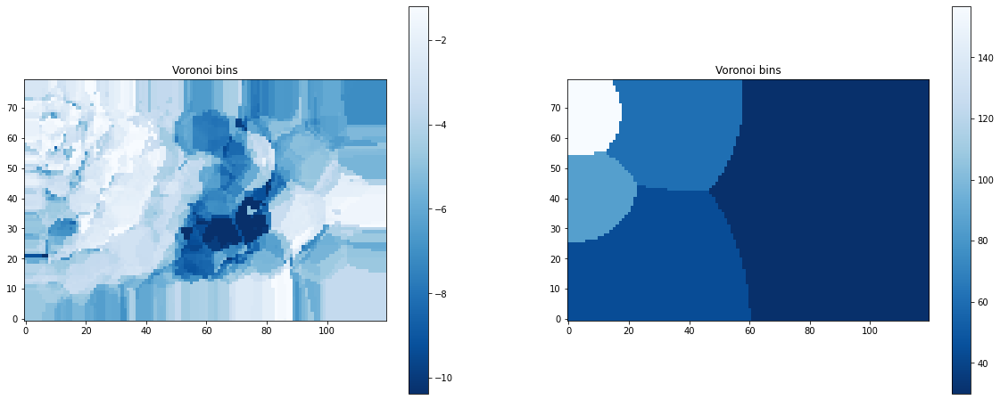

In [144]:
####
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

data = np.transpose(np.transpose(map_NP_voronoi[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0])#, orientation="horizontal")
ax[0].set_title("Voronoi bins")

####


data = np.transpose(voronoi_bins)
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[1])#, orientation="horizontal")
ax[1].set_title("Voronoi bins")




In [145]:
np.shape(voronoi_bins)

(120, 80)

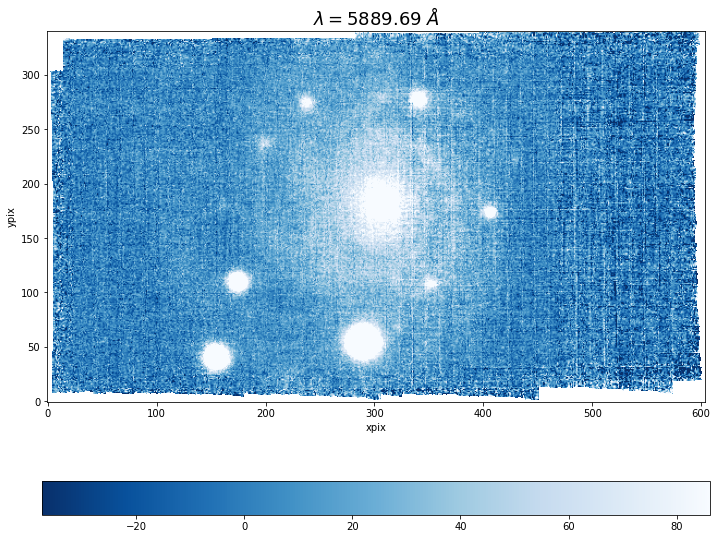

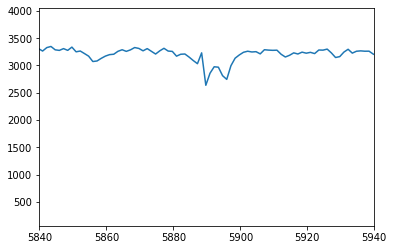

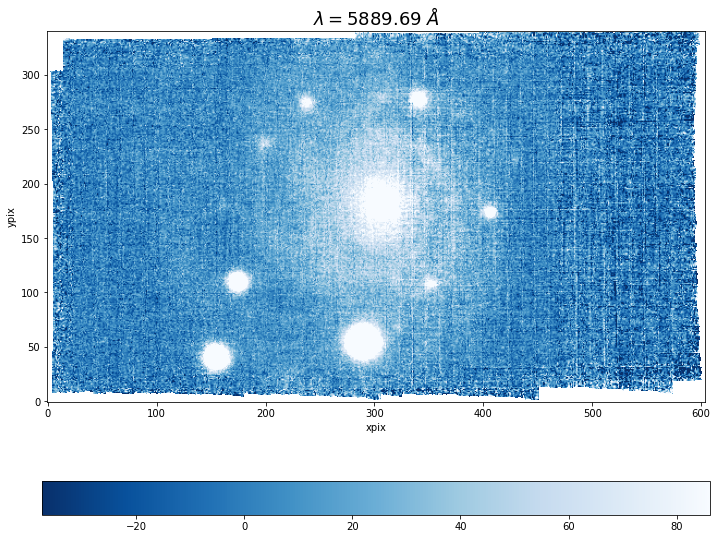

(5840.0, 5940.0)

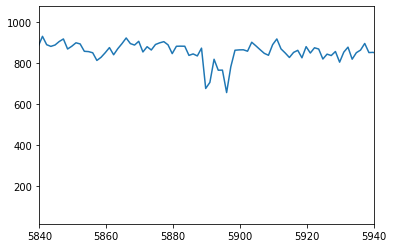

In [126]:
na_rest=5890

wave_selection=[]

wavelen,index=findWavelengths(wave, na_rest)

y_pos=50#200
x_pos=290#300
plot_image(cube[index],wavelen,index,'Blues_r')


plt.plot(wave, cube[:,y_pos,x_pos])
plt.xlim(na_rest-50,na_rest+50)

y_pos=40#200
x_pos=160#300
plot_image(cube[index],wavelen,index,'Blues_r')


plt.plot(wave, cube[:,y_pos,x_pos])
plt.xlim(na_rest-50,na_rest+50)

## Spectra at Hα

In [240]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

#plot_image(cube[index],wavelen,index,'Blues_r')


data=cube[index]

In [241]:
from astropy.stats import sigma_clipped_stats,gaussian_sigma_to_fwhm

from photutils import DAOStarFinder

mean, median, std = sigma_clipped_stats(data, sigma=5.0,maxiters=5) 
print((mean, median, std))

daofind = DAOStarFinder(fwhm=50, threshold=10.*std)

sources = daofind(data)

print("     Found %i stars in image " %len(sources))

(39.827423, 13.7210865, 63.754784)
     Found 6 stars in image 


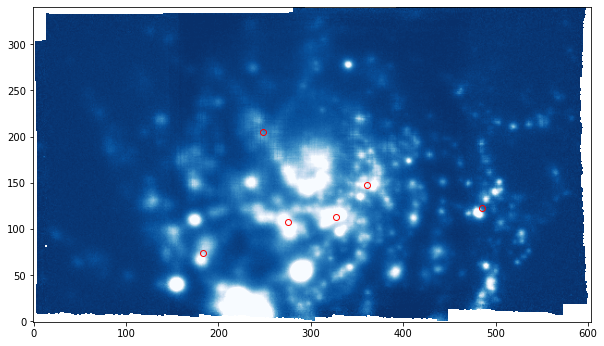

In [242]:

lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(10, 8))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
        
        
plt.plot(sources["xcentroid"],sources["ycentroid"],'or',mfc='none');

In [245]:
#defining (x,y) where we want to observe the spectra

i_brightest=np.argsort(sources['flux'])[0]

x_pos=int(sources[i_brightest][1])
y_pos=int(sources[i_brightest][2])

plotting spectra

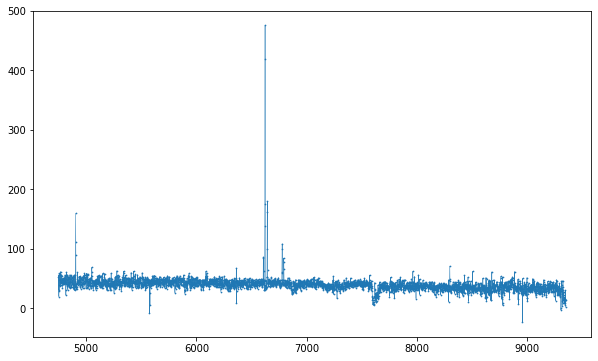

In [246]:
specdata=cube[:,y_pos,x_pos]

plt.figure(figsize=(10,6))

plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

Text(0.5, 1.0, 'Zoom in Halpha emission region')

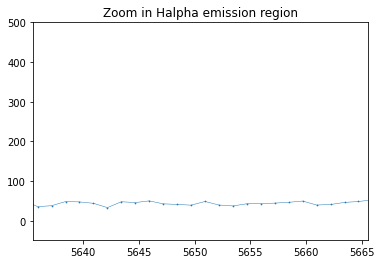

In [253]:
plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

plt.xlim(halpha_obs-15,halpha_obs+15)
#plt.ylim(-20,90)
plt.title("Zoom in Halpha emission region")

fitting a Gaussian

In [64]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6625)[1])

In [66]:
x = wave[bound1:bound2]
y = specdata[bound1:bound2]

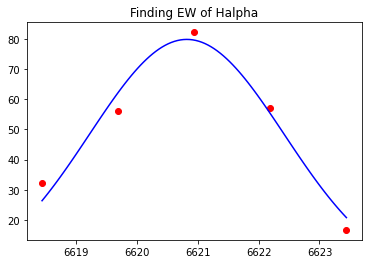

Fitted Amplitude (A): 79.7570857754474
Fitted Mean (mu): 6620.82077366716
Fitted Standard Deviation (sigma): 1.5989482179390269


In [67]:
initial_guess = [max(y), x[np.argmax(y)], 1]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(min(x), max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])

plt.scatter(x, y, label="Data", color="red")
plt.plot(x_fit, y_fit, label="Gaussian Fit", color="blue")

plt.title("Finding EW of Halpha")
plt.show()


# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")

Integral using Simpson's rule: 281.6268


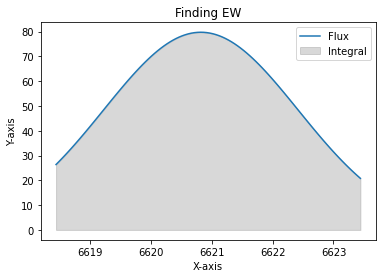

In [77]:

from scipy.integrate import simps

x = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

# Compute the integral using Simpson's rule
integral_simps = simps(y_fit, x)

print(f"Integral using Simpson's rule: {integral_simps:.4f}")

# Plot the curve
plt.plot(x, y_fit, label="Flux")
plt.fill_between(x, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


## Using Specutils

In [79]:
#from astropy.io import fits

from astropy import units as u

from astropy.visualization import quantity_support

quantity_support()  # for getting units on the axes below  

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x7f656aa54e80>

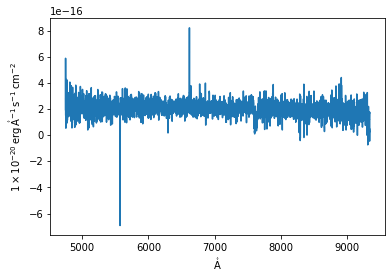

In [80]:
from specutils import Spectrum1D

lamb = wave * u.AA 

flux = specdata * 10**-17 * u.Unit(str(header["BUNIT"])) #taking the units from the header of the cube

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

f, ax = plt.subplots()  

ax.step(spec.spectral_axis, spec.flux) 
#ax.set_xlim(halpha_obs-15,halpha_obs+15)

Calculating SNR of the spectra

In [81]:
from specutils.analysis import snr_derived

snr_derived(spec)

<Quantity 4.432747>

In [82]:
import warnings

from specutils.fitting import fit_generic_continuum

with warnings.catch_warnings():  # Ignore warnings

    warnings.simplefilter('ignore')

    #normalizing by continuum estimate
    cont_norm_spec = spec / fit_generic_continuum(spec)(spec.spectral_axis) 

In [130]:
fit_generic_continuum.param_names

AttributeError: 'function' object has no attribute 'param_names'

ESTE ajuste está onde? fit_generic_continuum

(6598.263076399999, 6648.263076399999)

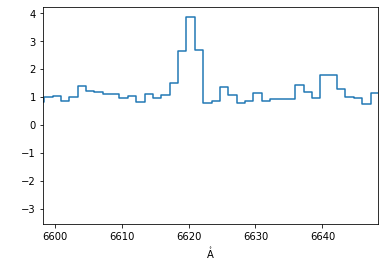

In [83]:
f, ax = plt.subplots()  

ax.step(cont_norm_spec.wavelength, cont_norm_spec.flux)  

ax.set_xlim((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm)  

In [84]:
from specutils import SpectralRegion

from specutils.analysis import equivalent_width

equivalent_width(cont_norm_spec, regions=SpectralRegion((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm))

<Quantity -11.53433117 Angstrom>

### Slicing a spectra into a particular region of interest

In [85]:
from specutils.manipulation import spectral_slab

ss = spectral_slab(cont_norm_spec, 5000.*u.AA, 5003.*u.AA)
ss

<Spectrum1D(flux=<Quantity [1.0896934 , 0.89806395]> (shape=(2,), mean=0.99388); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [5000.94238281 5002.19238281] Angstrom> (length=2))>

### Calculating Moments

In [86]:
from specutils.analysis import moment

m = moment(spec, order=1) 

m.shape  


print(m)

6953.192735554875 Angstrom


## Line Finding

In [87]:
cont_norm_spec; #continuum normalized spectra

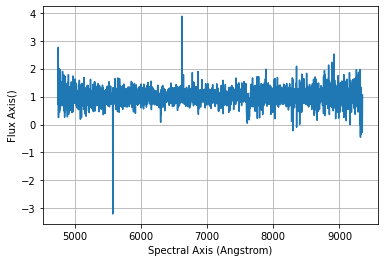

In [88]:
plt.plot(cont_norm_spec.spectral_axis, cont_norm_spec.flux) 

plt.xlabel('Spectral Axis ({})'.format(cont_norm_spec.spectral_axis.unit)) 

plt.ylabel('Flux Axis({})'.format(cont_norm_spec.flux.unit)) 

plt.grid(True)

Estimating uncertainty

In [89]:
ss = spectral_slab(cont_norm_spec, (halpha_obs-10)*u.AA, (halpha_obs+10)*u.AA) 
ss

<Spectrum1D(flux=<Quantity [0.83285743, 1.13031769, 0.9865351 , 1.07730173, 1.52001143,
           2.64860749, 3.87609295, 2.69161481, 0.78927651, 0.85823559,
           1.35906313, 1.08187466, 0.78013955, 0.85364203, 1.13819795,
           0.84613211]> (shape=(16,), mean=1.40437); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [6613.44238281 6614.69238281 6615.94238281 ... 6629.69238281 6630.94238281
 6632.19238281] Angstrom> (length=16))>

In [90]:
from specutils.manipulation import noise_region_uncertainty

noise_region = SpectralRegion(0*u.um, 3*u.um)

cont_norm_spec = noise_region_uncertainty(ss, noise_region)

from specutils.fitting import find_lines_threshold

lines = find_lines_threshold(ss, noise_factor=3)  

lines[lines['line_type'] == 'emission']


If you want to suppress this warning either type 'specutils.conf.do_continuum_function_check = False' or see http://docs.astropy.org/en/stable/config/#adding-new-configuration-items for other ways to configure the warning. [specutils.analysis.flux]


line_center,line_type,line_center_index
Angstrom,,
float64,str8,int64
6620.9423828125,emission,6


### Parameter Estimation

our specdata is in units 10**(-20) erg / (Angstrom s cm2) so we have to convert it to Jy using:

1 Jy = 10**(-23) erg/(cm^2)

In [91]:
(str(header["BUNIT"]))

'10**(-20)*erg/s/cm**2/Angstrom'

In [92]:
"""auxspec=specdata*10**(20) #this is in erg / (Angstrom s cm2)
auxspec=specdata*10**(20)*10**(-10) #this is in erg / ( s cm2)"""
auxspec=specdata*halpha_obs**2/(3.34*10**(-19))

In [93]:
lamb = wave * u.AA 
flux = auxspec * u.Unit(str('Jy')) 

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

In [99]:
from specutils import SpectralRegion

from specutils.fitting import estimate_line_parameters

from specutils.manipulation import extract_region

sub_region = SpectralRegion((halpha_obs-25)/10 *u.um, (halpha_obs+25)/10 *u.um)

sub_spectrum = extract_region(spec, sub_region)

In [100]:
result = estimate_line_parameters(spec, models.Gaussian1D())

print(result.amplitude)

print(result.mean) 

print(result.stddev) 

Parameter('amplitude', value=1.0786672501485288e+28, unit=Jy)
Parameter('mean', value=6953.192977414863, unit=Angstrom)
Parameter('stddev', value=1309.7939786398235, unit=Angstrom, bounds=(1.1754943508222875e-38, None))


In [97]:
from astropy.modeling import models
from specutils.fitting import fit_lines
from astropy import units as u


# Fit the spectrum and calculate the fitted flux values (``y_fit``)
g_init = models.Gaussian1D(amplitude=1.1*u.Jy, mean=halpha_obs*u.um, stddev=13*u.um)
g_fit = fit_lines(spec, g_init)


y_fit = g_fit(x*u.um)

# Plot the original spectrum and the fitted.
plt.plot(spec, , label="Original spectrum")
plt.plot(spec, y_fit, label="Fit result")
plt.title('Single fit peak')
plt.grid(True)
plt.legend()

SyntaxError: invalid syntax (1266487270.py, line 14)